## When Gradients Collide: Unraveling the Mystery of Imbalanced Data

In this investigation, we dive into the hidden battleground of gradient conflicts within neural networks. Using a 3-bin dataset with varying imbalance ratios, we'll expose how minority classes struggle to be heard while majority classes dominate the learning signal. Through vivid visualizations of loss landscapes and training dynamics, we'll reveal why models fail on imbalanced data and discover strategies to restore equilibrium to the learning process.



In [1]:
# Analysis of Imbalance Ratio Effects on Loss Landscape and Overfitting

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from typing import Tuple, List, Dict, Optional, Generator, Union
from scipy.interpolate import interpn

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)
tf.keras.utils.set_random_seed(42)
# Set TensorFlow deterministic operations
tf.config.experimental.enable_op_determinism()
# Set Python's random seed
import random
random.seed(42)
# Set environment variables for reproducibility
import os
os.environ['TF_DETERMINISTIC_OPS'] = '1'
os.environ['PYTHONHASHSEED'] = '42'

In [2]:
def compute_gradient(
    model: tf.keras.Model,
    X_batch: tf.Tensor,
    y_batch: tf.Tensor,
    sample_weights_batch: Optional[tf.Tensor] = None,
    debug: bool = False
) -> List[tf.Tensor]:
    """
    Compute the gradient of MSE loss w.r.t. model parameters for a given batch.
    If sample_weights_batch is provided, applies them to individual losses.
    
    Args:
        model: The TensorFlow model
        X_batch: Batch of features (tf.Tensor)
        y_batch: Batch of targets (tf.Tensor)
        sample_weights_batch: Optional batch of sample-weights (tf.Tensor). assumed to not be probabilities.
        debug: Whether to print debug information (default: False)
        
    Returns:
        A list of gradients (one element per trainable variable)
    """
    # Start gradient tape to track operations for automatic differentiation
    with tf.GradientTape() as tape:
        # Get model predictions (forward pass)
        y_pred = model(X_batch, training=True)
        if debug:
            print(f"X_batch shape: {X_batch.shape}, y_batch shape: {y_batch.shape}")
            print(f"y_pred shape: {y_pred.shape}")
        
        # Calculate squared error for each sample
        # expand_dims adds an axis to y_batch to match y_pred's shape (which has a final dimension for output features)
        y_batch_expanded = tf.expand_dims(y_batch, -1)
        if debug:
            print(f"y_batch_expanded shape: {y_batch_expanded.shape}")
        
        losses = tf.square(y_pred - y_batch_expanded)
        if debug:
            print(f"losses shape: {losses.shape}")
        
        # Apply sample weights if provided
        # This allows giving different importance to different samples in the batch
        if sample_weights_batch is not None:
            # expand_dims allows broadcasting when multiplying
            weights_expanded = tf.expand_dims(sample_weights_batch, -1)
            if debug:
                print(f"sample_weights_batch shape: {sample_weights_batch.shape}")
                print(f"weights_expanded shape: {weights_expanded.shape}")
            losses *= weights_expanded
            if debug:
                print(f"weighted losses shape: {losses.shape}")
        
        # Calculate mean loss across the batch
        loss = tf.reduce_mean(losses)
        if debug:
            print(f"final loss shape: {loss.shape}")
    
    # Compute gradients of loss with respect to all trainable variables
    # Returns a list of tensors (one per trainable variable)
    grads = tape.gradient(loss, model.trainable_variables)
    if debug:
        print(f"Number of gradient tensors: {len(grads)}")
        for i, g in enumerate(grads):
            print(f"grad[{i}] shape: {g.shape}")
    return grads

# Helper function to flatten and concatenate all gradients into a single vector
def flatten_concat(grad_list, debug=False):
    """
    Flatten and concatenate all gradients into a single vector.
    
    Args:
        grad_list: List of gradient tensors
        debug: Whether to print debug information (default: False)
    
    Returns:
        A single vector containing all flattened gradients
    """
    # Filter out None gradients (which can happen if a variable isn't used in computation)
    filtered_grads = [g for g in grad_list if g is not None]
    
    if debug:
        print(f"Number of gradient tensors: {len(filtered_grads)}")
        for i, g in enumerate(filtered_grads):
            print(f"  grad[{i}] shape before reshaping: {g.shape}")
    
    # Reshape each gradient tensor to a flat vector and concatenate all
    flattened = [tf.reshape(g, [-1]) for g in filtered_grads]
    if debug:
        for i, f in enumerate(flattened):
            print(f"  flattened[{i}] shape: {f.shape}")
    
    # Concatenate all flattened gradients into a single vector
    result = tf.concat(flattened, axis=0)
    if debug:
        print(f"Concatenated gradient vector shape: {result.shape}")
    return result


def cosine_similarity(
    grads1: List[tf.Tensor],
    grads2: List[tf.Tensor],
    debug: bool = False
) -> float:
    """
    Compute the cosine similarity between two gradient lists.
    Each list is the set of gradients for the model variables.
    
    Cosine similarity measures the angle between two vectors:
    cos(θ) = (v1·v2)/(||v1||·||v2||)
    
    It ranges from -1 (opposite directions) to 1 (same direction),
    with 0 indicating orthogonal vectors.
    
    Args:
        grads1: List of tf.Tensors (gradients from group 1)
        grads2: List of tf.Tensors (gradients from group 2)
        debug: Whether to print debug information (default: False)
        
    Returns:
        The scalar cosine similarity between grads1 and grads2.
        If both gradients are zero vectors, returns 1.0 (maximally similar).
        If only one gradient is zero while the other is non-zero, returns 0.0.
    """

    
    # Flatten and concatenate gradients from each list
    if debug:
        print("Processing grads1:")
    v1 = flatten_concat(grads1, debug=debug)
    if debug:
        print(f"Gradient vector 1 shape: {v1.shape}")
        print("Processing grads2:")
    v2 = flatten_concat(grads2, debug=debug)
    if debug:
        print(f"Gradient vector 2 shape: {v2.shape}")
    
    # Calculate L2 norms (magnitude) of the gradient vectors
    norm1 = tf.norm(v1)
    norm2 = tf.norm(v2)
    if debug:
        print(f"Gradient vector norms: {norm1:.6f}, {norm2:.6f}")
    
    # Handle edge cases: zero gradients
    # Two zero vectors are considered maximally similar (cos_sim = 1.0)
    # If only one is zero, they're considered orthogonal (cos_sim = 0.0)
    if norm1 < 1e-15 and norm2 < 1e-15:
        if debug:
            print("Both gradient vectors are effectively zero, returning similarity = 1.0")
        return 1.0
    elif norm1 < 1e-15 or norm2 < 1e-15:
        if debug:
            print("One gradient vector is effectively zero, returning similarity = 0.0")
        return 0.0
    
    # Calculate cosine similarity: dot product divided by product of norms
    # Calculate dot product using element-wise multiplication and sum
    dot_product = tf.reduce_sum(v1 * v2)
    if debug:
        print(f"Dot product: {dot_product:.6f}")
    
    cos_sim = dot_product / (norm1 * norm2)
    if debug:
        print(f"Cosine similarity: {cos_sim:.6f}")
    
    # Convert to Python float and return
    return float(cos_sim.numpy())

In [3]:
def stratified_batch_dataset(
        X: np.ndarray,
        y: np.ndarray,
        batch_size: int,
        sample_weights: Optional[np.ndarray] = None,
        shuffle: bool = True
) -> Tuple[tf.data.Dataset, int]:
    """
    Creates a TensorFlow dataset from the stratified data generator, with groups generated only once.

    Parameters:
    -----------
    X : np.ndarray
        Feature matrix of shape (n_samples, n_features).
    y : np.ndarray
        Label vector of shape (n_samples,).
    batch_size : int
        Number of samples in each batch.
    sample_weights : Optional[np.ndarray], optional
        Sample weights of shape (n_samples,). If None, no sample weights will be used.
    shuffle : bool, optional
        If True, shuffles the groups and the elements within each group before each epoch (default is True).

    Returns:
    --------
    Tuple[tf.data.Dataset, int]:
        - A TensorFlow dataset object with stratified batches.
        - The number of steps per epoch (i.e., how many batches per epoch).
    """
    # Generate the stratified groups once
    groups = stratified_groups(y, batch_size)

    # Use from_generator to create a dataset from the stratified_data_generator
    if sample_weights is not None:
        # Dataset with sample weights
        dataset = tf.data.Dataset.from_generator(
            lambda: stratified_data_generator(X, y, groups, sample_weights=sample_weights, shuffle=shuffle),
            output_signature=(
                tf.TensorSpec(shape=(batch_size, X.shape[1]), dtype=tf.float32),
                tf.TensorSpec(shape=(batch_size,), dtype=tf.float32),
                tf.TensorSpec(shape=(batch_size,), dtype=tf.float32)  # Sample weights
            )
        )
    else:
        # Dataset without sample weights
        dataset = tf.data.Dataset.from_generator(
            lambda: stratified_data_generator(X, y, groups, sample_weights=None, shuffle=shuffle),
            output_signature=(
                tf.TensorSpec(shape=(batch_size, X.shape[1]), dtype=tf.float32),
                tf.TensorSpec(shape=(batch_size,), dtype=tf.float32)
            )
        )
    
    # Compute the number of steps per epoch
    steps_per_epoch = len(y) // batch_size
    # Prefetch for performance optimization
    dataset = dataset.prefetch(tf.data.AUTOTUNE)

    return dataset, steps_per_epoch

def stratified_groups(y: np.ndarray, batch_size: int, debug: bool = False) -> np.ndarray:
    """
    Create stratified groups from the dataset by sorting it based on the labels.
    The number of groups corresponds to the batch size, and each group will have
    samples with similar label distributions. The result is a 2D array where each
    group is padded to the same size. Verified to work.

    Parameters:
    -----------
    y : np.ndarray
        Label vector of shape (n_samples, 1).
    batch_size : int
        Number of groups, which will correspond to the number of samples in each batch.

    Returns:
    --------
    np.ndarray:
        A 2D array where each row represents a stratified group, and all rows have the same length.
    """
    # Sort the dataset along the second dimension (axis=0)
    sorted_indices = np.argsort(y, axis=0).flatten()

    # Debugging: Check the shape of y and print sorted indices
    if debug:
        print(f"Shape of y: {y.shape}")
        print(f"Unique values in y: {np.unique(y)}")
        print(f"Sorted indices: {sorted_indices}")
        print(f"Labels sorted by indices: {y[sorted_indices].flatten()}")  # To see how the labels are sorted

    # Create groups by slicing the sorted data indices
    groups = np.array_split(sorted_indices, batch_size)

    # Find the maximum group size
    max_size = max(len(group) for group in groups)

    # Pad the groups with their last element to make all groups the same size
    padded_groups = np.array([
        np.pad(group, (0, max_size - len(group)), 'edge') for group in groups
    ])

    return padded_groups


def stratified_data_generator(
        X: np.ndarray,
        y: np.ndarray,
        groups: np.ndarray,  # Assuming groups is a 2D array
        sample_weights: Optional[np.ndarray] = None,
        shuffle: bool = True,
        debug: bool = False
) -> Generator[Union[Tuple[np.ndarray, np.ndarray], Tuple[np.ndarray, np.ndarray, np.ndarray]], None, None]:
    """
    Generator that yields stratified batches of (X, y) or (X, y, sample_weights) by selecting one sample from each group.
    The groups are passed as a 2D array of sample indices.

    Parameters:
    -----------
    X : np.ndarray
        Feature matrix of shape (n_samples, n_features).
    y : np.ndarray
        Label vector of shape (n_samples,).
    groups : np.ndarray
        Precomputed groups of sample indices for stratified sampling, shape (n_groups, group_size).
    sample_weights : Optional[np.ndarray], optional
        Sample weights of shape (n_samples,). If None, no sample weights will be included in yield.
    shuffle : bool, optional
        If True, shuffles the groups and the elements within each group before each epoch (default is True).
    debug : bool, optional
        If True, prints the generated batches for debugging purposes (default is False).

    Yields:
    -------
    Union[Tuple[np.ndarray, np.ndarray], Tuple[np.ndarray, np.ndarray, np.ndarray]]:
        If sample_weights is None:
            Batches of feature matrix and label vector of size (batch_size, n_features) and (batch_size,)
        Otherwise:
            Batches of feature matrix, label vector, and sample weights of size 
            (batch_size, n_features), (batch_size,), and (batch_size,)
    """

    while True:
        if shuffle: np.apply_along_axis(np.random.shuffle, 1, groups)  # Shuffle within each group (columns)
        # Select the first element from each group to form the batch
        batch_indices = groups[:, 0]

        # Optionally, shuffle the order of the selected samples to randomize batch order
        np.random.shuffle(batch_indices)

        # Create the feature and label batches using the selected indices
        batch_X = X[batch_indices]
        batch_y = y[batch_indices]

        # Ensure the labels have the correct shape
        batch_y = batch_y.reshape(-1)

        # Debugging: Print the current batch
        if debug:
            print(f'Batch shape: {batch_X.shape}, {batch_y.shape}')
            print(f"Batch indices: {batch_indices}")
            if sample_weights is not None:
                print(f"Batch sample weights shape: {sample_weights[batch_indices].shape}")

        # Yield the batch with or without sample weights
        if sample_weights is not None:
            batch_weights = sample_weights[batch_indices]
            yield batch_X, batch_y, batch_weights
        else:
            yield batch_X, batch_y

In [4]:
def plot_training_curves(
        history: Dict[str, List[float]], 
        title: str = "Training and Validation Loss"
    ) -> None:
    """
    Plot training and validation loss curves.
    
    Args:
        history: Training history dictionary
        title: Plot title
    """
    plt.figure(figsize=(10, 6))
    plt.plot(history['train_loss'], label='Training Loss', linewidth=2)
    plt.plot(history['val_loss'], label='Validation Loss', linewidth=2)
    plt.title(title)
    plt.xlabel('Epoch')
    plt.ylabel('Loss (MSE)')
    plt.legend()
    plt.grid(alpha=0.3)
    plt.yscale('log')
    plt.show()


def plot_grad_cos_similarity(
    grad_cos_sim: List[float],
    title: str = "Gradient Cosine Similarity (Freq vs. Rare)"
) -> None:
    """
    Plot the gradient cosine similarity (freq vs. rare) for each training iteration.
    
    Args:
        grad_cos_sim: List of cosine similarities per iteration (batch)
        title: Plot title
    """
    plt.figure(figsize=(10, 6))
    
    # Plot raw data with transparency
    plt.plot(grad_cos_sim, label='Raw Similarity', linewidth=1, alpha=0.4, color='blue')
    
    # Add trend line (moving average)
    window_size = min(25, len(grad_cos_sim) // 10)  # Adaptive window size
    if window_size > 0:
        trend = np.convolve(grad_cos_sim, np.ones(window_size)/window_size, mode='valid')
        # Pad the trend line to match original data length
        pad_size = len(grad_cos_sim) - len(trend)
        trend_padded = np.pad(trend, (pad_size, 0), 'edge')
        plt.plot(trend_padded, label='Trend', linewidth=2.5, color='darkblue')
    
    plt.title(title)
    plt.xlabel("Iteration (batch)")
    plt.ylabel("Cosine Similarity")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()


In [5]:
def create_simple_model(weight_decay: float = 0.01) -> tf.keras.Model:
    """
    Create a simple neural network with a hidden layer and weight decay regularization.
    
    Args:
        weight_decay: L2 regularization factor for weight decay
    
    Returns:
        A TensorFlow model with a hidden layer using LeakyReLU activation and weight decay
    """
    regularizer = tf.keras.regularizers.l2(weight_decay)
    
    model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(2,)),
        tf.keras.layers.Dense(
            2,
            use_bias=True,
            activation=None,
            kernel_initializer='glorot_uniform',
            kernel_regularizer=regularizer,
            bias_regularizer=regularizer
        ),
        tf.keras.layers.LeakyReLU(),
        tf.keras.layers.Dense(
            1, 
            use_bias=True, 
            activation=None, 
            kernel_initializer='glorot_uniform',
            kernel_regularizer=regularizer,
            bias_regularizer=regularizer
        )
    ])

    # print the model summary
    # model.summary()
    
    # The model now has more parameters due to the hidden layer
    # We no longer need to verify the exact parameter count
    
    return model

In [6]:
class ImbalancedCircleDataset:
    """
    Generates a simple 2D regression dataset with imbalanced frequency bins.
    - Features: (x, y) coordinates
    - Target: label = distance to center (sqrt(x^2 + y^2)) + noise
    - Three bins: frequent (closest to origin), middle, and rare (furthest from origin)
    """
    
    def __init__(
            self, 
            num_freq_in_train: int = 10000,  # Number of frequent samples in training set
            imbalance_ratio_freq_midd: float = 1.0,  # Ratio of frequent to middle samples
            imbalance_ratio_midd_rare: float = 1.0,  # Ratio of middle to rare samples
            freq_radius: Tuple[float, float] = (0.0, 0.3),  # (Min, Max) radius for frequent samples
            midd_radius: Tuple[float, float] = (0.3, 0.7),  # (Min, Max) radius for middle samples
            rare_radius: Tuple[float, float] = (0.7, 1.0),  # (Min, Max) radius for rare samples
            noise_level: float = 0.2,  # Standard deviation of Gaussian noise
            num_freq_in_val: int = 500  # Number of frequent samples in validation set
        ):
        """
        Initialize the dataset generator.
        
        Args:
            num_freq_in_train: Number of frequent samples in the training set
            imbalance_ratio_freq_midd: Ratio of frequent to middle samples
            imbalance_ratio_midd_rare: Ratio of middle to rare samples
            freq_radius: Tuple of (min, max) radius from origin for frequent samples
            midd_radius: Tuple of (min, max) radius from origin for middle samples
            rare_radius: Tuple of (min, max) radius from origin for rare samples
            noise_level: Standard deviation of Gaussian noise added to targets
            num_freq_in_val: Number of frequent samples in validation set
        """
        self.num_freq_in_train = num_freq_in_train
        self.imbalance_ratio_freq_midd = imbalance_ratio_freq_midd
        self.imbalance_ratio_midd_rare = imbalance_ratio_midd_rare
        self.freq_min_radius, self.freq_max_radius = freq_radius
        self.midd_min_radius, self.midd_max_radius = midd_radius
        self.rare_min_radius, self.rare_max_radius = rare_radius
        self.noise_level = noise_level
        self.num_freq_in_val = num_freq_in_val
        self._generate_base_dataset()
    
    def _generate_polar_samples(self, n_samples: int, min_radius: float, max_radius: float) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
        """
        Generate samples in polar coordinates and convert to Cartesian.
        
        Args:
            n_samples: Number of samples to generate
            min_radius: Minimum radius from origin
            max_radius: Maximum radius from origin
            
        Returns:
            Tuple of (x1, x2, r) arrays where x1 and x2 are Cartesian coordinates and r is the radius
        """
        # Generate random points with radius from min_radius to max_radius
        r = np.random.uniform(min_radius, max_radius, n_samples)
        # Generate random points with angle from 0 to 2*pi
        theta = np.random.uniform(0, 2 * np.pi, n_samples)
        
        # Converting from polar to Cartesian coordinates
        x1 = r * np.cos(theta)
        x2 = r * np.sin(theta)
        
        return x1, x2, r
    
    def _generate_base_dataset(self) -> None:
        """
        Generate the base dataset with frequent, middle, and rare samples.
        This is called once during initialization to maintain consistency.
        """
        # Calculate total number of frequent samples needed (train + val)
        total_freq_samples = self.num_freq_in_train + self.num_freq_in_val
        
        # Create the frequent samples (closest to origin)
        x1_freq, x2_freq, r_freq = self._generate_polar_samples(
            total_freq_samples, self.freq_min_radius, self.freq_max_radius
        )
        
        # Create middle samples
        num_potential_midd = total_freq_samples  # Same as total frequent samples
        x1_midd, x2_midd, r_midd = self._generate_polar_samples(
            num_potential_midd, self.midd_min_radius, self.midd_max_radius
        )
        
        # Create rare samples (furthest from origin)
        num_potential_rare = total_freq_samples  # Same as total frequent samples
        x1_rare, x2_rare, r_rare = self._generate_polar_samples(
            num_potential_rare, self.rare_min_radius, self.rare_max_radius
        )
        
        # Add Gaussian noise to make the dataset more realistic
        noise_freq = np.random.normal(0, self.noise_level, total_freq_samples)
        noise_midd = np.random.normal(0, self.noise_level, num_potential_midd)
        noise_rare = np.random.normal(0, self.noise_level, num_potential_rare)
        
        # Calculate targets: label = distance to center (sqrt(x^2 + y^2)) + noise
        y_freq = r_freq + noise_freq
        y_midd = r_midd + noise_midd
        y_rare = r_rare + noise_rare
        
        # Store all potential samples
        self.x1_freq, self.x2_freq, self.y_freq = x1_freq, x2_freq, y_freq 
        self.x1_midd, self.x2_midd, self.y_midd = x1_midd, x2_midd, y_midd
        self.x1_rare, self.x2_rare, self.y_rare = x1_rare, x2_rare, y_rare
        
        # Split data into train and validation sets
        self._split_data_into_train_val(self.num_freq_in_train, self.num_freq_in_val)
        
        # Create storage for current masks
        self.freq_mask, self.midd_mask, self.rare_mask = None, None, None
        self.val_freq_mask, self.val_midd_mask, self.val_rare_mask = None, None, None
    
    def _split_data_into_train_val(self, num_freq_in_train: int, num_freq_in_val: int) -> None:
        """
        Split the generated data into training and validation sets.
        
        Args:
            num_freq_in_train: Number of frequent samples in training set
            num_freq_in_val: Number of frequent samples in validation set
        """
        # train idx 
        train_upper_idx = self.num_freq_in_train
        val_upper_idx = self.num_freq_in_train + num_freq_in_val

        # Separate training and validation data for frequent samples
        self.x1_freq_train = self.x1_freq[:train_upper_idx]
        self.x2_freq_train = self.x2_freq[:train_upper_idx]
        self.y_freq_train = self.y_freq[:train_upper_idx]
        
        self.x1_freq_val = self.x1_freq[train_upper_idx:val_upper_idx]
        self.x2_freq_val = self.x2_freq[train_upper_idx:val_upper_idx]
        self.y_freq_val = self.y_freq[train_upper_idx:val_upper_idx]
        
        # Separate training and validation data for middle samples
        self.x1_midd_train = self.x1_midd[:train_upper_idx]
        self.x2_midd_train = self.x2_midd[:train_upper_idx]
        self.y_midd_train = self.y_midd[:train_upper_idx]
        
        self.x1_midd_val = self.x1_midd[train_upper_idx:val_upper_idx]
        self.x2_midd_val = self.x2_midd[train_upper_idx:val_upper_idx]
        self.y_midd_val = self.y_midd[train_upper_idx:val_upper_idx]
        
        # Separate training and validation data for rare samples
        self.x1_rare_train = self.x1_rare[:train_upper_idx]
        self.x2_rare_train = self.x2_rare[:train_upper_idx]
        self.y_rare_train = self.y_rare[:train_upper_idx]
        
        self.x1_rare_val = self.x1_rare[train_upper_idx:val_upper_idx]
        self.x2_rare_val = self.x2_rare[train_upper_idx:val_upper_idx]
        self.y_rare_val = self.y_rare[train_upper_idx:val_upper_idx]
        
    def _compute_sample_weights(self, freq_mask: np.ndarray, midd_mask: np.ndarray) -> np.ndarray:
        """
        Compute sample weights based on class frequency and the desired imbalance ratios.
        
        Args:
            freq_mask: Boolean mask indicating which samples are from the frequent class
            midd_mask: Boolean mask indicating which samples are from the middle class
            
        Returns:
            Sample weights array with same length as the mask
        """
        # Calculate the actual numbers of frequent, middle and rare samples
        num_samples = len(freq_mask)
        num_freq = np.sum(freq_mask)
        num_midd = np.sum(midd_mask)
        num_rare = num_samples - num_freq - num_midd
        
        # Calculate weights that account for the imbalance ratios
        if num_freq > 0 and num_midd > 0 and num_rare > 0:
            # Base weight for frequent class
            freq_weight = 1.0
            # Middle class weight based on freq-to-midd ratio
            midd_weight = self.imbalance_ratio_freq_midd
            # Rare class weight based on midd-to-rare ratio (compounded)
            rare_weight = self.imbalance_ratio_freq_midd * self.imbalance_ratio_midd_rare
            
            # Normalize weights so they sum to num_samples (preserves overall scale)
            total_weight = (num_freq * freq_weight) + (num_midd * midd_weight) + (num_rare * rare_weight)
            normalization_factor = num_samples / total_weight
            
            freq_weight *= normalization_factor
            midd_weight *= normalization_factor
            rare_weight *= normalization_factor
        else:
            # Avoid division by zero
            freq_weight = 1.0 if num_freq > 0 else 0.0
            midd_weight = 1.0 if num_midd > 0 else 0.0
            rare_weight = 1.0 if num_rare > 0 else 0.0
        
        # Create weight array
        weights = np.ones(num_samples)
        weights[freq_mask] = freq_weight
        weights[midd_mask] = midd_weight
        # The remaining samples (neither freq nor midd) are rare
        rare_mask = ~(freq_mask | midd_mask)
        weights[rare_mask] = rare_weight
        
        return weights
    
    def _prepare_dataset(
            self, 
            x1_freq: np.ndarray, x2_freq: np.ndarray, y_freq: np.ndarray,
            x1_midd: np.ndarray, x2_midd: np.ndarray, y_midd: np.ndarray,
            x1_rare: np.ndarray, x2_rare: np.ndarray, y_rare: np.ndarray,
            num_midd: int, num_rare: int
        ) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
        """
        Prepare dataset by combining frequent, middle, and rare samples with proper masks and weights.
        
        Args:
            x1_freq, x2_freq: Coordinates of frequent samples
            y_freq: Target values for frequent samples
            x1_midd, x2_midd: Coordinates of middle samples
            y_midd: Target values for middle samples
            x1_rare, x2_rare: Coordinates of rare samples
            y_rare: Target values for rare samples
            num_midd: Number of middle samples to include
            num_rare: Number of rare samples to include
            
        Returns:
            Tuple of (features, targets, sample_weights)
        """
        num_freq = len(x1_freq)
        
        # Handle edge cases where there are no middle or rare samples available
        has_midd = len(x1_midd) > 0 and num_midd > 0
        has_rare = len(x1_rare) > 0 and num_rare > 0
        
        if not has_midd and not has_rare:
            # Just use frequent samples only
            X = np.column_stack([x1_freq, x2_freq])
            y = y_freq
            
            # Create masks for visualization
            freq_mask = np.ones(num_freq, dtype=bool)
            midd_mask = np.zeros(num_freq, dtype=bool)
            
            # Compute sample weights
            sample_weights = self._compute_sample_weights(freq_mask, midd_mask)
            
            return X, y, sample_weights
        
        # Select middle samples (deterministically)
        if has_midd:
            indices_midd = np.linspace(0, len(x1_midd)-1, num_midd, dtype=int)
            x1_midd_selected = x1_midd[indices_midd]
            x2_midd_selected = x2_midd[indices_midd]
            y_midd_selected = y_midd[indices_midd]
        else:
            x1_midd_selected = np.array([])
            x2_midd_selected = np.array([])
            y_midd_selected = np.array([])
            num_midd = 0
            
        # Select rare samples (deterministically)
        if has_rare:
            indices_rare = np.linspace(0, len(x1_rare)-1, num_rare, dtype=int)
            x1_rare_selected = x1_rare[indices_rare]
            x2_rare_selected = x2_rare[indices_rare]
            y_rare_selected = y_rare[indices_rare]
        else:
            x1_rare_selected = np.array([])
            x2_rare_selected = np.array([])
            y_rare_selected = np.array([])
            num_rare = 0
        
        # Combine frequent, middle, and rare samples
        X = np.column_stack([
            np.concatenate([x1_freq, x1_midd_selected, x1_rare_selected]),
            np.concatenate([x2_freq, x2_midd_selected, x2_rare_selected])
        ])
        
        # Target is distance to center + noise (noise already added during generation)
        y = np.concatenate([y_freq, y_midd_selected, y_rare_selected])
        
        # Create masks for visualization and sample weighting
        freq_mask = np.concatenate([
            np.ones(num_freq, dtype=bool), 
            np.zeros(num_midd, dtype=bool),
            np.zeros(num_rare, dtype=bool)
        ])
        
        midd_mask = np.concatenate([
            np.zeros(num_freq, dtype=bool), 
            np.ones(num_midd, dtype=bool),
            np.zeros(num_rare, dtype=bool)
        ])
        
        # Compute sample weights
        sample_weights = self._compute_sample_weights(freq_mask, midd_mask)
        
        return X, y, sample_weights
    
    def get_dataset(
            self, 
            imbalance_ratio_freq_midd: Optional[float] = None,
            imbalance_ratio_midd_rare: Optional[float] = None
        ) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
        """
        Get training dataset with specified imbalance ratios.
        
        Args:
            imbalance_ratio_freq_midd: Override the default frequent-to-middle imbalance ratio
            imbalance_ratio_midd_rare: Override the default middle-to-rare imbalance ratio
        
        Returns:
            Tuple of (features, targets, sample_weights) where features has shape (n_samples, 2),
            targets has shape (n_samples,), and sample_weights has shape (n_samples,)
        """
        if imbalance_ratio_freq_midd is None:
            imbalance_ratio_freq_midd = self.imbalance_ratio_freq_midd
        
        if imbalance_ratio_midd_rare is None:
            imbalance_ratio_midd_rare = self.imbalance_ratio_midd_rare
            
        # Store for sample weight calculation
        self.imbalance_ratio_freq_midd = imbalance_ratio_freq_midd
        self.imbalance_ratio_midd_rare = imbalance_ratio_midd_rare
        
        # Calculate how many middle and rare samples to include
        num_freq = len(self.x1_freq_train)
        num_midd = int(num_freq / imbalance_ratio_freq_midd)
        num_rare = int(num_midd / imbalance_ratio_midd_rare)
        
        # Ensure we have at least 1 sample of each type, but not more than available
        num_midd = max(1, min(num_midd, len(self.x1_midd_train)))
        num_rare = max(1, min(num_rare, len(self.x1_rare_train)))
        
        X, y, sample_weights = self._prepare_dataset(
            self.x1_freq_train, self.x2_freq_train, self.y_freq_train,
            self.x1_midd_train, self.x2_midd_train, self.y_midd_train,
            self.x1_rare_train, self.x2_rare_train, self.y_rare_train,
            num_midd, num_rare
        )
        
        # Store masks for visualization
        total_samples = num_freq + num_midd + num_rare
        
        self.freq_mask = np.zeros(total_samples, dtype=bool)
        self.freq_mask[:num_freq] = True
        
        self.midd_mask = np.zeros(total_samples, dtype=bool)
        self.midd_mask[num_freq:num_freq+num_midd] = True
        
        self.rare_mask = np.zeros(total_samples, dtype=bool)
        self.rare_mask[num_freq+num_midd:] = True
        
        return X, y, sample_weights
    
    def get_val_dataset(
            self, 
            imbalance_ratio_freq_midd: Optional[float] = None,
            imbalance_ratio_midd_rare: Optional[float] = None
        ) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
        """
        Get the validation dataset with the specified imbalance ratios.
        
        Args:
            imbalance_ratio_freq_midd: Override the default frequent-to-middle imbalance ratio
            imbalance_ratio_midd_rare: Override the default middle-to-rare imbalance ratio
            
        Returns:
            Tuple of (features, targets, sample_weights) for validation
        """
        if imbalance_ratio_freq_midd is None:
            imbalance_ratio_freq_midd = self.imbalance_ratio_freq_midd
            
        if imbalance_ratio_midd_rare is None:
            imbalance_ratio_midd_rare = self.imbalance_ratio_midd_rare
        
        # Calculate how many validation samples to include from each class
        num_freq_val = len(self.x1_freq_val)
        num_midd_val = int(num_freq_val / imbalance_ratio_freq_midd)
        num_rare_val = int(num_midd_val / imbalance_ratio_midd_rare)
        
        # Ensure we have at least 1 sample of each type, but not more than available
        num_midd_val = max(1, min(num_midd_val, len(self.x1_midd_val)))
        num_rare_val = max(1, min(num_rare_val, len(self.x1_rare_val)))
        
        X_val, y_val, sample_weights = self._prepare_dataset(
            self.x1_freq_val, self.x2_freq_val, self.y_freq_val,
            self.x1_midd_val, self.x2_midd_val, self.y_midd_val,
            self.x1_rare_val, self.x2_rare_val, self.y_rare_val,
            num_midd_val, num_rare_val
        )
        
        # Store masks for visualization
        total_val_samples = num_freq_val + num_midd_val + num_rare_val
        
        self.val_freq_mask = np.zeros(total_val_samples, dtype=bool)
        self.val_freq_mask[:num_freq_val] = True
        
        self.val_midd_mask = np.zeros(total_val_samples, dtype=bool)
        self.val_midd_mask[num_freq_val:num_freq_val+num_midd_val] = True
        
        self.val_rare_mask = np.zeros(total_val_samples, dtype=bool)
        self.val_rare_mask[num_freq_val+num_midd_val:] = True
        
        return X_val, y_val, sample_weights

In [7]:
def plot_dataset(
        dataset: ImbalancedCircleDataset,
        X: np.ndarray, 
        y: np.ndarray, 
        X_val: Optional[np.ndarray] = None, 
        y_val: Optional[np.ndarray] = None,  
        title: str = "Dataset Visualization",
        draw_circles: bool = True,
        debug: bool = False
    ) -> None:
    """
    Plot the dataset showing frequent, middle, and rare samples.
    
    Args:
        dataset: The ImbalancedCircleDataset object containing masks for the bins
        X: Feature array of shape (n_samples, 2)
        y: Target array of shape (n_samples,)
        X_val: Optional validation feature array of shape (n_samples, 2)
        y_val: Optional validation target array of shape (n_samples,)
        title: Plot title
        draw_circles: Whether to draw circles showing the bin boundaries
        debug: Whether to print debug information about dataset composition
    """
    # Get masks from the dataset
    freq_mask = dataset.freq_mask
    midd_mask = dataset.midd_mask
    rare_mask = dataset.rare_mask
    
    # Print debug information if requested
    if debug:
        print(f"Training set composition:")
        print(f"  Frequent samples: {np.sum(freq_mask)}")
        print(f"  Middle samples: {np.sum(midd_mask)}")
        print(f"  Rare samples: {np.sum(rare_mask)}")
        if X_val is not None and y_val is not None:
            print(f"Validation set composition:")
            print(f"  Frequent samples: {np.sum(dataset.val_freq_mask)}")
            print(f"  Middle samples: {np.sum(dataset.val_midd_mask)}")
            print(f"  Rare samples: {np.sum(dataset.val_rare_mask)}")
    
    # Determine if we need one or two subplots
    if X_val is not None and y_val is not None:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    else:
        fig, ax1 = plt.subplots(1, 1, figsize=(10, 8))
    
    # First subplot: Training data
    # Plot frequent samples
    scatter1 = ax1.scatter(
        X[freq_mask, 0], X[freq_mask, 1], 
        c=y[freq_mask], cmap='Blues', s=50, alpha=0.8,
        label=f'Frequent ({np.sum(freq_mask)} samples)'
    )
    
    # Plot middle samples
    scatter2 = ax1.scatter(
        X[midd_mask, 0], X[midd_mask, 1], 
        c=y[midd_mask], cmap='Greens', s=50, alpha=0.8, marker='s',
        label=f'Middle ({np.sum(midd_mask)} samples)'
    )
    
    # Plot rare samples
    scatter3 = ax1.scatter(
        X[rare_mask, 0], X[rare_mask, 1], 
        c=y[rare_mask], cmap='Reds', s=50, alpha=0.8, marker='x',
        label=f'Rare ({np.sum(rare_mask)} samples)'
    )
    
    fig.colorbar(scatter1, ax=ax1, label='Target value (distance to center + noise)')
    ax1.axhline(y=0, color='k', linestyle='--', alpha=0.3)
    ax1.axvline(x=0, color='k', linestyle='--', alpha=0.3)
    
    # Draw circles at bin boundaries for visual reference
    if draw_circles:
        circle1 = plt.Circle((0, 0), dataset.freq_max_radius, fill=False, color='blue', linestyle='--')
        circle2 = plt.Circle((0, 0), dataset.midd_max_radius, fill=False, color='green', linestyle='--')
        circle3 = plt.Circle((0, 0), dataset.rare_max_radius, fill=False, color='red', linestyle='--')
        ax1.add_patch(circle1)
        ax1.add_patch(circle2)
        ax1.add_patch(circle3)
    
    ax1.set_title(f"Training {title}")
    ax1.set_xlabel('X coordinate')
    ax1.set_ylabel('Y coordinate')
    ax1.legend()
    ax1.axis('equal')
    ax1.grid(alpha=0.3)
    
    # Second subplot: Validation data (if provided)
    if X_val is not None and y_val is not None:
        val_freq_mask = dataset.val_freq_mask
        val_midd_mask = dataset.val_midd_mask
        val_rare_mask = dataset.val_rare_mask
        
        # Plot frequent validation samples
        scatter4 = ax2.scatter(
            X_val[val_freq_mask, 0], X_val[val_freq_mask, 1], 
            c=y_val[val_freq_mask], cmap='Blues', s=50, alpha=0.8,
            label=f'Frequent validation ({np.sum(val_freq_mask)} samples)'
        )
        
        # Plot middle validation samples
        scatter5 = ax2.scatter(
            X_val[val_midd_mask, 0], X_val[val_midd_mask, 1], 
            c=y_val[val_midd_mask], cmap='Greens', s=50, alpha=0.8, marker='s',
            label=f'Middle validation ({np.sum(val_midd_mask)} samples)'
        )
        
        # Plot rare validation samples
        scatter6 = ax2.scatter(
            X_val[val_rare_mask, 0], X_val[val_rare_mask, 1], 
            c=y_val[val_rare_mask], cmap='Reds', s=50, alpha=0.8, marker='x',
            label=f'Rare validation ({np.sum(val_rare_mask)} samples)'
        )
        
        fig.colorbar(scatter4, ax=ax2, label='Target value (distance to center + noise)')
        ax2.axhline(y=0, color='k', linestyle='--', alpha=0.3)
        ax2.axvline(x=0, color='k', linestyle='--', alpha=0.3)
        
        # Draw circles at bin boundaries for visual reference
        if draw_circles:
            circle4 = plt.Circle((0, 0), dataset.freq_max_radius, fill=False, color='blue', linestyle='--')
            circle5 = plt.Circle((0, 0), dataset.midd_max_radius, fill=False, color='green', linestyle='--')
            circle6 = plt.Circle((0, 0), dataset.rare_max_radius, fill=False, color='red', linestyle='--')
            ax2.add_patch(circle4)
            ax2.add_patch(circle5)
            ax2.add_patch(circle6)
        
        ax2.set_title(f"Validation")
        ax2.set_xlabel('X coordinate')
        ax2.set_ylabel('Y coordinate')
        ax2.legend()
        ax2.axis('equal')
        ax2.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()

In [8]:
def evaluate_dataset_loss(
    model: tf.keras.Model,
    X: np.ndarray,
    y: np.ndarray,
    sample_weights: Optional[np.ndarray] = None,
    debug: bool = False
) -> float:
    """
    Evaluate the model on a dataset and compute the loss.
    
    Args:
        model: The model to evaluate
        X: Features
        y: Target values
        sample_weights: Optional sample weights
        debug: Whether to print debug information
        
    Returns:
        The computed loss value
    """
    if debug:
        print(f"Evaluating dataset loss on {X.shape[0]} samples")
        print(f"X shape: {X.shape}, y shape: {y.shape}")
        if sample_weights is not None:
            print(f"Sample weights shape: {sample_weights.shape}")
    
    # Convert to tensors
    X_tf = tf.convert_to_tensor(X, dtype=tf.float32)
    y_tf = tf.convert_to_tensor(y, dtype=tf.float32)
    
    # Get predictions
    y_pred = model(X_tf, training=False)
    
    if debug:
        print(f"Predictions shape: {y_pred.shape}")
    
    # Compute per-sample losses
    losses = tf.square(y_pred - tf.expand_dims(y_tf, -1))
    
    if debug:
        print(f"Per-sample losses shape: {losses.shape}")
        print(f"Mean loss before weighting: {float(tf.reduce_mean(losses)):.6f}")
    
    # Apply sample weights if provided
    if sample_weights is not None:
        weights_tf = tf.convert_to_tensor(sample_weights, dtype=tf.float32)
        losses = tf.multiply(losses, tf.expand_dims(weights_tf, -1))
        if debug:
            print(f"Weighted losses shape: {losses.shape}")
            print(f"Mean weighted loss: {float(tf.reduce_mean(losses)):.6f}")
    
    # Return mean loss (average per sample)
    final_loss = float(tf.reduce_mean(losses))
    if debug:
        print(f"Final loss: {final_loss:.6f}")
    
    return final_loss

In [9]:
def adjust_grads(grads: tf.Tensor, beta_arg: Union[float, str], check_conflicts: bool = True) -> tf.Tensor:
    """
    Adjusts gradients using the formula:
    
    ~g_i = g_i - beta * norm(g_i) * Sum_{j != i} ((cos(g_i, g_j) / norm(g_j)) * g_j)
    
    Efficiently implemented using TensorFlow operations to leverage GPU acceleration.
    
    Args:
        grads (tf.Tensor): A (K, d) tensor where each row is a gradient.
        beta_arg (Union[float, str]): Either a float scaling factor for the adjustment term,
                                      or a string indicating the beta strategy:
                                      - 'idea1': beta = 1
                                      - 'idea2': beta = 1/(k-1)
                                      - 'idea12': beta = 1/(k-1) if aapc > 0.5 else 1
                                      - 'interpolate': beta = aapc * (1/(k-1) - 1) + 1
                                      where aapc is average absolute pairwise cosine similarity
        check_conflicts (bool): If True, only adjust gradients that are in conflict
                                (negative cosine similarity). If False, adjust all gradients.
    
    Returns:
        tf.Tensor: A (K, d) tensor of adjusted gradients.
    """
    # Get number of gradients
    K = tf.shape(grads)[0]
    K_float = tf.cast(K, tf.float32)
    
    # Compute norms of each gradient
    norms = tf.norm(grads, axis=1, keepdims=True)  # Shape: (K, 1)

    # Compute cosine similarity matrix: (g_i · g_j) / (||g_i|| * ||g_j||)
    # Using matrix multiplication for the dot products
    cosine_similarity = tf.matmul(grads, grads, transpose_b=True) / tf.matmul(norms, norms, transpose_b=True)  # Shape: (K, K)

    # Create a mask to zero out self-influence (diagonal elements)
    mask = tf.ones((K, K)) - tf.eye(K)
    
    # Determine beta value based on beta_arg
    if isinstance(beta_arg, str):
        # Calculate average absolute pairwise cosine similarity (aapc) if needed
        if beta_arg in ['idea12', 'interpolate']:
            # Use the mask to get only off-diagonal elements
            masked_cos_sim = mask * cosine_similarity
            # Calculate average absolute value of pairwise cosine similarities
            total_pairs = tf.reduce_sum(mask)
            aapc = tf.reduce_sum(tf.abs(masked_cos_sim)) / total_pairs
        
        # Set beta according to strategy
        if beta_arg == 'idea1':
            beta = 1.0
        elif beta_arg == 'idea2':
            beta = 1.0 / (K_float - 1.0)
        elif beta_arg == 'idea12':
            # Choose beta based on aapc threshold
            beta = tf.cond(aapc > 0.5, 
                          lambda: 1.0 / (K_float - 1.0),  # if aapc > 0.5
                          lambda: 1.0)                    # else
        elif beta_arg == 'interpolate':
            # Interpolate between idea1 and idea2 based on aapc
            beta = aapc * (1.0 / (K_float - 1.0) - 1.0) + 1.0
        else:
            raise ValueError(f"Unknown beta strategy: {beta_arg}")
    else:
        # Use the provided beta value directly
        beta = beta_arg
    
    # If check_conflicts is True, further restrict the mask to only include
    # pairs of gradients with negative cosine similarity (conflicting)
    if check_conflicts:
        # Create a mask where True indicates a conflict (negative cosine similarity)
        conflict_mask = cosine_similarity < 0.0
        # Combine with the diagonal mask
        mask = mask * tf.cast(conflict_mask, tf.float32)

    # Compute adjustment coefficients matrix A
    A = mask * (cosine_similarity / tf.transpose(norms))  # Shape: (K, K)

    # Compute the summation term for each gradient
    S = tf.matmul(A, grads)  # Shape: (K, d)

    # Compute the adjustment term
    adjusted_term = beta * norms * S  # Shape: (K, d)

    # Compute the adjusted gradients
    adjusted_grads = grads - adjusted_term

    return adjusted_grads

In [10]:
def train_model(
    model: tf.keras.Model, 
    dataset: ImbalancedCircleDataset,
    X_train: np.ndarray, y_train: np.ndarray,
    X_val: np.ndarray, y_val: np.ndarray,
    sample_weights_train: Optional[np.ndarray] = None,
    sample_weights_val: Optional[np.ndarray] = None,
    epochs: int = 200, batch_size: int = 32, lr: float = 0.01,
    adjust_gradients: bool = True,
    grad_adjust_beta: Union[float, str] = 1,
    check_conflicts: bool = True,
    debug: bool = False
) -> Dict[str, List[float]]:
    """
    Train the model with stratified batch sampling for a three-bin dataset.
    
    Args:
        model: TensorFlow model to train
        dataset: ImbalancedCircleDataset instance containing the bin masks
        X_train, y_train: Training data
        X_val, y_val: Validation data
        sample_weights_train: Sample weights for training data
        sample_weights_val: Sample weights for validation data
        epochs: Number of training epochs
        batch_size: Batch size for training
        lr: Learning rate for the optimizer
        adjust_gradients: Whether to adjust gradients across bins
        grad_adjust_beta: Either a float scaling factor for the adjustment term,
                                      or a string indicating the beta strategy:
                                      - 'idea1': beta = 1
                                      - 'idea2': beta = 1/(k-1)
                                      - 'idea12': beta = 1/(k-1) if aapc > 0.5 else 1
                                      - 'interpolate': beta = aapc * (1/(k-1) - 1) + 1
                                      where aapc is average absolute pairwise cosine similarity
        check_conflicts: Whether to only adjust gradients that have negative cosine similarity
                         (conflicting gradients)
        debug: Whether to print debug information
        
    Returns:
        Dictionary with training history
    """
    if debug:
        print(f"Training data features shape: {X_train.shape}, Validation data features shape: {X_val.shape}")
        print(f"Training data targets shape: {y_train.shape}, Validation data targets shape: {y_val.shape}")
        print(f"Learning rate: {lr}, Batch size: {batch_size}, Epochs: {epochs}")
        if adjust_gradients:
            print(f"Gradient adjustment is enabled with beta = {grad_adjust_beta}")
        if sample_weights_train is not None:
            print(f"Using sample weights for training (shape: {sample_weights_train.shape})")
        if sample_weights_val is not None:
            print(f"Using sample weights for validation (shape: {sample_weights_val.shape})")
    
    # Compile model
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
        loss='mse'
    )
    
    if debug:
        print(f"Model compiled with Adam optimizer (lr={lr}) and MSE loss")
        model.summary()
    
    # Get masks from dataset
    freq_mask = dataset.freq_mask
    midd_mask = dataset.midd_mask
    rare_mask = dataset.rare_mask
    
    # Manual training to track parameters
    train_losses = []
    val_losses = []
    param_history = []
    
    # Gradient similarity metrics between bins
    freq_midd_cos_sims = []
    midd_rare_cos_sims = []
    freq_rare_cos_sims = []
    
    # Similarity between bin gradients and full gradient
    freq_full_cos_sims = []
    midd_full_cos_sims = []
    rare_full_cos_sims = []
    
    # Adjusted gradient metrics if adjustment is enabled
    if adjust_gradients:
        adj_freq_midd_cos_sims = []
        adj_midd_rare_cos_sims = []
        adj_freq_rare_cos_sims = []
        adj_freq_full_cos_sims = []
        adj_midd_full_cos_sims = []
        adj_rare_full_cos_sims = []
    
    # Create stratified batch dataset
    train_dataset, steps_per_epoch = stratified_batch_dataset(
        X_train, y_train, batch_size, 
        sample_weights=sample_weights_train, 
        shuffle=True
    )
    
    if debug:
        print(f"Created stratified batch dataset with {steps_per_epoch} steps per epoch")
    
    # Training loop
    for epoch in range(epochs):
        if debug:
            print(f"\n--- Starting Epoch {epoch+1}/{epochs} ---")
        
        batch_losses = []
        # Iterate through batches in the dataset
        for batch_idx, batch in enumerate(train_dataset.take(steps_per_epoch)):
            # Unpack the batch
            if len(batch) == 3:  # With sample weights
                X_batch, y_batch, sw_batch = batch
                if debug and batch_idx == 0:
                    print(f"Batch with sample weights - X: {X_batch.shape}, y: {y_batch.shape}, weights: {sw_batch.shape}")
            else:  # Without sample weights
                X_batch, y_batch = batch
                sw_batch = None
                if debug and batch_idx == 0:
                    print(f"Batch without sample weights - X: {X_batch.shape}, y: {y_batch.shape}")
            
            # Compute gradients for full batch first
            if debug and batch_idx == 0:
                print("Computing gradients for full batch")
            
            # Calculate full gradient for the batch
            full_grads = compute_gradient(model, X_batch, y_batch, sw_batch, debug=debug and batch_idx == 0)

            # Debug information for sample data
            if debug and batch_idx == 0:
                print("\n--- Sample Data Information ---")
                X_batch_np = X_batch.numpy()
                y_batch_np = y_batch.numpy()
                
                # Print first few samples
                num_samples_to_print = min(5, len(X_batch_np))
                print(f"Showing first {num_samples_to_print} samples out of {len(X_batch_np)}:")
                
                for i in range(num_samples_to_print):
                    print(f"\nSample {i+1}:")
                    print(f"  Features: {X_batch_np[i]}")
                    print(f"  Label: {y_batch_np[i]}")
                    if sw_batch is not None:
                        sw_batch_np = sw_batch.numpy()
                        print(f"  Sample Weight: {sw_batch_np[i]}")
                
                # Print gradient information
                print("\n--- Gradient Information ---")
                print(f"Full gradients shape: {[g.shape if g is not None else None for g in full_grads]}")
                print(f"First layer gradient stats: min={np.min(full_grads[0]):.6f}, max={np.max(full_grads[0]):.6f}, mean={np.mean(full_grads[0]):.6f}")
                if len(full_grads) > 1:
                    print(f"Last layer gradient stats: min={np.min(full_grads[-1]):.6f}, max={np.max(full_grads[-1]):.6f}, mean={np.mean(full_grads[-1]):.6f}")

            # Create batch-level masks for the three bins
            # This requires a way to map global dataset masks to this specific batch
            # For now, let's use distance from origin as a proxy for bin membership
            # Calculate distance from origin for each point in the batch
            X_batch_np = X_batch.numpy()
            distances = np.sqrt(X_batch_np[:, 0]**2 + X_batch_np[:, 1]**2)
            
            # Create masks using the radius thresholds from the dataset
            batch_freq_mask = distances <= dataset.freq_max_radius
            batch_midd_mask = (distances > dataset.freq_max_radius) & (distances <= dataset.midd_max_radius)
            batch_rare_mask = distances > dataset.midd_max_radius
            
            # Check if all three bins are represented in the batch
            has_all_bins = np.any(batch_freq_mask) and np.any(batch_midd_mask) and np.any(batch_rare_mask)
            has_freq_midd = np.any(batch_freq_mask) and np.any(batch_midd_mask)
            has_midd_rare = np.any(batch_midd_mask) and np.any(batch_rare_mask)
            has_freq_rare = np.any(batch_freq_mask) and np.any(batch_rare_mask)
            
            if debug and batch_idx == 0:
                print(f"\n--- Batch Bin Distribution ---")
                print(f"Frequent samples: {np.sum(batch_freq_mask)}")
                print(f"Middle samples: {np.sum(batch_midd_mask)}")
                print(f"Rare samples: {np.sum(batch_rare_mask)}")
                print(f"All bins present: {has_all_bins}")
            
            # Skip gradient similarity calculations if not all bins are present
            if has_all_bins or has_freq_midd or has_midd_rare or has_freq_rare:
                # Calculate gradients for each bin
                bin_gradients = {}
                
                # Extract samples for each bin
                if np.any(batch_freq_mask):
                    X_freq_batch = tf.boolean_mask(X_batch, batch_freq_mask)
                    y_freq_batch = tf.boolean_mask(y_batch, batch_freq_mask)
                    sw_freq_batch = None if sw_batch is None else tf.boolean_mask(sw_batch, batch_freq_mask)
                    
                    if debug and batch_idx == 0:
                        print(f"Computing gradients for frequent samples ({X_freq_batch.shape[0]})")
                    
                    bin_gradients['freq'] = compute_gradient(
                        model, X_freq_batch, y_freq_batch, sw_freq_batch, debug=debug and batch_idx == 0
                    )
                
                if np.any(batch_midd_mask):
                    X_midd_batch = tf.boolean_mask(X_batch, batch_midd_mask)
                    y_midd_batch = tf.boolean_mask(y_batch, batch_midd_mask)
                    sw_midd_batch = None if sw_batch is None else tf.boolean_mask(sw_batch, batch_midd_mask)
                    
                    if debug and batch_idx == 0:
                        print(f"Computing gradients for middle samples ({X_midd_batch.shape[0]})")
                    
                    bin_gradients['midd'] = compute_gradient(
                        model, X_midd_batch, y_midd_batch, sw_midd_batch, debug=debug and batch_idx == 0
                    )
                
                if np.any(batch_rare_mask):
                    X_rare_batch = tf.boolean_mask(X_batch, batch_rare_mask)
                    y_rare_batch = tf.boolean_mask(y_batch, batch_rare_mask)
                    sw_rare_batch = None if sw_batch is None else tf.boolean_mask(sw_batch, batch_rare_mask)
                    
                    if debug and batch_idx == 0:
                        print(f"Computing gradients for rare samples ({X_rare_batch.shape[0]})")
                    
                    bin_gradients['rare'] = compute_gradient(
                        model, X_rare_batch, y_rare_batch, sw_rare_batch, debug=debug and batch_idx == 0
                    )
                
                # Calculate cosine similarity between bin gradients
                if has_freq_midd:
                    sim = cosine_similarity(bin_gradients['freq'], bin_gradients['midd'], debug=debug and batch_idx == 0)
                    freq_midd_cos_sims.append(sim)
                    if debug and batch_idx == 0:
                        print(f"Cosine similarity between frequent and middle: {sim:.6f}")
                
                if has_midd_rare:
                    sim = cosine_similarity(bin_gradients['midd'], bin_gradients['rare'], debug=debug and batch_idx == 0)
                    midd_rare_cos_sims.append(sim)
                    if debug and batch_idx == 0:
                        print(f"Cosine similarity between middle and rare: {sim:.6f}")
                
                if has_freq_rare:
                    sim = cosine_similarity(bin_gradients['freq'], bin_gradients['rare'], debug=debug and batch_idx == 0)
                    freq_rare_cos_sims.append(sim)
                    if debug and batch_idx == 0:
                        print(f"Cosine similarity between frequent and rare: {sim:.6f}")
                
                # Calculate cosine similarity between bin gradients and full gradient
                if 'freq' in bin_gradients:
                    sim = cosine_similarity(bin_gradients['freq'], full_grads, debug=debug and batch_idx == 0)
                    freq_full_cos_sims.append(sim)
                    if debug and batch_idx == 0:
                        print(f"Cosine similarity between frequent and full: {sim:.6f}")
                
                if 'midd' in bin_gradients:
                    sim = cosine_similarity(bin_gradients['midd'], full_grads, debug=debug and batch_idx == 0)
                    midd_full_cos_sims.append(sim)
                    if debug and batch_idx == 0:
                        print(f"Cosine similarity between middle and full: {sim:.6f}")
                
                if 'rare' in bin_gradients:
                    sim = cosine_similarity(bin_gradients['rare'], full_grads, debug=debug and batch_idx == 0)
                    rare_full_cos_sims.append(sim)
                    if debug and batch_idx == 0:
                        print(f"Cosine similarity between rare and full: {sim:.6f}")
                
                # Adjust gradients if enabled
                if adjust_gradients and has_all_bins:
                    if debug and batch_idx == 0:
                        print(f"\n--- Adjusting gradients (beta={grad_adjust_beta}) ---")
                    
                    # Prepare gradients for adjustment - flatten each set of gradients
                    freq_grads_flat = [tf.reshape(g, [-1]) for g in bin_gradients['freq']]
                    freq_grads_concat = tf.concat(freq_grads_flat, axis=0)
                    
                    midd_grads_flat = [tf.reshape(g, [-1]) for g in bin_gradients['midd']]
                    midd_grads_concat = tf.concat(midd_grads_flat, axis=0)
                    
                    rare_grads_flat = [tf.reshape(g, [-1]) for g in bin_gradients['rare']]
                    rare_grads_concat = tf.concat(rare_grads_flat, axis=0)
                    
                    # Stack all gradients for adjustment
                    grads_matrix = tf.stack([freq_grads_concat, midd_grads_concat, rare_grads_concat])
                    
                    # Adjust the gradients
                    adjusted_grads_matrix = adjust_grads(grads_matrix, grad_adjust_beta, check_conflicts)
                    
                    # Extract adjusted gradients
                    adjusted_freq_grads_concat = adjusted_grads_matrix[0]
                    adjusted_midd_grads_concat = adjusted_grads_matrix[1]
                    adjusted_rare_grads_concat = adjusted_grads_matrix[2]
                    
                    # Reshape back to original shapes
                    adjusted_freq_grads = []
                    adjusted_midd_grads = []
                    adjusted_rare_grads = []
                    
                    start_idx = 0
                    for g in bin_gradients['freq']:
                        size = tf.size(g)
                        adjusted_freq_grads.append(
                            tf.reshape(adjusted_freq_grads_concat[start_idx:start_idx + size], g.shape)
                        )
                        start_idx += size
                    
                    start_idx = 0
                    for g in bin_gradients['midd']:
                        size = tf.size(g)
                        adjusted_midd_grads.append(
                            tf.reshape(adjusted_midd_grads_concat[start_idx:start_idx + size], g.shape)
                        )
                        start_idx += size
                    
                    start_idx = 0
                    for g in bin_gradients['rare']:
                        size = tf.size(g)
                        adjusted_rare_grads.append(
                            tf.reshape(adjusted_rare_grads_concat[start_idx:start_idx + size], g.shape)
                        )
                        start_idx += size
                    
                    # Calculate weights for weighted average
                    num_freq = np.sum(batch_freq_mask)
                    num_midd = np.sum(batch_midd_mask)
                    num_rare = np.sum(batch_rare_mask)
                    total_samples = num_freq + num_midd + num_rare
                    
                    # Create adjusted full gradient as weighted average
                    adjusted_full_grads = []
                    for f_grad, m_grad, r_grad in zip(adjusted_freq_grads, adjusted_midd_grads, adjusted_rare_grads):
                        adjusted_full_grads.append(
                            (num_freq / total_samples) * f_grad + 
                            (num_midd / total_samples) * m_grad +
                            (num_rare / total_samples) * r_grad
                        )
                    
                    # Calculate similarity metrics for adjusted gradients
                    sim = cosine_similarity(adjusted_freq_grads, adjusted_midd_grads, debug=debug and batch_idx == 0)
                    adj_freq_midd_cos_sims.append(sim)
                    
                    sim = cosine_similarity(adjusted_midd_grads, adjusted_rare_grads, debug=debug and batch_idx == 0)
                    adj_midd_rare_cos_sims.append(sim)
                    
                    sim = cosine_similarity(adjusted_freq_grads, adjusted_rare_grads, debug=debug and batch_idx == 0)
                    adj_freq_rare_cos_sims.append(sim)
                    
                    sim = cosine_similarity(adjusted_freq_grads, adjusted_full_grads, debug=debug and batch_idx == 0)
                    adj_freq_full_cos_sims.append(sim)
                    
                    sim = cosine_similarity(adjusted_midd_grads, adjusted_full_grads, debug=debug and batch_idx == 0)
                    adj_midd_full_cos_sims.append(sim)
                    
                    sim = cosine_similarity(adjusted_rare_grads, adjusted_full_grads, debug=debug and batch_idx == 0)
                    adj_rare_full_cos_sims.append(sim)
                    
                    if debug and batch_idx == 0:
                        print(f"Adjusted cosine similarity - freq-midd: {adj_freq_midd_cos_sims[-1]:.6f}")
                        print(f"Adjusted cosine similarity - midd-rare: {adj_midd_rare_cos_sims[-1]:.6f}")
                        print(f"Adjusted cosine similarity - freq-rare: {adj_freq_rare_cos_sims[-1]:.6f}")
                        
                        # Print norms for comparison
                        freq_norm = tf.linalg.global_norm(bin_gradients['freq'])
                        midd_norm = tf.linalg.global_norm(bin_gradients['midd'])
                        rare_norm = tf.linalg.global_norm(bin_gradients['rare'])
                        full_norm = tf.linalg.global_norm(full_grads)
                        
                        adj_freq_norm = tf.linalg.global_norm(adjusted_freq_grads)
                        adj_midd_norm = tf.linalg.global_norm(adjusted_midd_grads)
                        adj_rare_norm = tf.linalg.global_norm(adjusted_rare_grads)
                        adj_full_norm = tf.linalg.global_norm(adjusted_full_grads)
                        
                        print(f"Original gradient norms - Freq: {freq_norm:.6f}, Midd: {midd_norm:.6f}, Rare: {rare_norm:.6f}, Full: {full_norm:.6f}")
                        print(f"Adjusted gradient norms - Freq: {adj_freq_norm:.6f}, Midd: {adj_midd_norm:.6f}, Rare: {adj_rare_norm:.6f}, Full: {adj_full_norm:.6f}")
                    
                    # Use adjusted full gradient for parameter updates
                    full_grads = adjusted_full_grads
                
                if debug and batch_idx == 0 and has_all_bins:
                    print("\n----- Detailed Batch Information -----")
                    
                    # Print first few examples of each bin
                    for bin_name, mask in [
                        ("Frequent", batch_freq_mask), 
                        ("Middle", batch_midd_mask), 
                        ("Rare", batch_rare_mask)
                    ]:
                        bin_indices = np.where(mask)[0][:5]  # Get first 5 indices
                        print(f"\n{bin_name} samples (first {len(bin_indices)}):")
                        
                        for i in bin_indices:
                            print(f"  Features: {X_batch_np[i]}")
                            print(f"  Label: {y_batch_np[i]}")
                            if sw_batch is not None:
                                sw_batch_np = sw_batch.numpy()
                                print(f"  Sample Weight: {sw_batch_np[i]}")
                    
                    # Print gradient information for each bin
                    print("\nGradient information:")
                    for bin_name in bin_gradients:
                        bin_norm = tf.linalg.global_norm(bin_gradients[bin_name])
                        print(f"{bin_name.capitalize()} gradients norm: {bin_norm:.6f}")
                        # Print first few values of the first gradient tensor
                        print(f"{bin_name.capitalize()} first gradient tensor (first 5 values): {bin_gradients[bin_name][0].numpy().flatten()[:5]}")
                    
                    print(f"Full gradients norm: {tf.linalg.global_norm(full_grads):.6f}")
                    print(f"Full first gradient tensor (first 5 values): {full_grads[0].numpy().flatten()[:5]}")
                    print("----- End of Detailed Batch Information -----\n")
            
            # Apply gradients to update model parameters
            model.optimizer.apply_gradients(zip(full_grads, model.trainable_variables))
        
        # Evaluate on full training dataset
        if debug:
            print("Evaluating on full training dataset")
        train_loss = evaluate_dataset_loss(model, X_train, y_train, sample_weights_train, debug=debug and epoch == 0)
        
        # Evaluate on full validation dataset
        if debug:
            print("Evaluating on full validation dataset")
        val_loss = evaluate_dataset_loss(model, X_val, y_val, sample_weights_val, debug=debug and epoch == 0)
        
        # Save history
        train_losses.append(float(train_loss))
        val_losses.append(float(val_loss))
        
        # Save parameter values and calculate norm
        param_values = []
        param_norm = 0
        for var in model.trainable_variables:
            param_values.extend(var.numpy().flatten())
            param_norm += np.sum(np.square(var.numpy()))
        param_norm = np.sqrt(param_norm)
        param_history.append(param_values)
        
        # Print results for each epoch
        print(f"Epoch {epoch+1}/{epochs} - \
              train_loss: {float(train_loss):.6f} - val_loss: {float(val_loss):.6f} - \
              num_params: {len(param_values)} - param_norm: {param_norm:.4f}")
    
    if debug:
        print("\nTraining completed!")
        print(f"Final train loss: {train_losses[-1]:.6f}, Final val loss: {val_losses[-1]:.6f}")
        print(f"Best val loss: {min(val_losses):.6f} at epoch {np.argmin(val_losses)+1}")
    
    # Create training history dictionary
    history = {
        'train_loss': train_losses,
        'val_loss': val_losses,
        'params': np.array(param_history),
        'freq_midd_cos_sim': freq_midd_cos_sims,
        'midd_rare_cos_sim': midd_rare_cos_sims,
        'freq_rare_cos_sim': freq_rare_cos_sims,
        'freq_full_cos_sim': freq_full_cos_sims,
        'midd_full_cos_sim': midd_full_cos_sims,
        'rare_full_cos_sim': rare_full_cos_sims
    }
    
    # Add adjusted gradient data if gradient adjustment was enabled
    if adjust_gradients:
        history['adj_freq_midd_cos_sim'] = adj_freq_midd_cos_sims
        history['adj_midd_rare_cos_sim'] = adj_midd_rare_cos_sims
        history['adj_freq_rare_cos_sim'] = adj_freq_rare_cos_sims
        history['adj_freq_full_cos_sim'] = adj_freq_full_cos_sims
        history['adj_midd_full_cos_sim'] = adj_midd_full_cos_sims
        history['adj_rare_full_cos_sim'] = adj_rare_full_cos_sims
    
    return history

In [11]:
def plot_all_grad_cos_sims(
    history: dict,
    imb_ratio_freq_midd: float = 1.0,
    imb_ratio_midd_rare: float = 1.0,
    figsize: tuple = (18, 14),
    trend: bool = True,
    y_limit: float = 1.1  # Extended beyond -1 and 1
) -> None:
    """
    Plot all gradient cosine similarities in four separate subplots.
    
    Args:
        history: Dictionary containing training history with gradient cosine similarities
        imb_ratio_freq_midd: Imbalance ratio between frequent and middle samples
        imb_ratio_midd_rare: Imbalance ratio between middle and rare samples
        figsize: Figure size as (width, height) tuple
        trend: Whether to add trend line (moving average) to the plots
        y_limit: Y-axis limit magnitude (both positive and negative)
    
    Returns:
        None
    """
    # Check if data is available
    has_pairwise_data = all(key in history and len(history[key]) > 0 for key in 
                           ['freq_midd_cos_sim', 'midd_rare_cos_sim', 'freq_rare_cos_sim'])
    
    has_full_data = all(key in history and len(history[key]) > 0 for key in 
                        ['freq_full_cos_sim', 'midd_full_cos_sim', 'rare_full_cos_sim'])
    
    # Check for adjusted gradient data
    has_adj_pairwise_data = all(key in history and len(history[key]) > 0 for key in 
                                ['adj_freq_midd_cos_sim', 'adj_midd_rare_cos_sim', 'adj_freq_rare_cos_sim'])
    
    has_adj_full_data = all(key in history and len(history[key]) > 0 for key in 
                           ['adj_freq_full_cos_sim', 'adj_midd_full_cos_sim', 'adj_rare_full_cos_sim'])
    
    if not (has_pairwise_data or has_full_data):
        print("No gradient cosine similarity data available")
        return
    
    # Set transparency based on trend parameter
    alpha = 0.4 if trend else 1.0
    
    # Create figure with four subplots (2x2 grid)
    fig, axs = plt.subplots(2, 2, figsize=figsize)
    
    # Flatten axes for easier indexing
    axs = axs.flatten()
    
    # Common y-axis limits
    y_lim = (-y_limit, y_limit)
    
    # Ratio string for titles
    ratios_str = f"({imb_ratio_freq_midd}:{1} freq-mid, {imb_ratio_midd_rare}:{1} mid-rare)"
    
    # Plot 1: Original pairwise bin similarities
    if has_pairwise_data:
        # Plot raw pairwise similarities
        axs[0].plot(history['freq_midd_cos_sim'], color='blue', alpha=alpha, linewidth=1, 
                   label='Frequent-Middle')
        axs[0].plot(history['midd_rare_cos_sim'], color='green', alpha=alpha, linewidth=1, 
                   label='Middle-Rare')
        axs[0].plot(history['freq_rare_cos_sim'], color='red', alpha=alpha, linewidth=1, 
                   label='Frequent-Rare')
        
        # Add trend lines if requested
        if trend:
            for data_key, color in [
                ('freq_midd_cos_sim', 'darkblue'),
                ('midd_rare_cos_sim', 'darkgreen'),
                ('freq_rare_cos_sim', 'darkred')
            ]:
                window_size = min(25, len(history[data_key]) // 10)  # Adaptive window size
                if window_size > 0:
                    trend_line = np.convolve(history[data_key], np.ones(window_size)/window_size, mode='valid')
                    pad_size = len(history[data_key]) - len(trend_line)
                    trend_padded = np.pad(trend_line, (pad_size, 0), 'edge')
                    axs[0].plot(trend_padded, color=color, linewidth=2.5, 
                               label=f'{data_key.split("_")[0].capitalize()}-{data_key.split("_")[1].capitalize()} Trend')
        
        # Set plot appearance
        axs[0].set_title(f"Pairwise Gradient Cosine Similarities {ratios_str}")
        axs[0].set_xlabel('Iteration')
        axs[0].set_ylabel('Cosine Similarity')
        axs[0].set_ylim(*y_lim)
        axs[0].grid(True, alpha=0.3)
        axs[0].legend(loc='best')
    
    # Plot 2: Original bin-to-full similarities
    if has_full_data:
        # Plot raw bin-to-full similarities
        axs[1].plot(history['freq_full_cos_sim'], color='blue', alpha=alpha, linewidth=1, 
                   label='Frequent-Full')
        axs[1].plot(history['midd_full_cos_sim'], color='green', alpha=alpha, linewidth=1, 
                   label='Middle-Full')
        axs[1].plot(history['rare_full_cos_sim'], color='red', alpha=alpha, linewidth=1, 
                   label='Rare-Full')
        
        # Add trend lines if requested
        if trend:
            for data_key, color in [
                ('freq_full_cos_sim', 'darkblue'),
                ('midd_full_cos_sim', 'darkgreen'),
                ('rare_full_cos_sim', 'darkred')
            ]:
                window_size = min(25, len(history[data_key]) // 10)
                if window_size > 0:
                    trend_line = np.convolve(history[data_key], np.ones(window_size)/window_size, mode='valid')
                    pad_size = len(history[data_key]) - len(trend_line)
                    trend_padded = np.pad(trend_line, (pad_size, 0), 'edge')
                    axs[1].plot(trend_padded, color=color, linewidth=2.5, 
                               label=f'{data_key.split("_")[0].capitalize()}-Full Trend')
        
        # Set plot appearance
        axs[1].set_title(f"Gradient Cosine Similarities to Full Gradient {ratios_str}")
        axs[1].set_xlabel('Iteration')
        axs[1].set_ylabel('Cosine Similarity')
        axs[1].set_ylim(*y_lim)
        axs[1].grid(True, alpha=0.3)
        axs[1].legend(loc='best')
    
    # Plot 3: Adjusted pairwise bin similarities
    if has_adj_pairwise_data:
        # Plot adjusted pairwise similarities
        axs[2].plot(history['adj_freq_midd_cos_sim'], color='blue', alpha=alpha, linewidth=1, 
                   label='Adj Frequent-Middle')
        axs[2].plot(history['adj_midd_rare_cos_sim'], color='green', alpha=alpha, linewidth=1, 
                   label='Adj Middle-Rare')
        axs[2].plot(history['adj_freq_rare_cos_sim'], color='red', alpha=alpha, linewidth=1, 
                   label='Adj Frequent-Rare')
        
        # Add trend lines if requested
        if trend:
            for data_key, color in [
                ('adj_freq_midd_cos_sim', 'darkblue'),
                ('adj_midd_rare_cos_sim', 'darkgreen'),
                ('adj_freq_rare_cos_sim', 'darkred')
            ]:
                window_size = min(25, len(history[data_key]) // 10)
                if window_size > 0:
                    trend_line = np.convolve(history[data_key], np.ones(window_size)/window_size, mode='valid')
                    pad_size = len(history[data_key]) - len(trend_line)
                    trend_padded = np.pad(trend_line, (pad_size, 0), 'edge')
                    axs[2].plot(trend_padded, color=color, linewidth=2.5, 
                               label=f'Adj {data_key.split("_")[1].capitalize()}-{data_key.split("_")[2].capitalize()} Trend')
        
        # Set plot appearance
        axs[2].set_title(f"Adjusted Pairwise Gradient Cosine Similarities {ratios_str}")
        axs[2].set_xlabel('Iteration')
        axs[2].set_ylabel('Cosine Similarity')
        axs[2].set_ylim(*y_lim)
        axs[2].grid(True, alpha=0.3)
        axs[2].legend(loc='best')
    else:
        axs[2].set_visible(False)  # Hide subplot if no data
    
    # Plot 4: Adjusted bin-to-full similarities
    if has_adj_full_data:
        # Plot adjusted bin-to-full similarities
        axs[3].plot(history['adj_freq_full_cos_sim'], color='blue', alpha=alpha, linewidth=1, 
                   label='Adj Frequent-Full')
        axs[3].plot(history['adj_midd_full_cos_sim'], color='green', alpha=alpha, linewidth=1, 
                   label='Adj Middle-Full')
        axs[3].plot(history['adj_rare_full_cos_sim'], color='red', alpha=alpha, linewidth=1, 
                   label='Adj Rare-Full')
        
        # Add trend lines if requested
        if trend:
            for data_key, color in [
                ('adj_freq_full_cos_sim', 'darkblue'),
                ('adj_midd_full_cos_sim', 'darkgreen'),
                ('adj_rare_full_cos_sim', 'darkred')
            ]:
                window_size = min(25, len(history[data_key]) // 10)
                if window_size > 0:
                    trend_line = np.convolve(history[data_key], np.ones(window_size)/window_size, mode='valid')
                    pad_size = len(history[data_key]) - len(trend_line)
                    trend_padded = np.pad(trend_line, (pad_size, 0), 'edge')
                    axs[3].plot(trend_padded, color=color, linewidth=2.5, 
                               label=f'Adj {data_key.split("_")[1].capitalize()}-Full Trend')
        
        # Set plot appearance
        axs[3].set_title(f"Adjusted Gradient Cosine Similarities to Full Gradient {ratios_str}")
        axs[3].set_xlabel('Iteration')
        axs[3].set_ylabel('Cosine Similarity')
        axs[3].set_ylim(*y_lim)
        axs[3].grid(True, alpha=0.3)
        axs[3].legend(loc='best')
    else:
        axs[3].set_visible(False)  # Hide subplot if no data
    
    plt.tight_layout()
    plt.show()

In [12]:
# Function to evaluate MAE on overall dataset and on each bin separately
def evaluate_bin_performance(model, dataset, X: np.ndarray, y: np.ndarray) -> dict:
    """
    Evaluate model performance using MAE on the overall dataset and on each bin separately.
    
    Args:
        model: Trained model to evaluate
        dataset: Dataset object containing the bin masks
        X: Feature array
        y: Target array
        
    Returns:
        Dictionary with MAE values for overall and each bin
    """
    # Get predictions
    y_pred = model.predict(X).flatten()
    
    # Calculate overall MAE
    overall_mae = np.mean(np.abs(y_pred - y))
    
    # Calculate MAE for each bin using dataset masks
    freq_mae = np.mean(np.abs(y_pred[dataset.freq_mask] - y[dataset.freq_mask]))
    midd_mae = np.mean(np.abs(y_pred[dataset.midd_mask] - y[dataset.midd_mask]))
    rare_mae = np.mean(np.abs(y_pred[dataset.rare_mask] - y[dataset.rare_mask]))
    
    # Return results as a dictionary
    results = {
        'overall_mae': overall_mae,
        'frequent_mae': freq_mae,
        'middle_mae': midd_mae,
        'rare_mae': rare_mae
    }
    
    return results

# Function to print and visualize performance results
def report_performance(model, test_dataset, X_test: np.ndarray, y_test: np.ndarray) -> dict:
    """
    Report and visualize model performance on test set.
    
    Args:
        model: Trained model to evaluate
        test_dataset: Test dataset object with masks
        X_test: Test features
        y_test: Test targets
        
    Returns:
        Dictionary with test performance results
    """
    # Evaluate on test set
    test_results = evaluate_bin_performance(model, test_dataset, X_test, y_test)
    
    # Print results
    print("=== Performance Evaluation ===")
    print("\nTest Set MAE:")
    print(f"Overall: {test_results['overall_mae']:.4f}")
    print(f"Frequent bin: {test_results['frequent_mae']:.4f}")
    print(f"Middle bin: {test_results['middle_mae']:.4f}")
    print(f"Rare bin: {test_results['rare_mae']:.4f}")
    
    # Visualize results with a bar chart
    fig, ax = plt.subplots(figsize=(12, 6))
    
    categories = ['Overall', 'Frequent', 'Middle', 'Rare']
    test_values = [test_results['overall_mae'], test_results['frequent_mae'], 
                  test_results['middle_mae'], test_results['rare_mae']]
    
    x = np.arange(len(categories))
    width = 0.5
    
    rects = ax.bar(x, test_values, width, label='Test Set')
    
    ax.set_ylabel('Mean Absolute Error (MAE)')
    ax.set_title('Model Performance by Data Bin')
    ax.set_xticks(x)
    ax.set_xticklabels(categories)
    ax.legend()
    
    # Add value labels on top of bars
    def autolabel(rects):
        for rect in rects:
            height = rect.get_height()
            ax.annotate(f'{height:.4f}',
                        xy=(rect.get_x() + rect.get_width()/2, height),
                        xytext=(0, 3),
                        textcoords="offset points",
                        ha='center', va='bottom', rotation=90)
    
    autolabel(rects)
    
    plt.tight_layout()
    plt.show()
    
    return test_results

In [27]:
# Configuration
num_freq_in_train = 10000
num_freq_in_val = 10000
noise_level = 0.05

# Define radius ranges for each bin
freq_radius = (0.0, 0.2)  # Frequent samples: 0 to 0.3
midd_radius = (0.3, 0.5)  # Middle samples: 0.4 to 0.7
rare_radius = (0.6, 0.8)  # Rare samples: 0.8 to 1.0

epochs = 400
# batch_size = 4096 # no batches
lr = 3e-2
weight_decay = 0.11

# Generate dataset
dataset = ImbalancedCircleDataset(
    num_freq_in_train=num_freq_in_train,
    num_freq_in_val=num_freq_in_val,
    freq_radius=freq_radius,
    midd_radius=midd_radius,
    rare_radius=rare_radius,
    noise_level=noise_level,
)

In [28]:
# Generate a balanced test dataset for evaluation
test_dataset = ImbalancedCircleDataset(
    num_freq_in_train=5000,  # Using fewer samples for test set
    num_freq_in_val=5000,
    freq_radius=freq_radius,
    midd_radius=midd_radius,
    rare_radius=rare_radius,
    noise_level=noise_level,
)

# Get balanced test data (1:1:1 ratio)
X_test, y_test, _ = test_dataset.get_dataset(
    imbalance_ratio_freq_midd=1.0,
    imbalance_ratio_midd_rare=1.0
)

In [29]:
# Run a test with imbalance ratios and plot the results including cosine similarity
# NOTE: 1000:1 IMBALANCED - NO IMPORTANCE WEIGHTING - ADJUSTED GRADIENTS - NO CHECKING FOR CONFLICTS
imb_ratio_freq_midd = 10  # Ratio between frequent and middle samples
imb_ratio_midd_rare = 100   # Ratio between middle and rare samples
# resulting in Ratio between frequent and rare of 1000:1

# Test with specific imbalance ratios
X_train, y_train, sample_weights_train = dataset.get_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)
X_val, y_val, sample_weights_val = dataset.get_val_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)

# Plot dataset
plot_dataset(
    dataset=dataset,
    X=X_train, 
    y=y_train, 
    X_val=X_val, 
    y_val=y_val,
    title=f"Dataset with {imb_ratio_freq_midd}:1 (freq:midd) and {imb_ratio_midd_rare}:1 (midd:rare) Imbalance Ratios",
    draw_circles=True,
    debug=False
)

# Plot balanced test dataset
plot_dataset(
    dataset=test_dataset,
    X=X_test, 
    y=y_test, 
    title="Balanced Test Dataset (1:1:1 ratio)",
    draw_circles=True,
    debug=False
)

# Train model
print(f"Training model with {len(X_train)} training samples and {len(X_val)} validation samples")
model = create_simple_model(weight_decay=weight_decay)

# Use updated beta parameter for gradient adjustment
beta_strategy = 'idea1'  # Try different strategies: 'idea1', 'idea2', 'idea12', 'interpolate'
check_conflicts = False
adjust_gradients = False # vanilla


# Train with dataset object so gradient cosine similarity can be calculated
history = train_model(
    model=model, 
    dataset=dataset,
    X_train=X_train, 
    y_train=y_train, 
    X_val=X_val, 
    y_val=y_val, 
    sample_weights_train=None,
    sample_weights_val=None,
    epochs=epochs, 
    batch_size=11010, 
    lr=lr,
    adjust_gradients=adjust_gradients,
    grad_adjust_beta=beta_strategy,  # Using the beta strategy
    check_conflicts=check_conflicts,
    debug=False
)  

# Plot training results
plot_training_curves(history)

# Plot all gradient cosine similarities in one figure
plot_all_grad_cos_sims(
    history=history, 
    imb_ratio_freq_midd=imb_ratio_freq_midd,
    imb_ratio_midd_rare=imb_ratio_midd_rare,
    trend=False,
    y_limit=1.1
)

# Evaluate on balanced test set
test_results = report_performance(
    model, 
    test_dataset,  # Balanced test dataset
    X_test, y_test
)

# Save the model performance metrics for later comparison
performance_summary = {
    'beta_strategy': beta_strategy,
    'check_conflicts': check_conflicts,
    'imb_ratio_freq_midd': imb_ratio_freq_midd,
    'imb_ratio_midd_rare': imb_ratio_midd_rare,
    'test_mae': test_results,
}


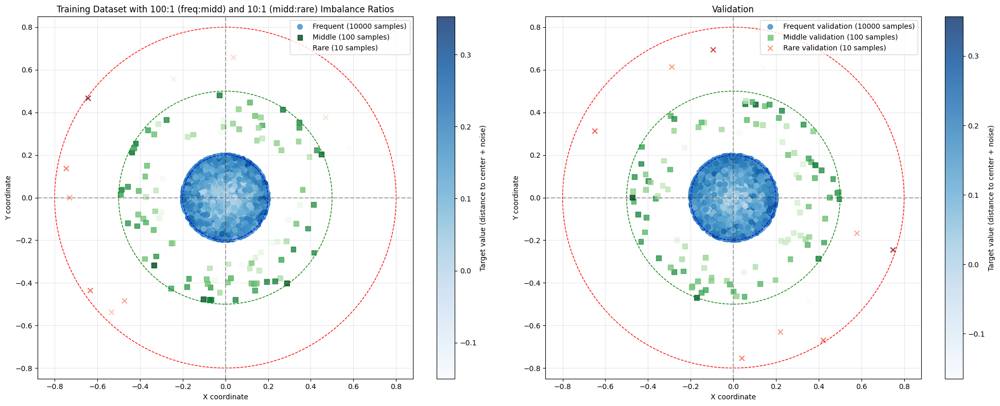

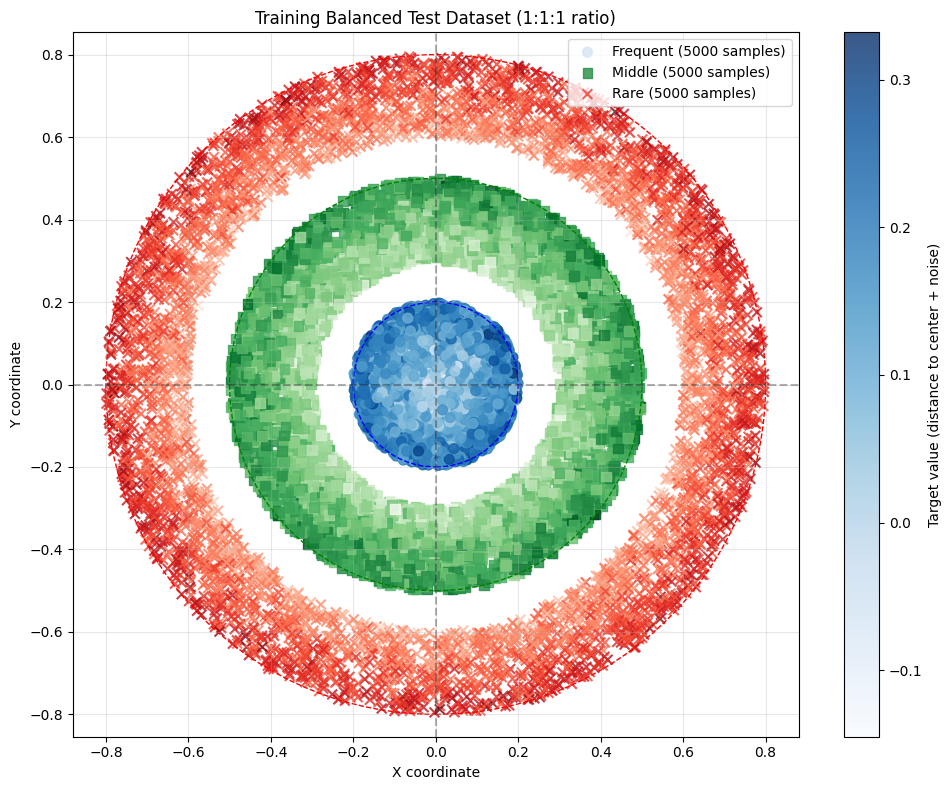

Training model with 10110 training samples and 10110 validation samples
Epoch 1/400 -               train_loss: 0.021683 - val_loss: 0.021705 -               num_params: 9 - param_norm: 1.7105
Epoch 2/400 -               train_loss: 0.027517 - val_loss: 0.027581 -               num_params: 9 - param_norm: 1.7074
Epoch 3/400 -               train_loss: 0.034566 - val_loss: 0.034676 -               num_params: 9 - param_norm: 1.7048
Epoch 4/400 -               train_loss: 0.042865 - val_loss: 0.043019 -               num_params: 9 - param_norm: 1.7026
Epoch 5/400 -               train_loss: 0.052441 - val_loss: 0.052631 -               num_params: 9 - param_norm: 1.7009
Epoch 6/400 -               train_loss: 0.063323 - val_loss: 0.063539 -               num_params: 9 - param_norm: 1.6998
Epoch 7/400 -               train_loss: 0.075549 - val_loss: 0.075789 -               num_params: 9 - param_norm: 1.6991
Epoch 8/400 -               train_loss: 0.089140 - val_loss: 0.089415 -          

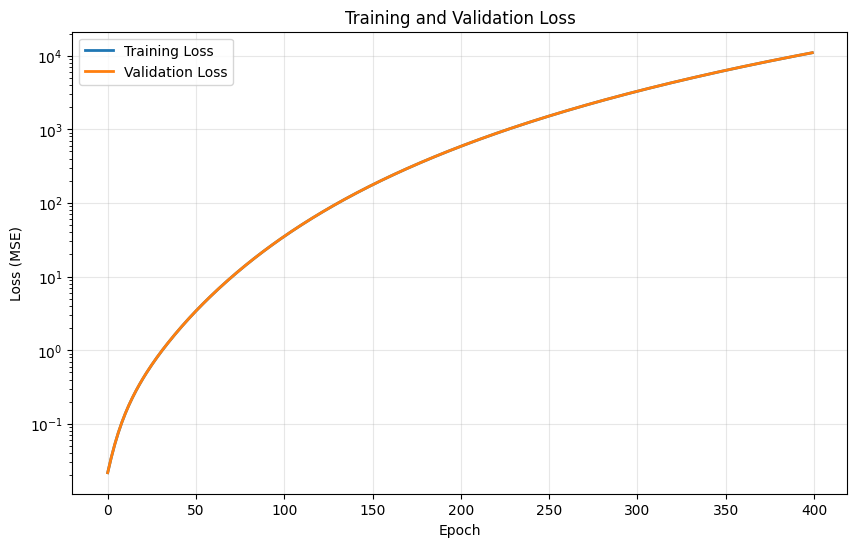

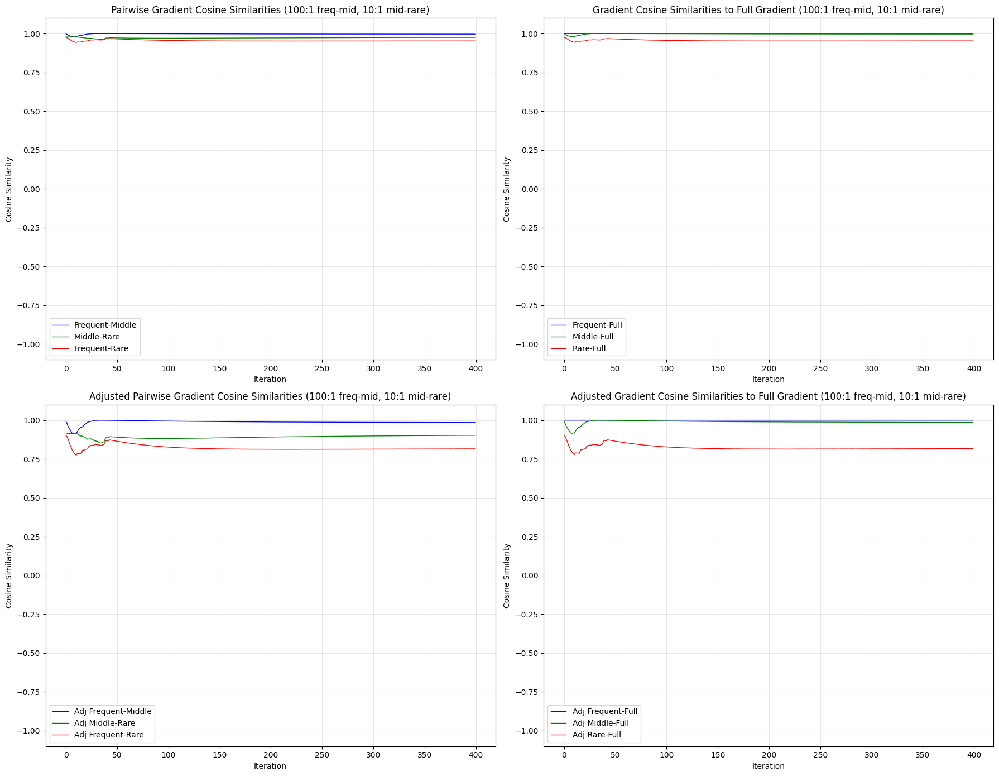

469/469 [==============================] - 1s 2ms/step
=== Performance Evaluation ===

Test Set MAE:
Overall: 104.6095
Frequent bin: 104.0991
Middle bin: 104.2270
Rare bin: 105.5025


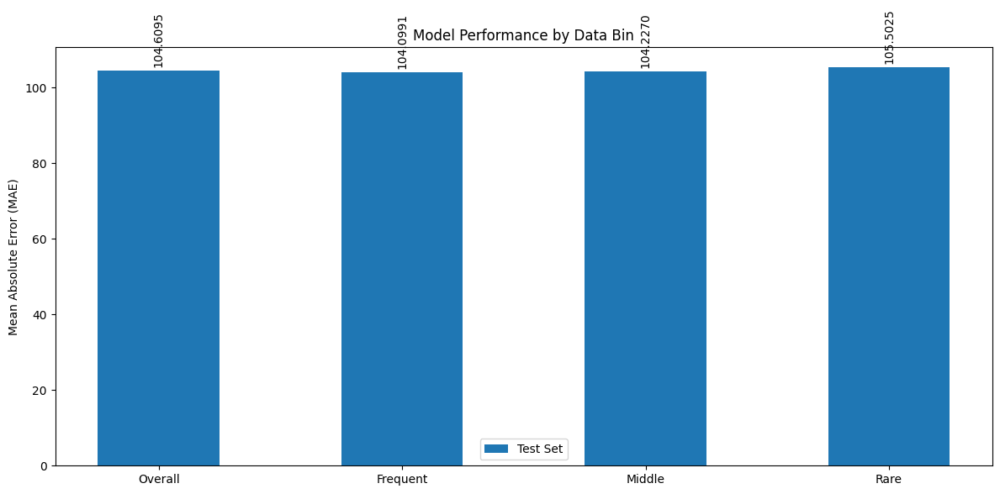

In [31]:
# Run a test with imbalance ratios and plot the results including cosine similarity
# NOTE: 1000:1 IMBALANCED - NO IMPORTANCE WEIGHTING - ADJUSTED GRADIENTS - NO CHECKING FOR CONFLICTS
imb_ratio_freq_midd = 10  # Ratio between frequent and middle samples
imb_ratio_midd_rare = 100   # Ratio between middle and rare samples
# resulting in Ratio between frequent and rare of 1000:1

# Test with specific imbalance ratios
X_train, y_train, sample_weights_train = dataset.get_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)
X_val, y_val, sample_weights_val = dataset.get_val_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)

# Plot dataset
plot_dataset(
    dataset=dataset,
    X=X_train, 
    y=y_train, 
    X_val=X_val, 
    y_val=y_val,
    title=f"Dataset with {imb_ratio_freq_midd}:1 (freq:midd) and {imb_ratio_midd_rare}:1 (midd:rare) Imbalance Ratios",
    draw_circles=True,
    debug=False
)

# Plot balanced test dataset
plot_dataset(
    dataset=test_dataset,
    X=X_test, 
    y=y_test, 
    title="Balanced Test Dataset (1:1:1 ratio)",
    draw_circles=True,
    debug=False
)

# Train model
print(f"Training model with {len(X_train)} training samples and {len(X_val)} validation samples")
model = create_simple_model(weight_decay=weight_decay)

# Use updated beta parameter for gradient adjustment
beta_strategy = 'idea1'  # Try different strategies: 'idea1', 'idea2', 'idea12', 'interpolate'
check_conflicts = False
adjust_gradients = True

# Train with dataset object so gradient cosine similarity can be calculated
history = train_model(
    model=model, 
    dataset=dataset,
    X_train=X_train, 
    y_train=y_train, 
    X_val=X_val, 
    y_val=y_val, 
    sample_weights_train=None,
    sample_weights_val=None,
    epochs=epochs, 
    batch_size=11010,
    lr=lr,
    adjust_gradients=adjust_gradients,
    grad_adjust_beta=beta_strategy,  # Using the beta strategy
    check_conflicts=check_conflicts,
    debug=False
)  

# Plot training results
plot_training_curves(history)

# Plot all gradient cosine similarities in one figure
plot_all_grad_cos_sims(
    history=history, 
    imb_ratio_freq_midd=imb_ratio_freq_midd,
    imb_ratio_midd_rare=imb_ratio_midd_rare,
    trend=False,
    y_limit=1.1
)

# Evaluate on balanced test set
test_results = report_performance(
    model, 
    test_dataset,  # Balanced test dataset
    X_test, y_test
)

# Save the model performance metrics for later comparison
performance_summary = {
    'beta_strategy': beta_strategy,
    'check_conflicts': check_conflicts,
    'imb_ratio_freq_midd': imb_ratio_freq_midd,
    'imb_ratio_midd_rare': imb_ratio_midd_rare,
    'test_mae': test_results,
}


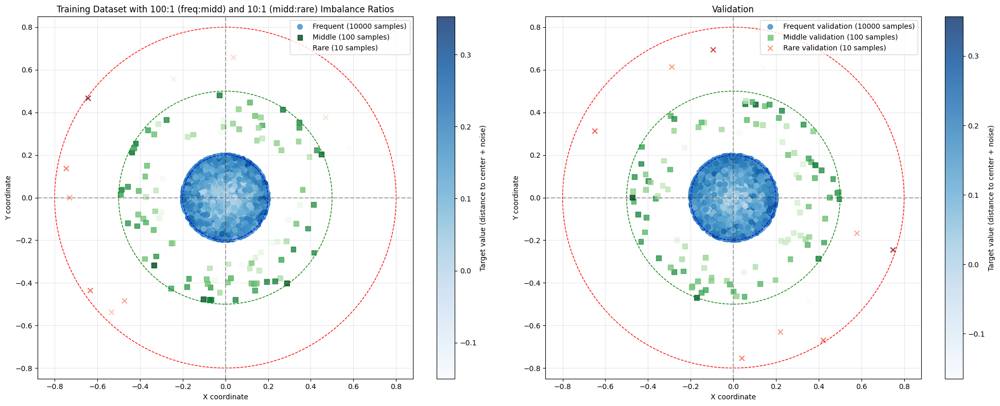

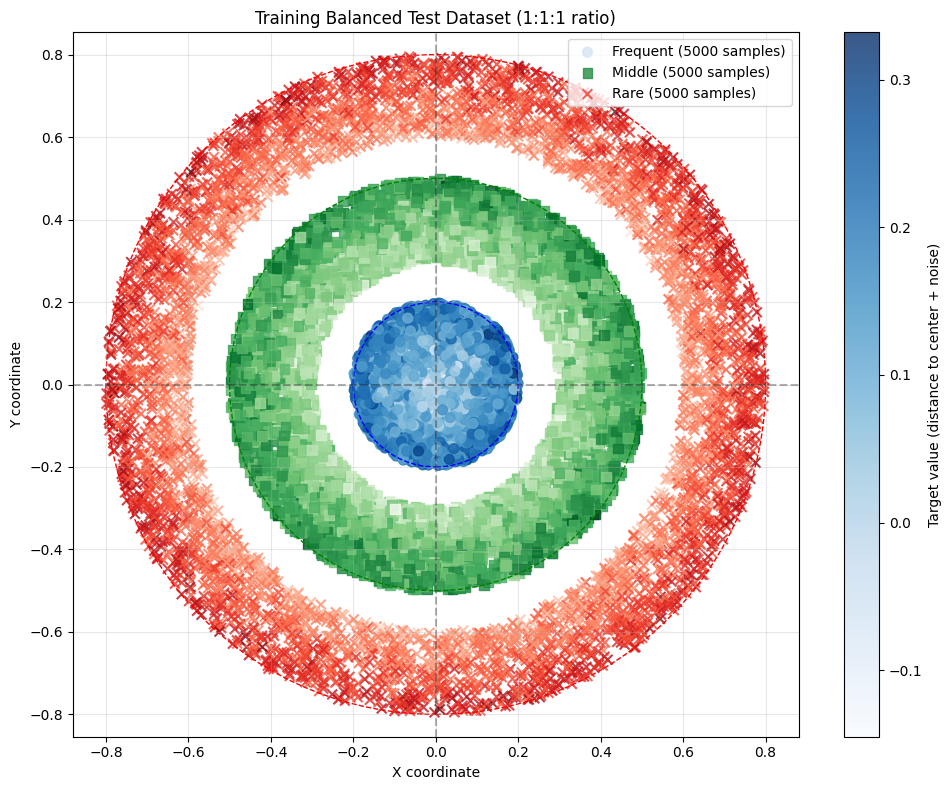

Training model with 10110 training samples and 10110 validation samples
Epoch 1/400 -               train_loss: 0.018500 - val_loss: 0.018251 -               num_params: 9 - param_norm: 1.2028
Epoch 2/400 -               train_loss: 0.017398 - val_loss: 0.017161 -               num_params: 9 - param_norm: 1.2078
Epoch 3/400 -               train_loss: 0.016155 - val_loss: 0.015926 -               num_params: 9 - param_norm: 1.2135
Epoch 4/400 -               train_loss: 0.014818 - val_loss: 0.014593 -               num_params: 9 - param_norm: 1.2196
Epoch 5/400 -               train_loss: 0.013521 - val_loss: 0.013300 -               num_params: 9 - param_norm: 1.2264
Epoch 6/400 -               train_loss: 0.012349 - val_loss: 0.012131 -               num_params: 9 - param_norm: 1.2336
Epoch 7/400 -               train_loss: 0.011343 - val_loss: 0.011127 -               num_params: 9 - param_norm: 1.2414
Epoch 8/400 -               train_loss: 0.010515 - val_loss: 0.010302 -          

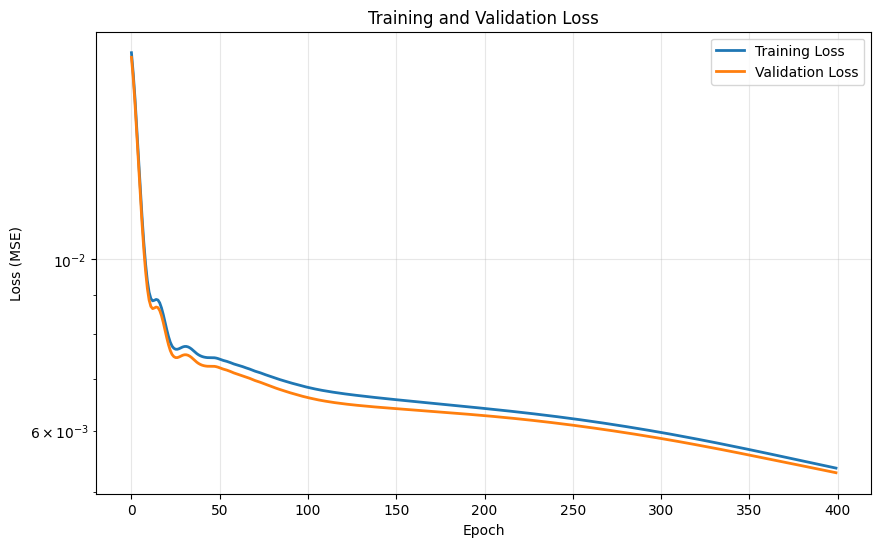

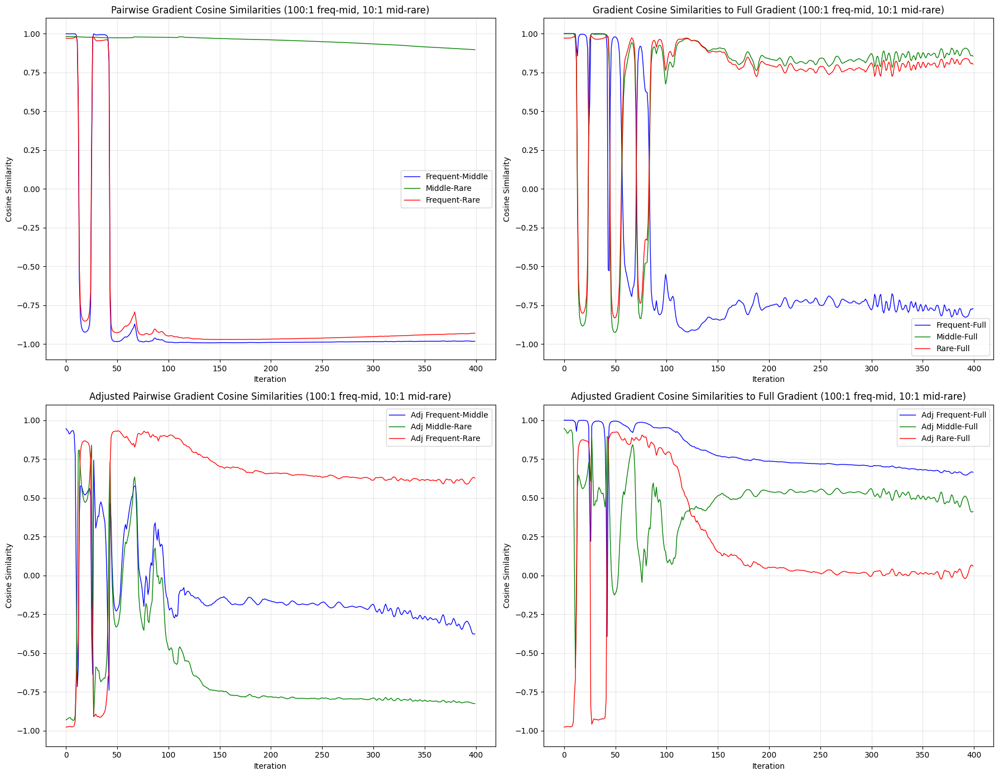

469/469 [==============================] - 0s 927us/step
=== Performance Evaluation ===

Test Set MAE:
Overall: 0.2685
Frequent bin: 0.0538
Middle bin: 0.2160
Rare bin: 0.5357


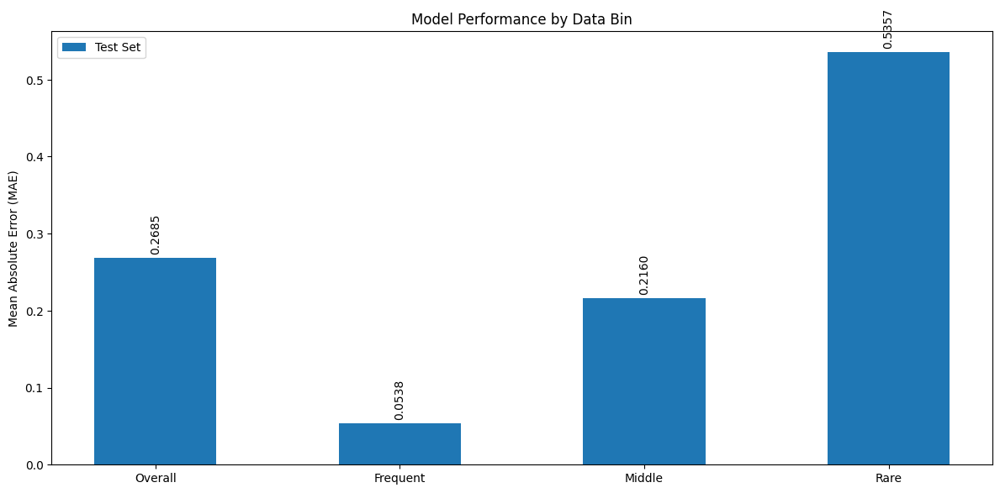

In [32]:
# Run a test with imbalance ratios and plot the results including cosine similarity
# NOTE: 1000:1 IMBALANCED - NO IMPORTANCE WEIGHTING - ADJUSTED GRADIENTS - NO CHECKING FOR CONFLICTS
imb_ratio_freq_midd = 10  # Ratio between frequent and middle samples
imb_ratio_midd_rare = 100   # Ratio between middle and rare samples
# resulting in Ratio between frequent and rare of 1000:1

# Test with specific imbalance ratios
X_train, y_train, sample_weights_train = dataset.get_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)
X_val, y_val, sample_weights_val = dataset.get_val_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)

# Plot dataset
plot_dataset(
    dataset=dataset,
    X=X_train, 
    y=y_train, 
    X_val=X_val, 
    y_val=y_val,
    title=f"Dataset with {imb_ratio_freq_midd}:1 (freq:midd) and {imb_ratio_midd_rare}:1 (midd:rare) Imbalance Ratios",
    draw_circles=True,
    debug=False
)

# Plot balanced test dataset
plot_dataset(
    dataset=test_dataset,
    X=X_test, 
    y=y_test, 
    title="Balanced Test Dataset (1:1:1 ratio)",
    draw_circles=True,
    debug=False
)

# Train model
print(f"Training model with {len(X_train)} training samples and {len(X_val)} validation samples")
model = create_simple_model(weight_decay=weight_decay)

# Use updated beta parameter for gradient adjustment
beta_strategy = 'idea2'  # Try different strategies: 'idea1', 'idea2', 'idea12', 'interpolate'
check_conflicts = False
adjust_gradients = True

# Train with dataset object so gradient cosine similarity can be calculated
history = train_model(
    model=model, 
    dataset=dataset,
    X_train=X_train, 
    y_train=y_train, 
    X_val=X_val, 
    y_val=y_val, 
    sample_weights_train=None,
    sample_weights_val=None,
    epochs=epochs, 
    batch_size=11010,
    lr=lr,
    adjust_gradients=adjust_gradients,
    grad_adjust_beta=beta_strategy,  # Using the beta strategy
    check_conflicts=check_conflicts,
    debug=False
)  

# Plot training results
plot_training_curves(history)

# Plot all gradient cosine similarities in one figure
plot_all_grad_cos_sims(
    history=history, 
    imb_ratio_freq_midd=imb_ratio_freq_midd,
    imb_ratio_midd_rare=imb_ratio_midd_rare,
    trend=False,
    y_limit=1.1
)

# Evaluate on balanced test set
test_results = report_performance(
    model, 
    test_dataset,  # Balanced test dataset
    X_test, y_test
)

# Save the model performance metrics for later comparison
performance_summary = {
    'beta_strategy': beta_strategy,
    'check_conflicts': check_conflicts,
    'imb_ratio_freq_midd': imb_ratio_freq_midd,
    'imb_ratio_midd_rare': imb_ratio_midd_rare,
    'test_mae': test_results,
}


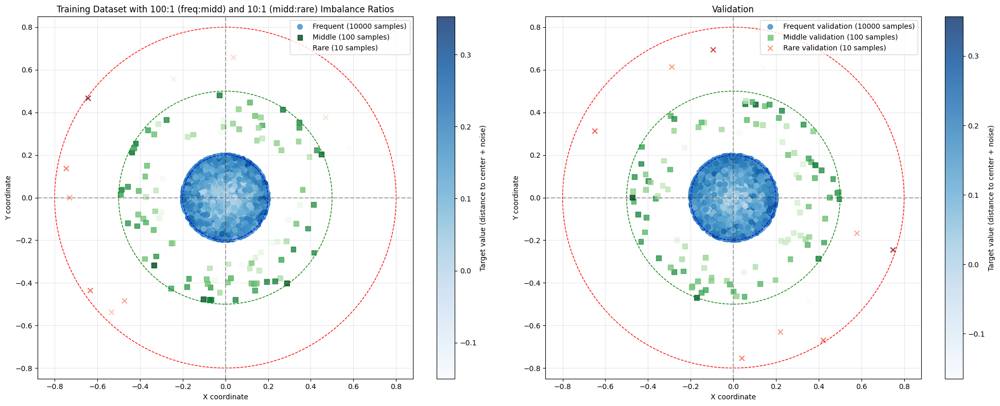

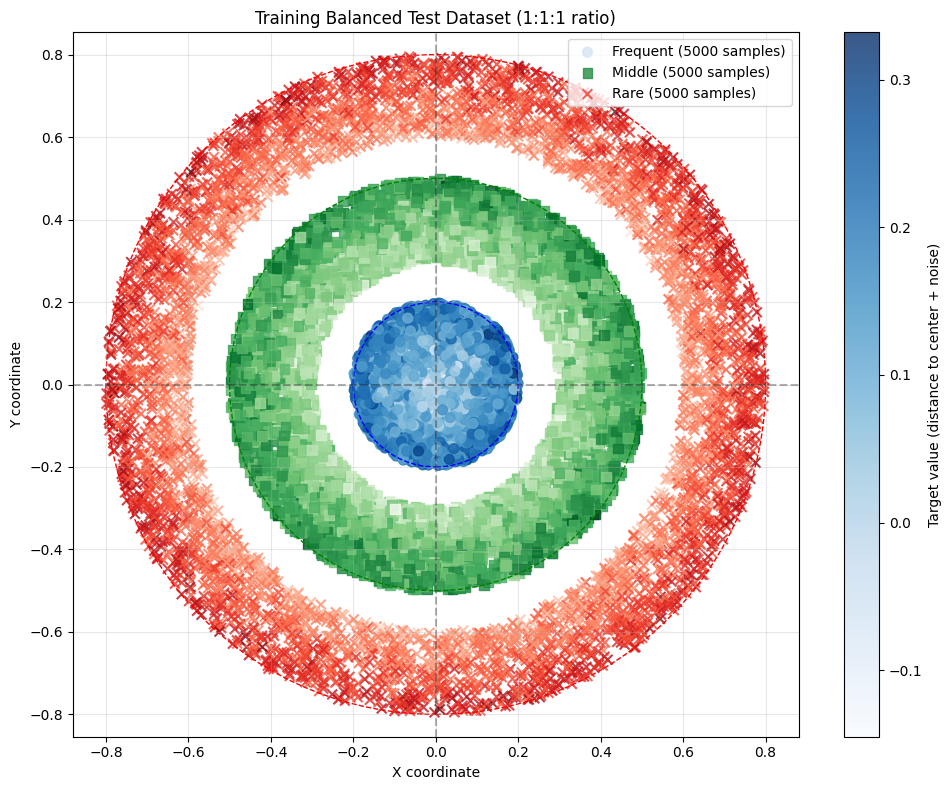

Training model with 10110 training samples and 10110 validation samples
Epoch 1/400 -               train_loss: 0.014767 - val_loss: 0.014194 -               num_params: 9 - param_norm: 1.7229
Epoch 2/400 -               train_loss: 0.013730 - val_loss: 0.013211 -               num_params: 9 - param_norm: 1.7417
Epoch 3/400 -               train_loss: 0.012986 - val_loss: 0.012507 -               num_params: 9 - param_norm: 1.7576
Epoch 4/400 -               train_loss: 0.012379 - val_loss: 0.011933 -               num_params: 9 - param_norm: 1.7688
Epoch 5/400 -               train_loss: 0.011889 - val_loss: 0.011471 -               num_params: 9 - param_norm: 1.7749
Epoch 6/400 -               train_loss: 0.011512 - val_loss: 0.011116 -               num_params: 9 - param_norm: 1.7757
Epoch 7/400 -               train_loss: 0.011232 - val_loss: 0.010854 -               num_params: 9 - param_norm: 1.7714
Epoch 8/400 -               train_loss: 0.011012 - val_loss: 0.010648 -          

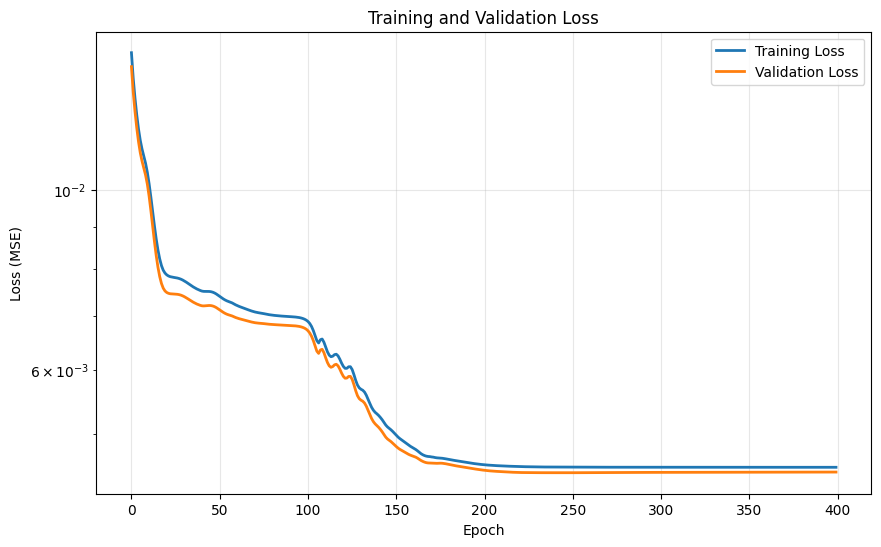

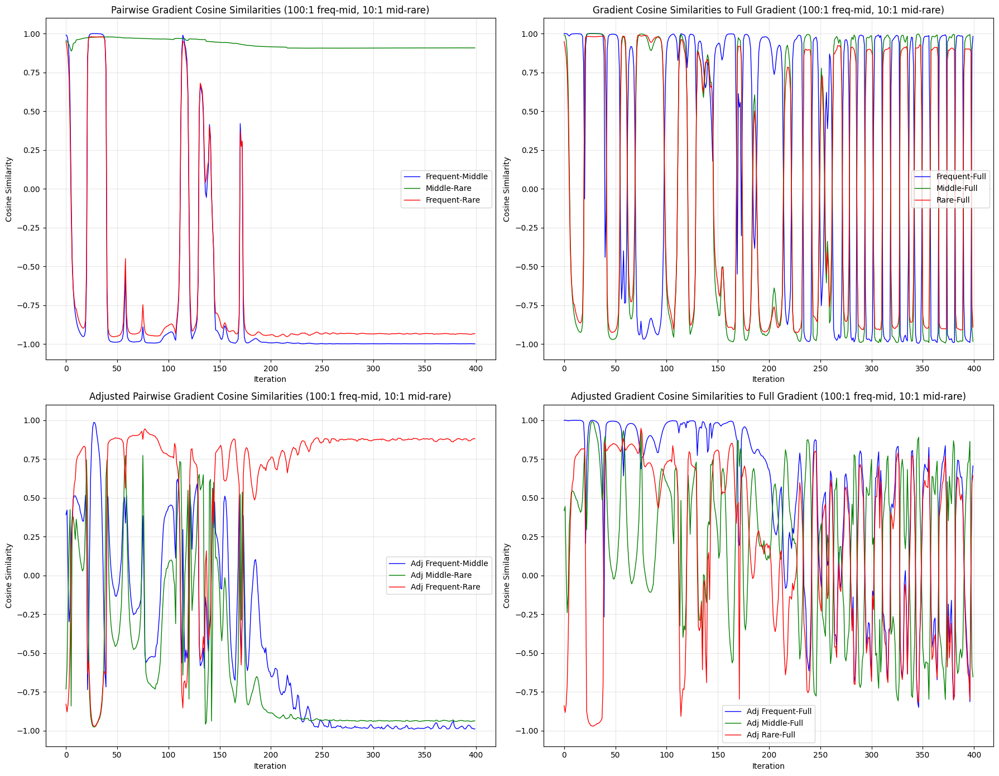

469/469 [==============================] - 0s 969us/step
=== Performance Evaluation ===

Test Set MAE:
Overall: 0.1503
Frequent bin: 0.0516
Middle bin: 0.1391
Rare bin: 0.2603


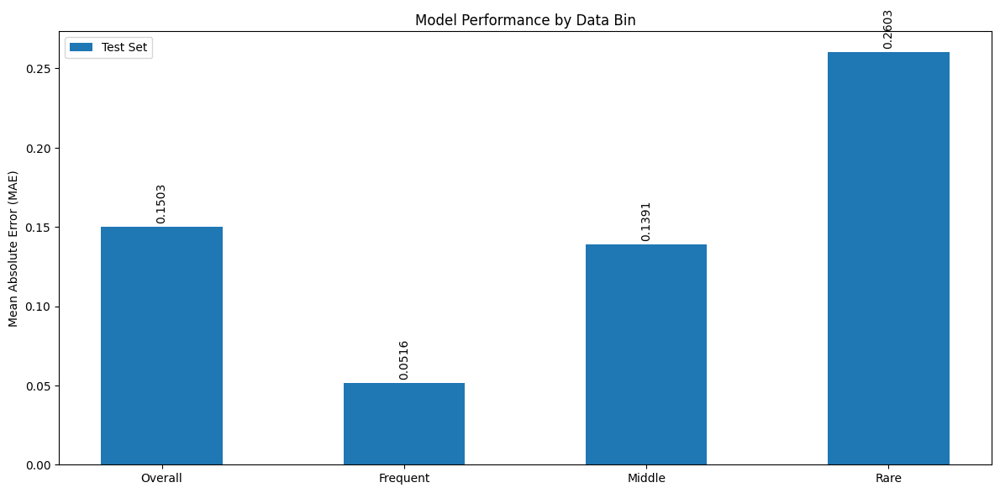

In [33]:
# Run a test with imbalance ratios and plot the results including cosine similarity
# NOTE: 1000:1 IMBALANCED - NO IMPORTANCE WEIGHTING - ADJUSTED GRADIENTS - NO CHECKING FOR CONFLICTS
imb_ratio_freq_midd = 10  # Ratio between frequent and middle samples
imb_ratio_midd_rare = 100   # Ratio between middle and rare samples
# resulting in Ratio between frequent and rare of 1000:1

# Test with specific imbalance ratios
X_train, y_train, sample_weights_train = dataset.get_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)
X_val, y_val, sample_weights_val = dataset.get_val_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)

# Plot dataset
plot_dataset(
    dataset=dataset,
    X=X_train, 
    y=y_train, 
    X_val=X_val, 
    y_val=y_val,
    title=f"Dataset with {imb_ratio_freq_midd}:1 (freq:midd) and {imb_ratio_midd_rare}:1 (midd:rare) Imbalance Ratios",
    draw_circles=True,
    debug=False
)

# Plot balanced test dataset
plot_dataset(
    dataset=test_dataset,
    X=X_test, 
    y=y_test, 
    title="Balanced Test Dataset (1:1:1 ratio)",
    draw_circles=True,
    debug=False
)

# Train model
print(f"Training model with {len(X_train)} training samples and {len(X_val)} validation samples")
model = create_simple_model(weight_decay=weight_decay)

# Use updated beta parameter for gradient adjustment
beta_strategy = 'idea12'  # Try different strategies: 'idea1', 'idea2', 'idea12', 'interpolate'
check_conflicts = False
adjust_gradients = True

# Train with dataset object so gradient cosine similarity can be calculated
history = train_model(
    model=model, 
    dataset=dataset,
    X_train=X_train, 
    y_train=y_train, 
    X_val=X_val, 
    y_val=y_val, 
    sample_weights_train=None,
    sample_weights_val=None,
    epochs=epochs, 
    batch_size=11010,
    lr=lr,
    adjust_gradients=adjust_gradients,
    grad_adjust_beta=beta_strategy,  # Using the beta strategy
    check_conflicts=check_conflicts,
    debug=False
)  

# Plot training results
plot_training_curves(history)

# Plot all gradient cosine similarities in one figure
plot_all_grad_cos_sims(
    history=history, 
    imb_ratio_freq_midd=imb_ratio_freq_midd,
    imb_ratio_midd_rare=imb_ratio_midd_rare,
    trend=False,
    y_limit=1.1
)

# Evaluate on balanced test set
test_results = report_performance(
    model, 
    test_dataset,  # Balanced test dataset
    X_test, y_test
)

# Save the model performance metrics for later comparison
performance_summary = {
    'beta_strategy': beta_strategy,
    'check_conflicts': check_conflicts,
    'imb_ratio_freq_midd': imb_ratio_freq_midd,
    'imb_ratio_midd_rare': imb_ratio_midd_rare,
    'test_mae': test_results,
}


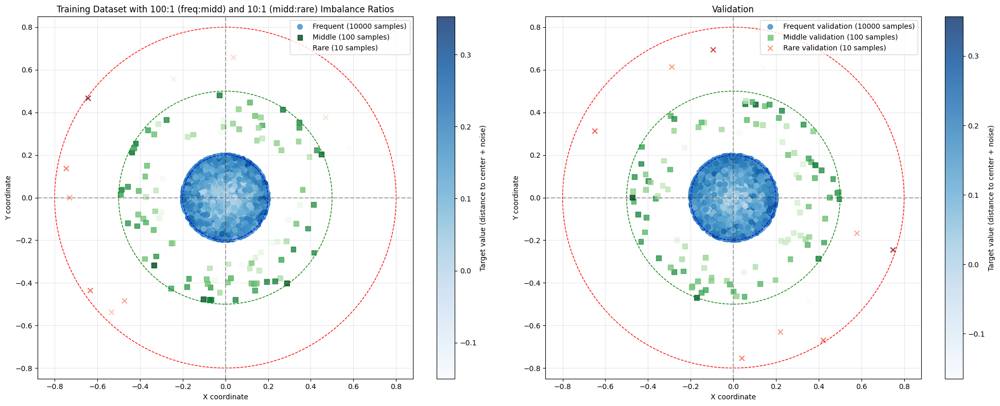

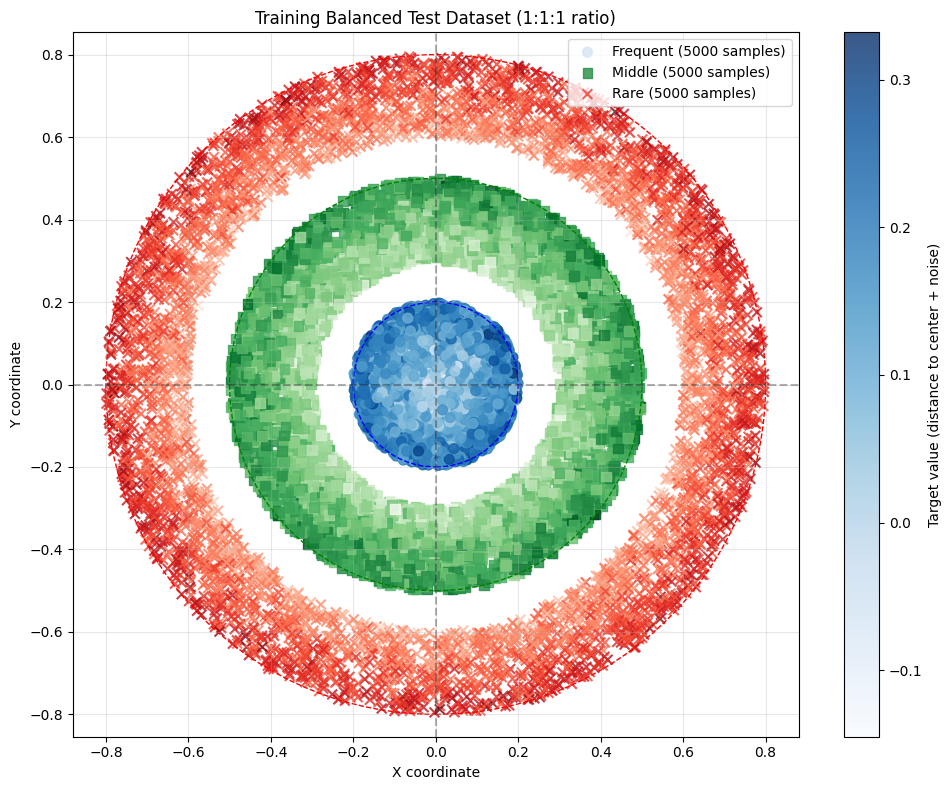

Training model with 10110 training samples and 10110 validation samples
Epoch 1/400 -               train_loss: 0.036767 - val_loss: 0.036410 -               num_params: 9 - param_norm: 1.7588
Epoch 2/400 -               train_loss: 0.036610 - val_loss: 0.036277 -               num_params: 9 - param_norm: 1.7750
Epoch 3/400 -               train_loss: 0.036543 - val_loss: 0.036239 -               num_params: 9 - param_norm: 1.7914
Epoch 4/400 -               train_loss: 0.036552 - val_loss: 0.036280 -               num_params: 9 - param_norm: 1.8080
Epoch 5/400 -               train_loss: 0.036548 - val_loss: 0.036310 -               num_params: 9 - param_norm: 1.8247
Epoch 6/400 -               train_loss: 0.036366 - val_loss: 0.036154 -               num_params: 9 - param_norm: 1.8416
Epoch 7/400 -               train_loss: 0.036036 - val_loss: 0.035842 -               num_params: 9 - param_norm: 1.8559
Epoch 8/400 -               train_loss: 0.035504 - val_loss: 0.035319 -          

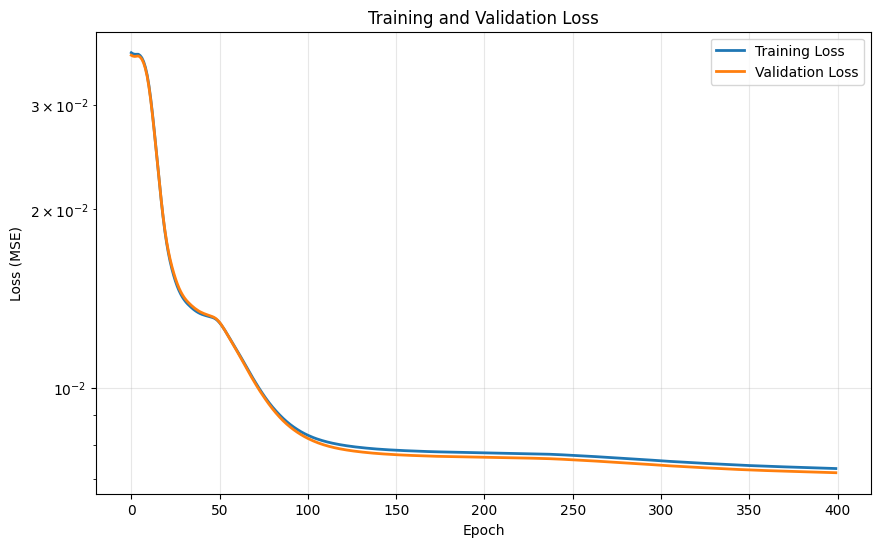

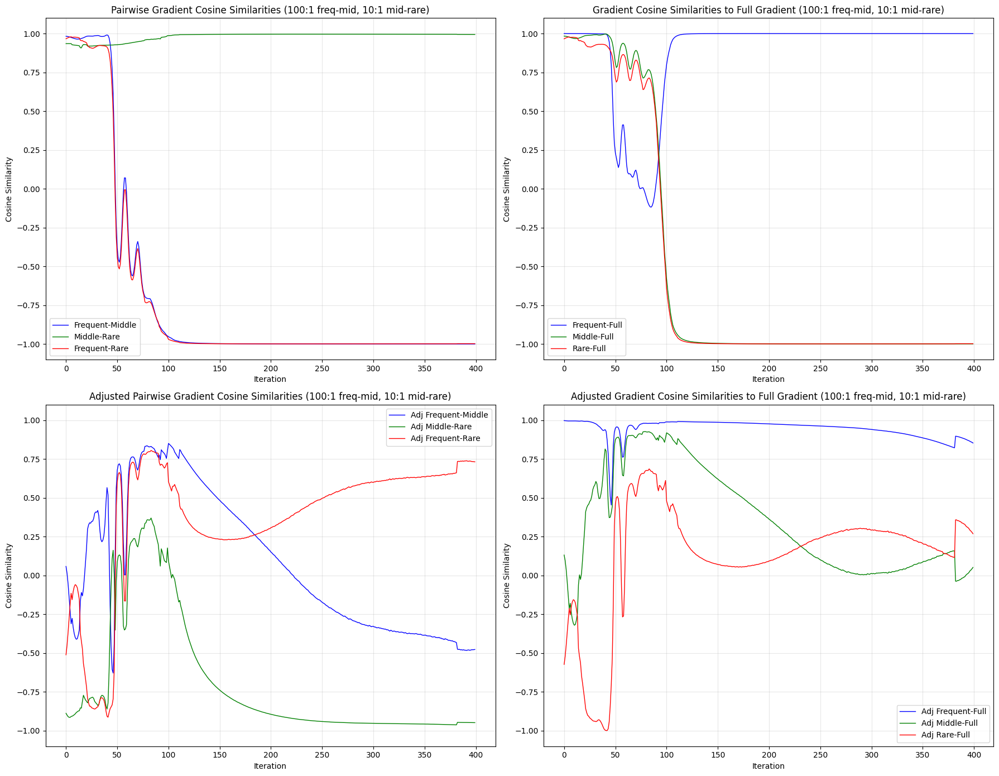

469/469 [==============================] - 0s 904us/step
=== Performance Evaluation ===

Test Set MAE:
Overall: 0.3153
Frequent bin: 0.0631
Middle bin: 0.2905
Rare bin: 0.5923


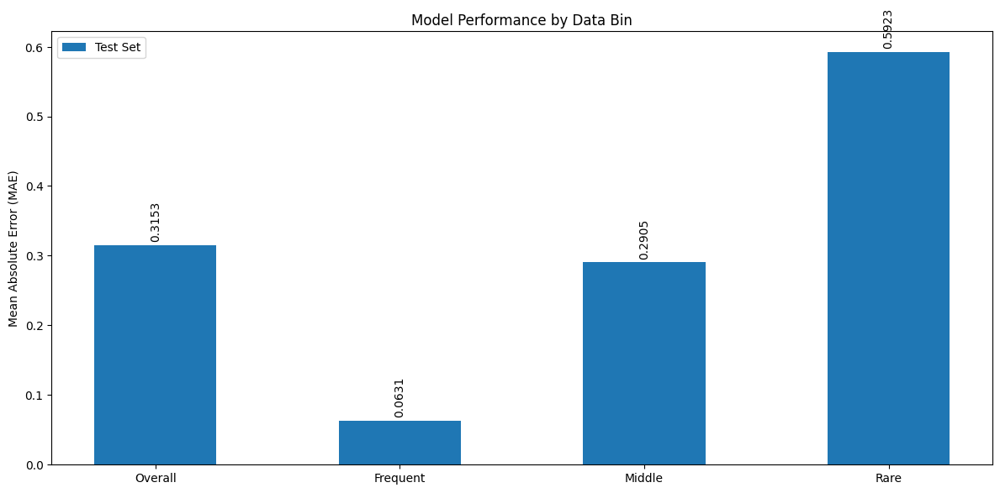

In [34]:
# Run a test with imbalance ratios and plot the results including cosine similarity
# NOTE: 1000:1 IMBALANCED - NO IMPORTANCE WEIGHTING - ADJUSTED GRADIENTS - NO CHECKING FOR CONFLICTS
imb_ratio_freq_midd = 10  # Ratio between frequent and middle samples
imb_ratio_midd_rare = 100   # Ratio between middle and rare samples
# resulting in Ratio between frequent and rare of 1000:1

# Test with specific imbalance ratios
X_train, y_train, sample_weights_train = dataset.get_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)
X_val, y_val, sample_weights_val = dataset.get_val_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)

# Plot dataset
plot_dataset(
    dataset=dataset,
    X=X_train, 
    y=y_train, 
    X_val=X_val, 
    y_val=y_val,
    title=f"Dataset with {imb_ratio_freq_midd}:1 (freq:midd) and {imb_ratio_midd_rare}:1 (midd:rare) Imbalance Ratios",
    draw_circles=True,
    debug=False
)

# Plot balanced test dataset
plot_dataset(
    dataset=test_dataset,
    X=X_test, 
    y=y_test, 
    title="Balanced Test Dataset (1:1:1 ratio)",
    draw_circles=True,
    debug=False
)

# Train model
print(f"Training model with {len(X_train)} training samples and {len(X_val)} validation samples")
model = create_simple_model(weight_decay=weight_decay)

# Use updated beta parameter for gradient adjustment
beta_strategy = 'interpolate'  # Try different strategies: 'idea1', 'idea2', 'idea12', 'interpolate'
check_conflicts = False
adjust_gradients = True

# Train with dataset object so gradient cosine similarity can be calculated
history = train_model(
    model=model, 
    dataset=dataset,
    X_train=X_train, 
    y_train=y_train, 
    X_val=X_val, 
    y_val=y_val, 
    sample_weights_train=None,
    sample_weights_val=None,
    epochs=epochs, 
    batch_size=11010,
    lr=lr,
    adjust_gradients=adjust_gradients,
    grad_adjust_beta=beta_strategy,  # Using the beta strategy
    check_conflicts=check_conflicts,
    debug=False
)  

# Plot training results
plot_training_curves(history)

# Plot all gradient cosine similarities in one figure
plot_all_grad_cos_sims(
    history=history, 
    imb_ratio_freq_midd=imb_ratio_freq_midd,
    imb_ratio_midd_rare=imb_ratio_midd_rare,
    trend=False,
    y_limit=1.1
)

# Evaluate on balanced test set
test_results = report_performance(
    model, 
    test_dataset,  # Balanced test dataset
    X_test, y_test
)

# Save the model performance metrics for later comparison
performance_summary = {
    'beta_strategy': beta_strategy,
    'check_conflicts': check_conflicts,
    'imb_ratio_freq_midd': imb_ratio_freq_midd,
    'imb_ratio_midd_rare': imb_ratio_midd_rare,
    'test_mae': test_results,
}


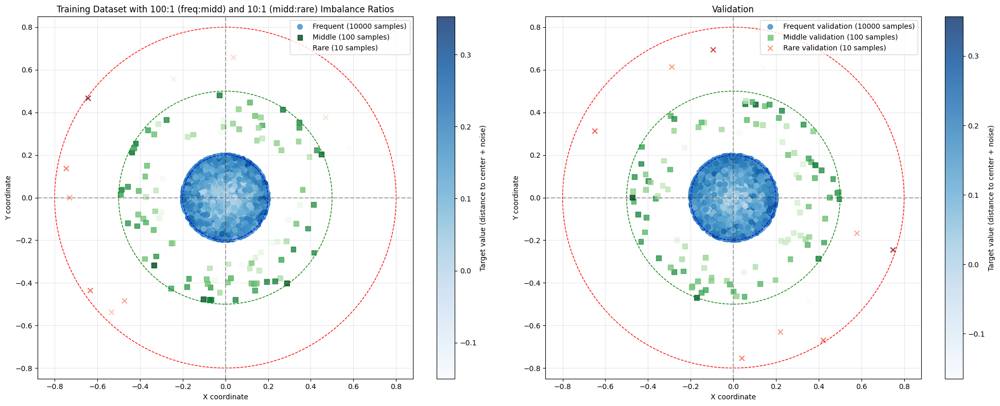

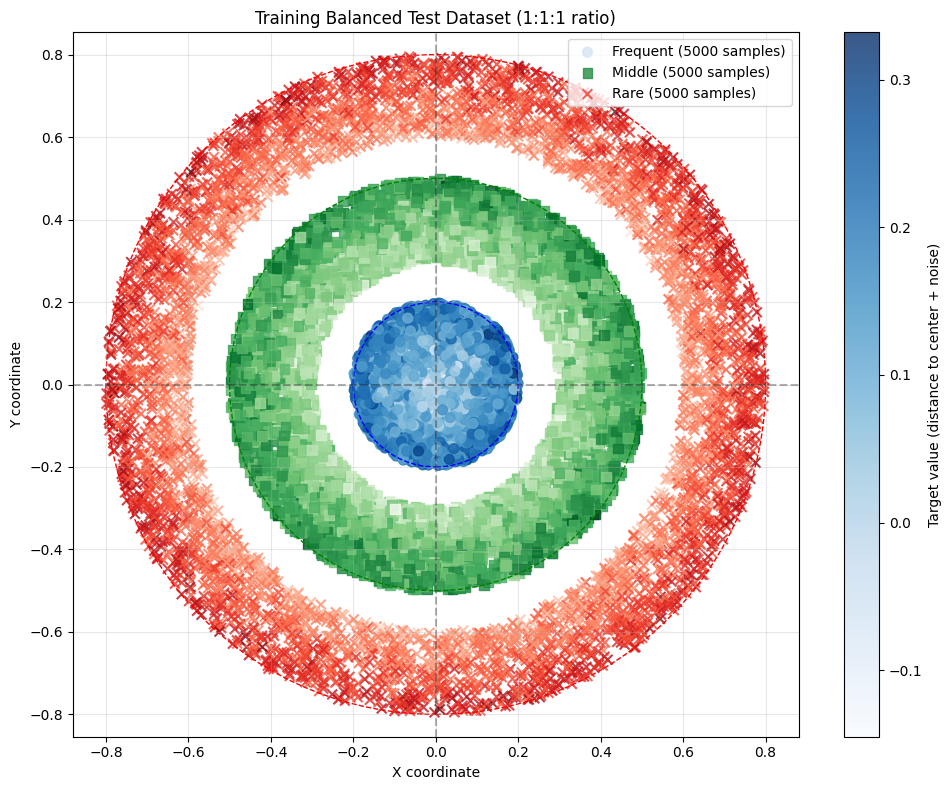

Training model with 10110 training samples and 10110 validation samples
Epoch 1/400 -               train_loss: 0.012974 - val_loss: 0.012811 -               num_params: 9 - param_norm: 1.9223
Epoch 2/400 -               train_loss: 0.011313 - val_loss: 0.011148 -               num_params: 9 - param_norm: 1.9151
Epoch 3/400 -               train_loss: 0.010378 - val_loss: 0.010214 -               num_params: 9 - param_norm: 1.9083
Epoch 4/400 -               train_loss: 0.009992 - val_loss: 0.009833 -               num_params: 9 - param_norm: 1.9018
Epoch 5/400 -               train_loss: 0.009901 - val_loss: 0.009747 -               num_params: 9 - param_norm: 1.8957
Epoch 6/400 -               train_loss: 0.009992 - val_loss: 0.009844 -               num_params: 9 - param_norm: 1.8911
Epoch 7/400 -               train_loss: 0.010277 - val_loss: 0.010136 -               num_params: 9 - param_norm: 1.8882
Epoch 8/400 -               train_loss: 0.010799 - val_loss: 0.010666 -          

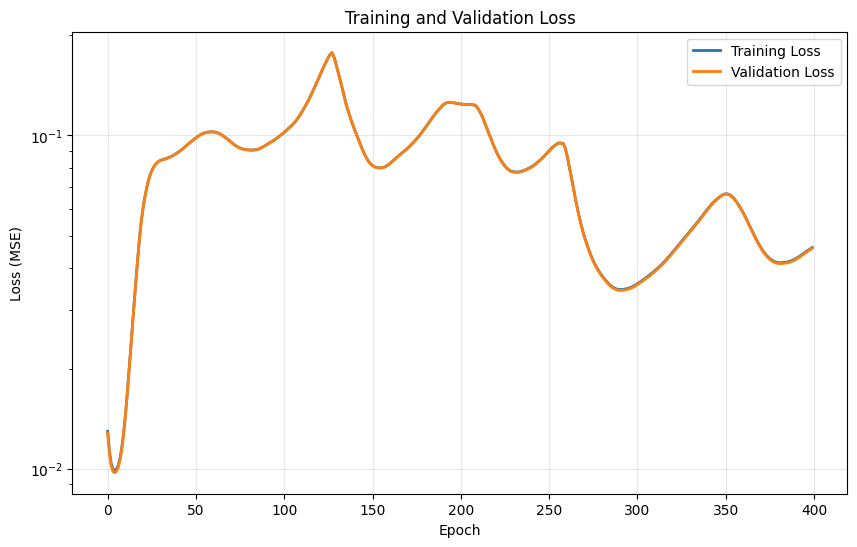

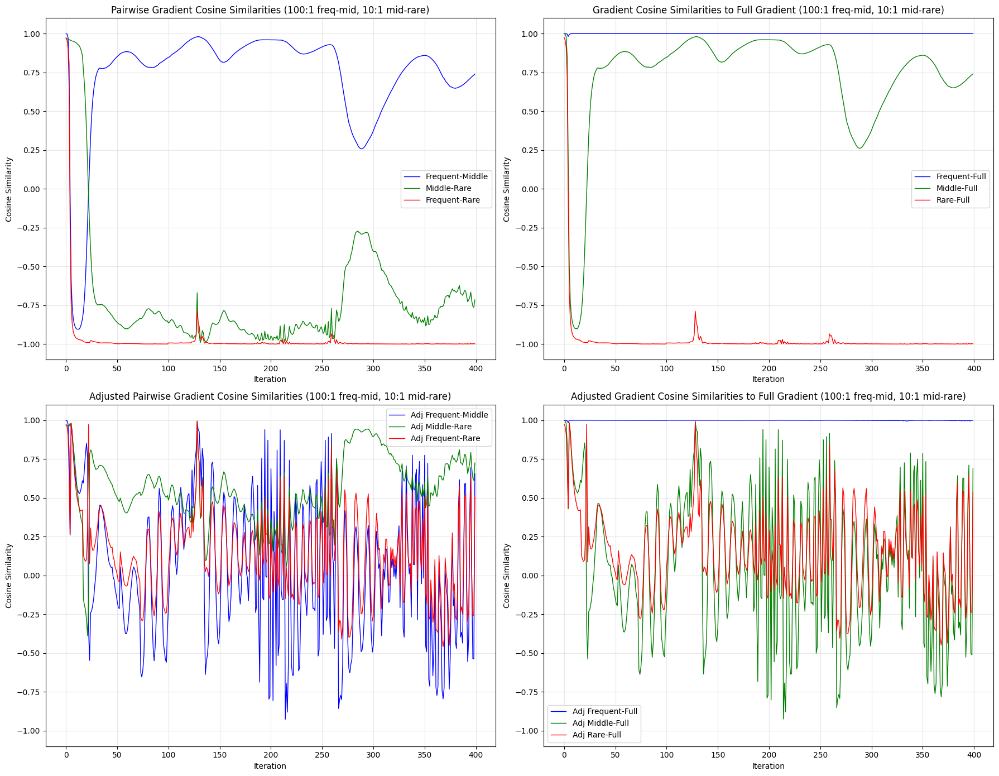

469/469 [==============================] - 1s 1ms/step
=== Performance Evaluation ===

Test Set MAE:
Overall: 0.1843
Frequent bin: 0.2043
Middle bin: 0.1442
Rare bin: 0.2045


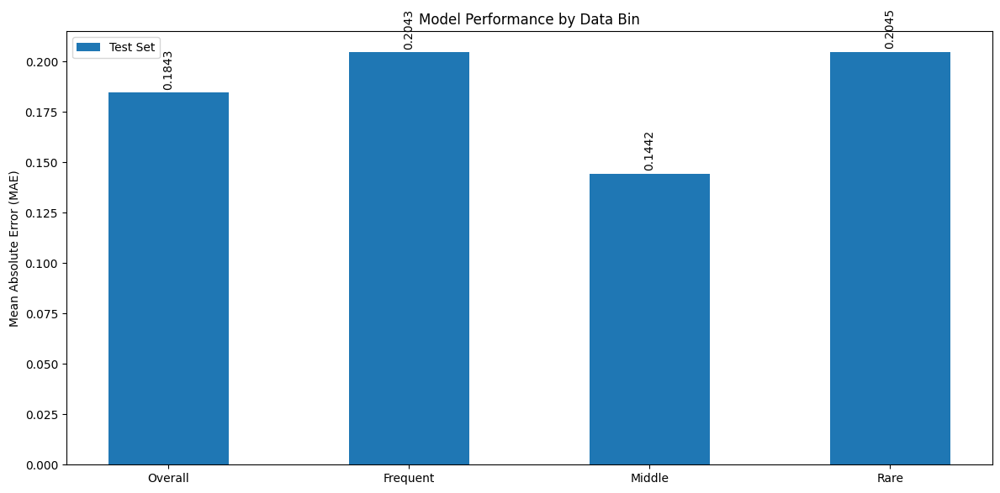

In [35]:
# Run a test with imbalance ratios and plot the results including cosine similarity
# NOTE: 1000:1 IMBALANCED - NO IMPORTANCE WEIGHTING - ADJUSTED GRADIENTS - NO CHECKING FOR CONFLICTS
imb_ratio_freq_midd = 10 # Ratio between frequent and middle samples
imb_ratio_midd_rare = 100   # Ratio between middle and rare samples
# resulting in Ratio between frequent and rare of 1000:1

# Test with specific imbalance ratios
X_train, y_train, sample_weights_train = dataset.get_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)
X_val, y_val, sample_weights_val = dataset.get_val_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)

# Plot dataset
plot_dataset(
    dataset=dataset,
    X=X_train, 
    y=y_train, 
    X_val=X_val, 
    y_val=y_val,
    title=f"Dataset with {imb_ratio_freq_midd}:1 (freq:midd) and {imb_ratio_midd_rare}:1 (midd:rare) Imbalance Ratios",
    draw_circles=True,
    debug=False
)

# Plot balanced test dataset
plot_dataset(
    dataset=test_dataset,
    X=X_test, 
    y=y_test, 
    title="Balanced Test Dataset (1:1:1 ratio)",
    draw_circles=True,
    debug=False
)

# Train model
print(f"Training model with {len(X_train)} training samples and {len(X_val)} validation samples")
model = create_simple_model(weight_decay=weight_decay)

# Use updated beta parameter for gradient adjustment
beta_strategy = 'idea1'  # Try different strategies: 'idea1', 'idea2', 'idea12', 'interpolate'
check_conflicts = True
adjust_gradients = True

# Train with dataset object so gradient cosine similarity can be calculated
history = train_model(
    model=model, 
    dataset=dataset,
    X_train=X_train, 
    y_train=y_train, 
    X_val=X_val, 
    y_val=y_val, 
    sample_weights_train=None,
    sample_weights_val=None,
    epochs=epochs, 
    batch_size=11010,
    lr=lr,
    adjust_gradients=adjust_gradients,
    grad_adjust_beta=beta_strategy,  # Using the beta strategy
    check_conflicts=check_conflicts,
    debug=False
)  

# Plot training results
plot_training_curves(history)

# Plot all gradient cosine similarities in one figure
plot_all_grad_cos_sims(
    history=history, 
    imb_ratio_freq_midd=imb_ratio_freq_midd,
    imb_ratio_midd_rare=imb_ratio_midd_rare,
    trend=False,
    y_limit=1.1
)

# Evaluate on balanced test set
test_results = report_performance(
    model, 
    test_dataset,  # Balanced test dataset
    X_test, y_test
)

# Save the model performance metrics for later comparison
performance_summary = {
    'beta_strategy': beta_strategy,
    'check_conflicts': check_conflicts,
    'imb_ratio_freq_midd': imb_ratio_freq_midd,
    'imb_ratio_midd_rare': imb_ratio_midd_rare,
    'test_mae': test_results,
}


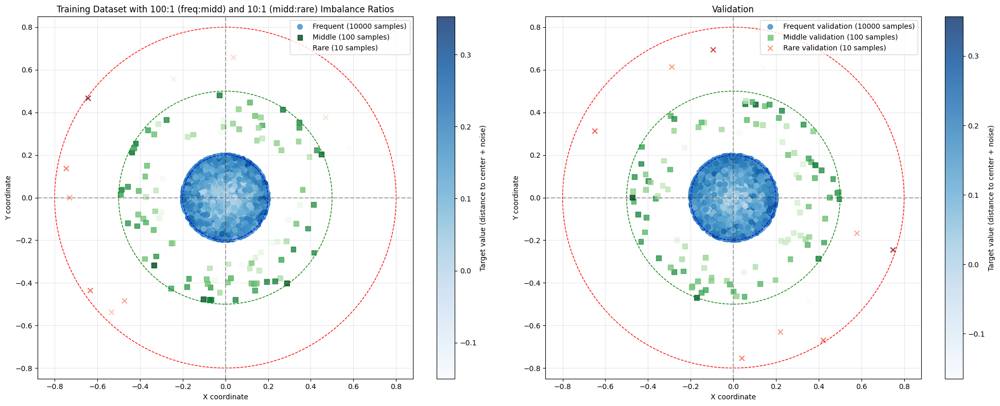

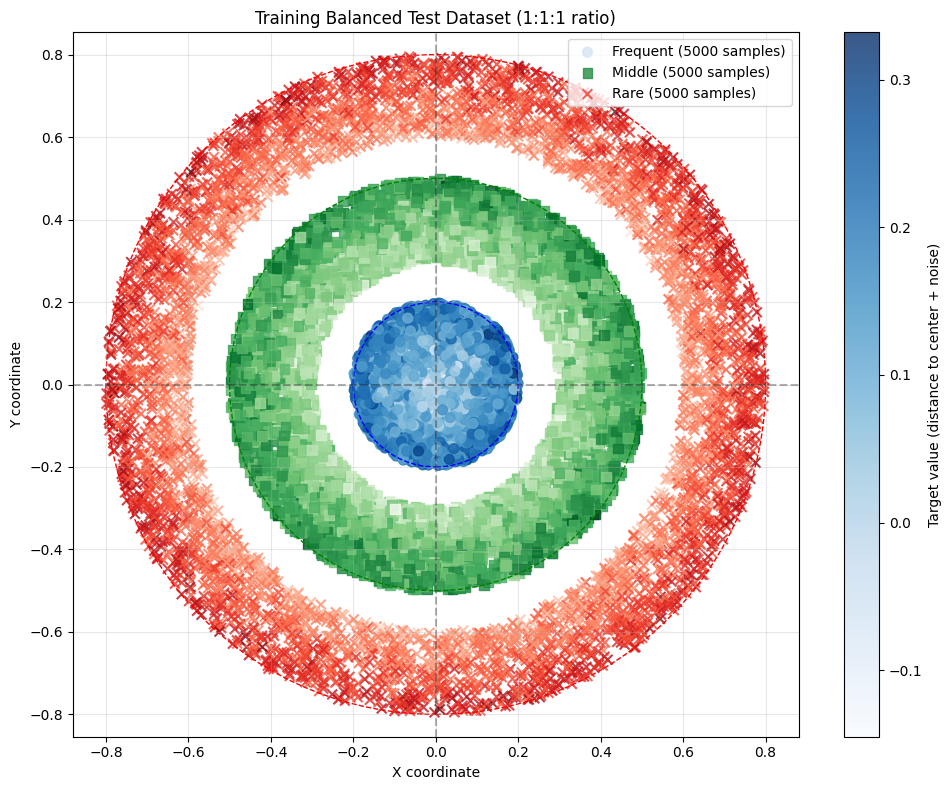

Training model with 10110 training samples and 10110 validation samples
Epoch 1/400 -               train_loss: 0.246514 - val_loss: 0.239217 -               num_params: 9 - param_norm: 1.0512
Epoch 2/400 -               train_loss: 0.227136 - val_loss: 0.222799 -               num_params: 9 - param_norm: 1.0490
Epoch 3/400 -               train_loss: 0.208800 - val_loss: 0.207361 -               num_params: 9 - param_norm: 1.0475
Epoch 4/400 -               train_loss: 0.191581 - val_loss: 0.192880 -               num_params: 9 - param_norm: 1.0467
Epoch 5/400 -               train_loss: 0.175782 - val_loss: 0.179347 -               num_params: 9 - param_norm: 1.0469
Epoch 6/400 -               train_loss: 0.161195 - val_loss: 0.166763 -               num_params: 9 - param_norm: 1.0478
Epoch 7/400 -               train_loss: 0.148008 - val_loss: 0.155673 -               num_params: 9 - param_norm: 1.0486
Epoch 8/400 -               train_loss: 0.136152 - val_loss: 0.145585 -          

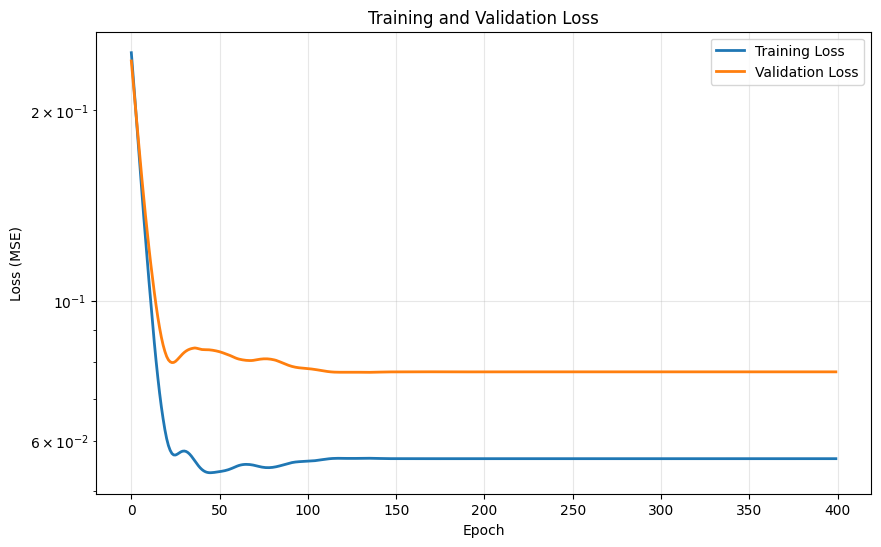

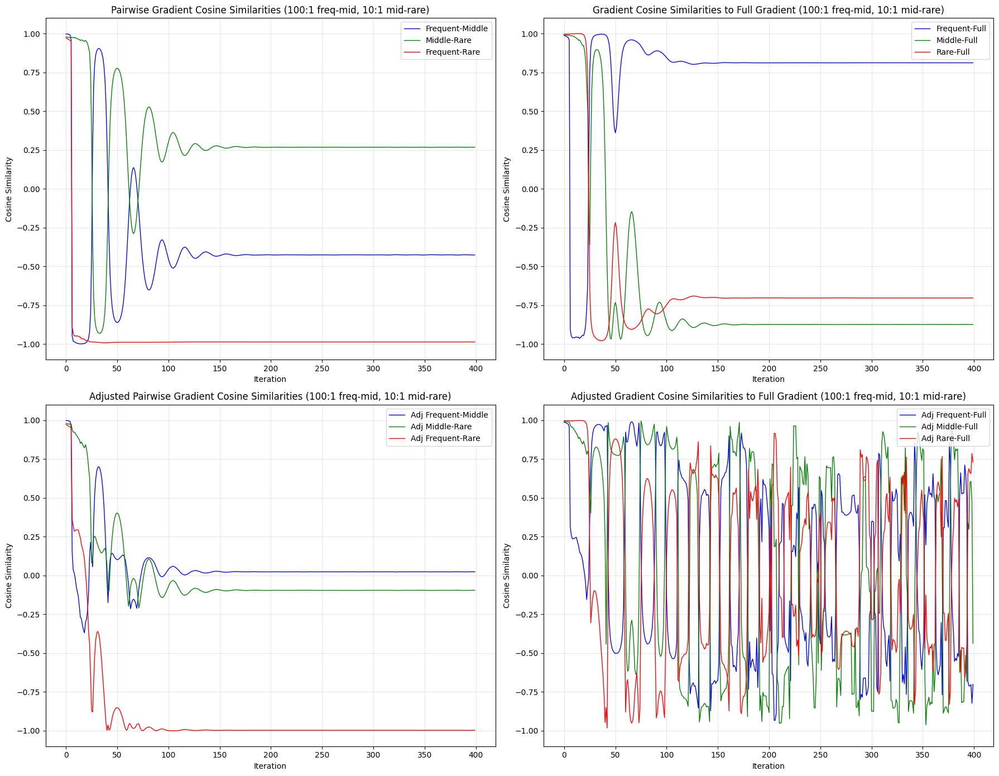

469/469 [==============================] - 6s 12ms/step
=== Performance Evaluation ===

Test Set MAE:
Overall: 0.2263
Frequent bin: 0.3002
Middle bin: 0.0786
Rare bin: 0.3002


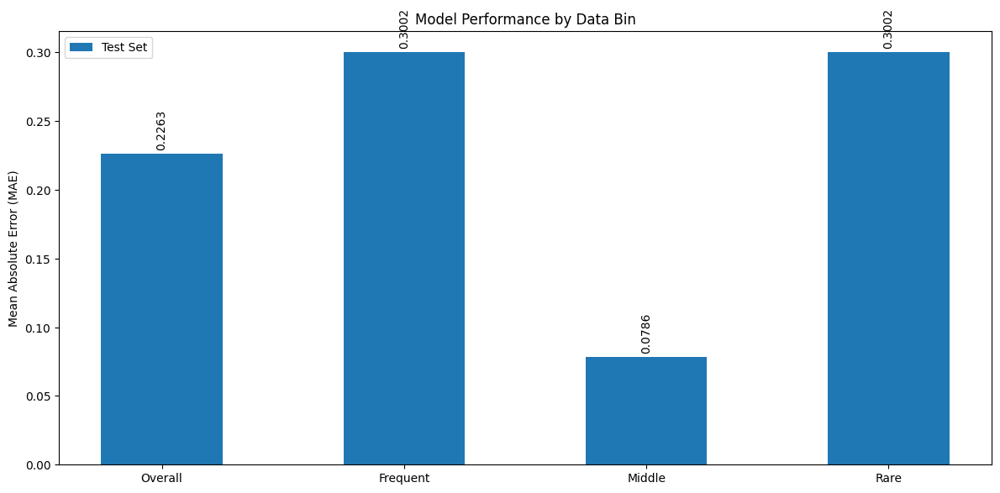

In [42]:
# Run a test with imbalance ratios and plot the results including cosine similarity
# NOTE: 1000:1 IMBALANCED - NO IMPORTANCE WEIGHTING - ADJUSTED GRADIENTS - NO CHECKING FOR CONFLICTS
imb_ratio_freq_midd = 10  # Ratio between frequent and middle samples
imb_ratio_midd_rare = 100   # Ratio between middle and rare samples
# resulting in Ratio between frequent and rare of 1000:1

# Test with specific imbalance ratios
X_train, y_train, sample_weights_train = dataset.get_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)
X_val, y_val, sample_weights_val = dataset.get_val_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)

# Plot dataset
plot_dataset(
    dataset=dataset,
    X=X_train, 
    y=y_train, 
    X_val=X_val, 
    y_val=y_val,
    title=f"Dataset with {imb_ratio_freq_midd}:1 (freq:midd) and {imb_ratio_midd_rare}:1 (midd:rare) Imbalance Ratios",
    draw_circles=True,
    debug=False
)

# Plot balanced test dataset
plot_dataset(
    dataset=test_dataset,
    X=X_test, 
    y=y_test, 
    title="Balanced Test Dataset (1:1:1 ratio)",
    draw_circles=True,
    debug=False
)

# Train model
print(f"Training model with {len(X_train)} training samples and {len(X_val)} validation samples")
model = create_simple_model(weight_decay=weight_decay)

# Use updated beta parameter for gradient adjustment
beta_strategy = 'idea2'  # Try different strategies: 'idea1', 'idea2', 'idea12', 'interpolate'
check_conflicts = True
adjust_gradients = True

# Train with dataset object so gradient cosine similarity can be calculated
history = train_model(
    model=model, 
    dataset=dataset,
    X_train=X_train, 
    y_train=y_train, 
    X_val=X_val, 
    y_val=y_val, 
    sample_weights_train=sample_weights_train,
    sample_weights_val=sample_weights_val,
    epochs=epochs, 
    batch_size=11010,
    lr=lr,
    adjust_gradients=adjust_gradients,
    grad_adjust_beta=beta_strategy,  # Using the beta strategy
    check_conflicts=check_conflicts,
    debug=False
)  

# Plot training results
plot_training_curves(history)

# Plot all gradient cosine similarities in one figure
plot_all_grad_cos_sims(
    history=history, 
    imb_ratio_freq_midd=imb_ratio_freq_midd,
    imb_ratio_midd_rare=imb_ratio_midd_rare,
    trend=False,
    y_limit=1.1
)

# Evaluate on balanced test set
test_results = report_performance(
    model, 
    test_dataset,  # Balanced test dataset
    X_test, y_test
)

# Save the model performance metrics for later comparison
performance_summary = {
    'beta_strategy': beta_strategy,
    'check_conflicts': check_conflicts,
    'imb_ratio_freq_midd': imb_ratio_freq_midd,
    'imb_ratio_midd_rare': imb_ratio_midd_rare,
    'test_mae': test_results,
}


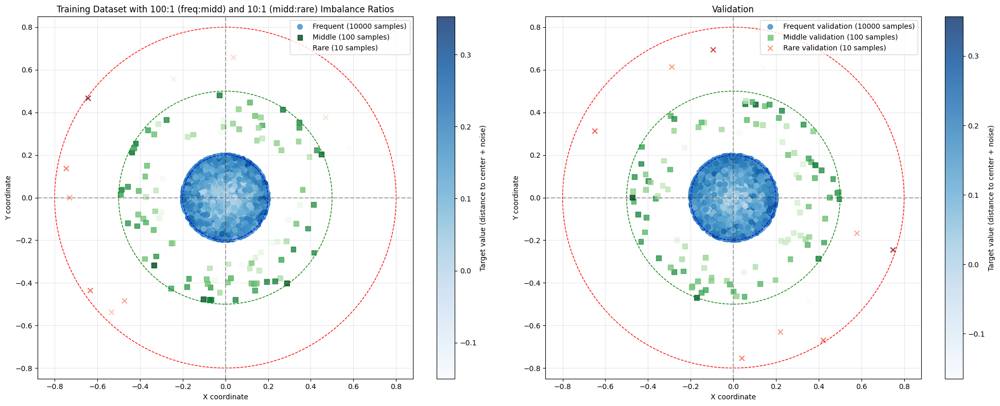

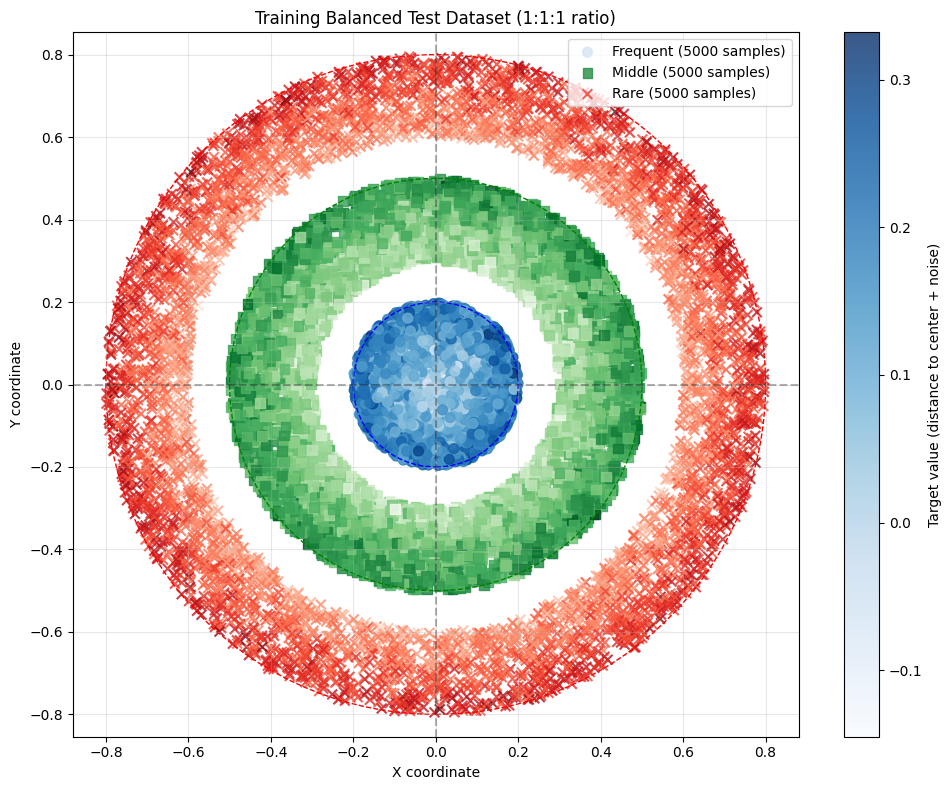

Training model with 10110 training samples and 10110 validation samples
Epoch 1/400 -               train_loss: 0.013937 - val_loss: 0.013662 -               num_params: 9 - param_norm: 1.1615
Epoch 2/400 -               train_loss: 0.011710 - val_loss: 0.011448 -               num_params: 9 - param_norm: 1.1680
Epoch 3/400 -               train_loss: 0.010074 - val_loss: 0.009824 -               num_params: 9 - param_norm: 1.1743
Epoch 4/400 -               train_loss: 0.009015 - val_loss: 0.008775 -               num_params: 9 - param_norm: 1.1789
Epoch 5/400 -               train_loss: 0.008481 - val_loss: 0.008252 -               num_params: 9 - param_norm: 1.1805
Epoch 6/400 -               train_loss: 0.008362 - val_loss: 0.008145 -               num_params: 9 - param_norm: 1.1779
Epoch 7/400 -               train_loss: 0.008505 - val_loss: 0.008301 -               num_params: 9 - param_norm: 1.1719
Epoch 8/400 -               train_loss: 0.008789 - val_loss: 0.008598 -          

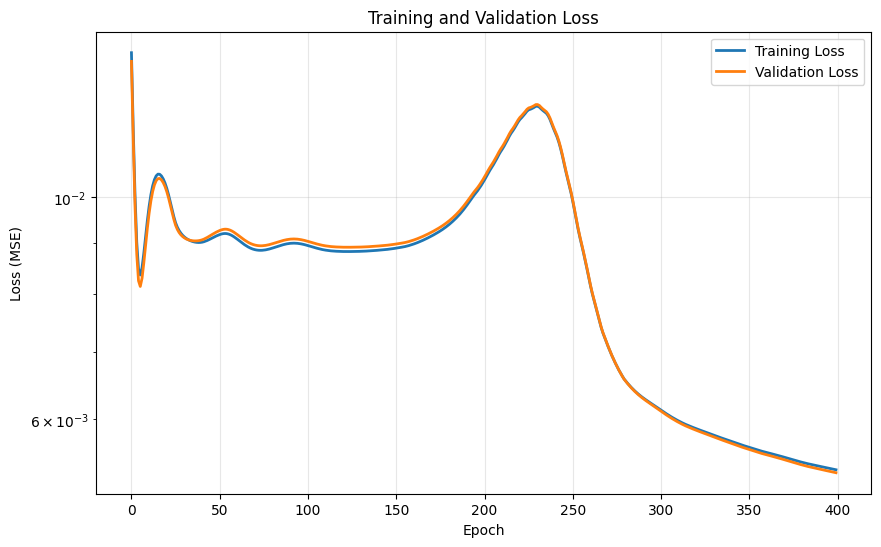

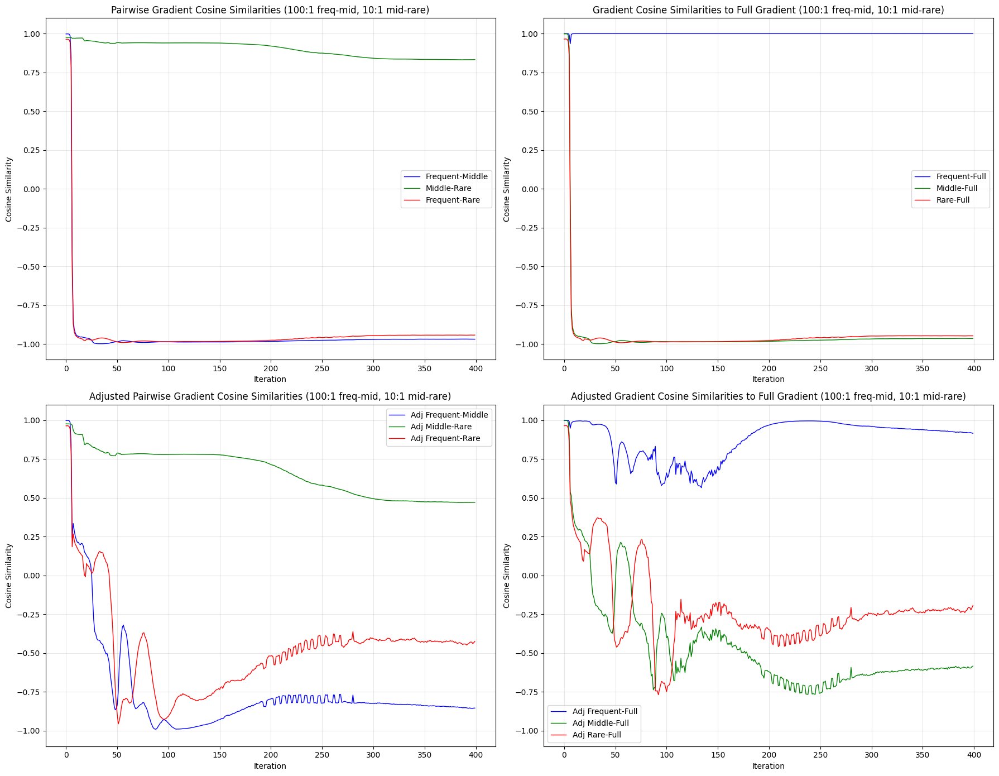

469/469 [==============================] - 1s 1ms/step
=== Performance Evaluation ===

Test Set MAE:
Overall: 0.1805
Frequent bin: 0.0560
Middle bin: 0.1667
Rare bin: 0.3189


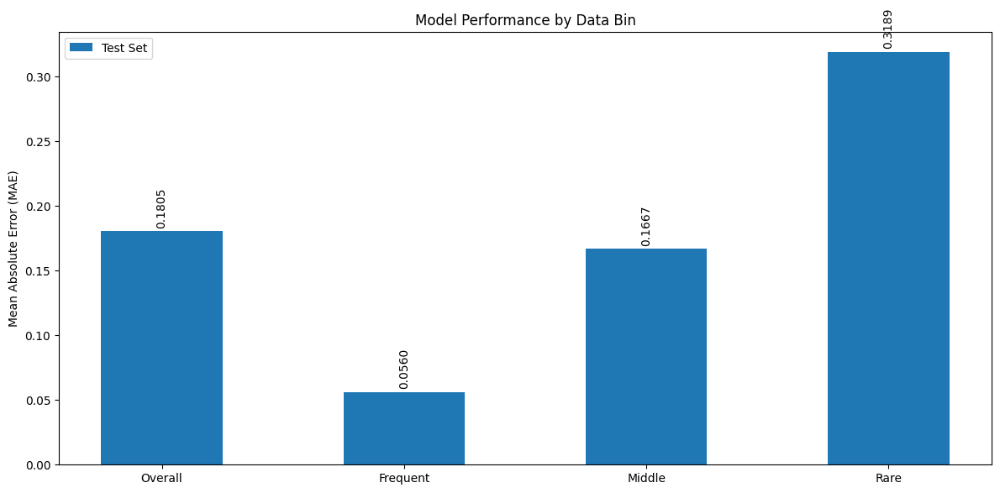

In [37]:
# Run a test with imbalance ratios and plot the results including cosine similarity
# NOTE: 1000:1 IMBALANCED - NO IMPORTANCE WEIGHTING - ADJUSTED GRADIENTS - NO CHECKING FOR CONFLICTS
imb_ratio_freq_midd = 10  # Ratio between frequent and middle samples
imb_ratio_midd_rare = 100   # Ratio between middle and rare samples
# resulting in Ratio between frequent and rare of 1000:1

# Test with specific imbalance ratios
X_train, y_train, sample_weights_train = dataset.get_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)
X_val, y_val, sample_weights_val = dataset.get_val_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)

# Plot dataset
plot_dataset(
    dataset=dataset,
    X=X_train, 
    y=y_train, 
    X_val=X_val, 
    y_val=y_val,
    title=f"Dataset with {imb_ratio_freq_midd}:1 (freq:midd) and {imb_ratio_midd_rare}:1 (midd:rare) Imbalance Ratios",
    draw_circles=True,
    debug=False
)

# Plot balanced test dataset
plot_dataset(
    dataset=test_dataset,
    X=X_test, 
    y=y_test, 
    title="Balanced Test Dataset (1:1:1 ratio)",
    draw_circles=True,
    debug=False
)

# Train model
print(f"Training model with {len(X_train)} training samples and {len(X_val)} validation samples")
model = create_simple_model(weight_decay=weight_decay)

# Use updated beta parameter for gradient adjustment
beta_strategy = 'idea12'  # Try different strategies: 'idea1', 'idea2', 'idea12', 'interpolate'
check_conflicts = True
adjust_gradients = True

# Train with dataset object so gradient cosine similarity can be calculated
history = train_model(
    model=model, 
    dataset=dataset,
    X_train=X_train, 
    y_train=y_train, 
    X_val=X_val, 
    y_val=y_val, 
    sample_weights_train=None,
    sample_weights_val=None,
    epochs=epochs, 
    batch_size=11010,
    lr=lr,
    adjust_gradients=adjust_gradients,
    grad_adjust_beta=beta_strategy,  # Using the beta strategy
    check_conflicts=check_conflicts,
    debug=False
)  

# Plot training results
plot_training_curves(history)

# Plot all gradient cosine similarities in one figure
plot_all_grad_cos_sims(
    history=history, 
    imb_ratio_freq_midd=imb_ratio_freq_midd,
    imb_ratio_midd_rare=imb_ratio_midd_rare,
    trend=False,
    y_limit=1.1
)

# Evaluate on balanced test set
test_results = report_performance(
    model, 
    test_dataset,  # Balanced test dataset
    X_test, y_test
)

# Save the model performance metrics for later comparison
performance_summary = {
    'beta_strategy': beta_strategy,
    'check_conflicts': check_conflicts,
    'imb_ratio_freq_midd': imb_ratio_freq_midd,
    'imb_ratio_midd_rare': imb_ratio_midd_rare,
    'test_mae': test_results,
}


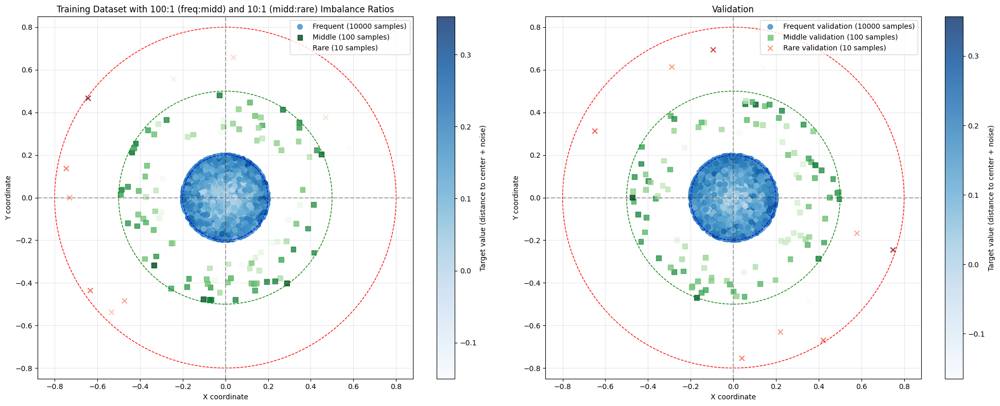

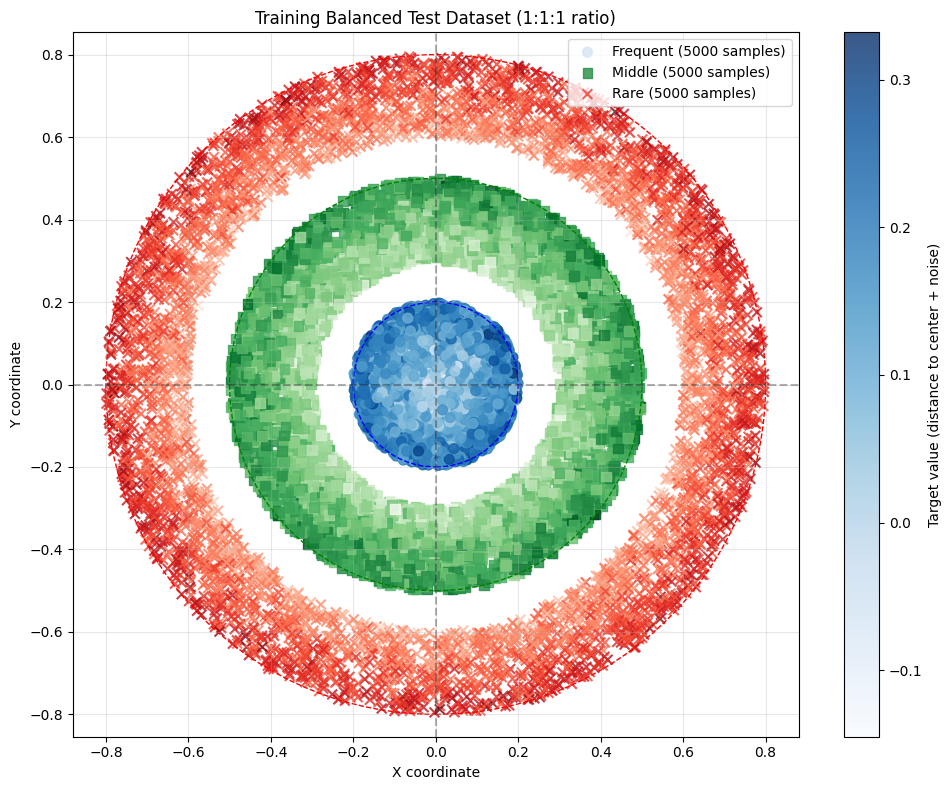

Training model with 10110 training samples and 10110 validation samples
Epoch 1/400 -               train_loss: 0.018410 - val_loss: 0.017858 -               num_params: 9 - param_norm: 1.7260
Epoch 2/400 -               train_loss: 0.014198 - val_loss: 0.013705 -               num_params: 9 - param_norm: 1.7224
Epoch 3/400 -               train_loss: 0.011160 - val_loss: 0.010724 -               num_params: 9 - param_norm: 1.7195
Epoch 4/400 -               train_loss: 0.009225 - val_loss: 0.008847 -               num_params: 9 - param_norm: 1.7174
Epoch 5/400 -               train_loss: 0.008271 - val_loss: 0.007943 -               num_params: 9 - param_norm: 1.7161
Epoch 6/400 -               train_loss: 0.008100 - val_loss: 0.007812 -               num_params: 9 - param_norm: 1.7151
Epoch 7/400 -               train_loss: 0.008464 - val_loss: 0.008211 -               num_params: 9 - param_norm: 1.7142
Epoch 8/400 -               train_loss: 0.009172 - val_loss: 0.008952 -          

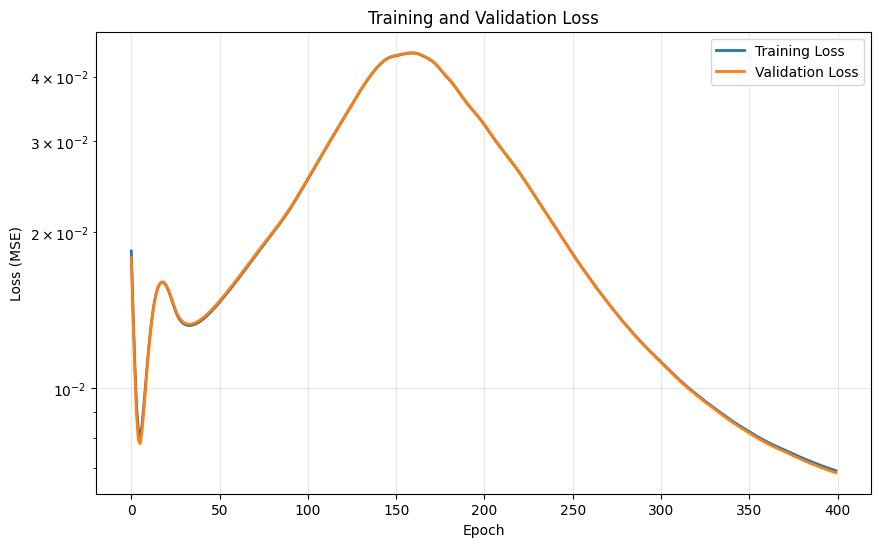

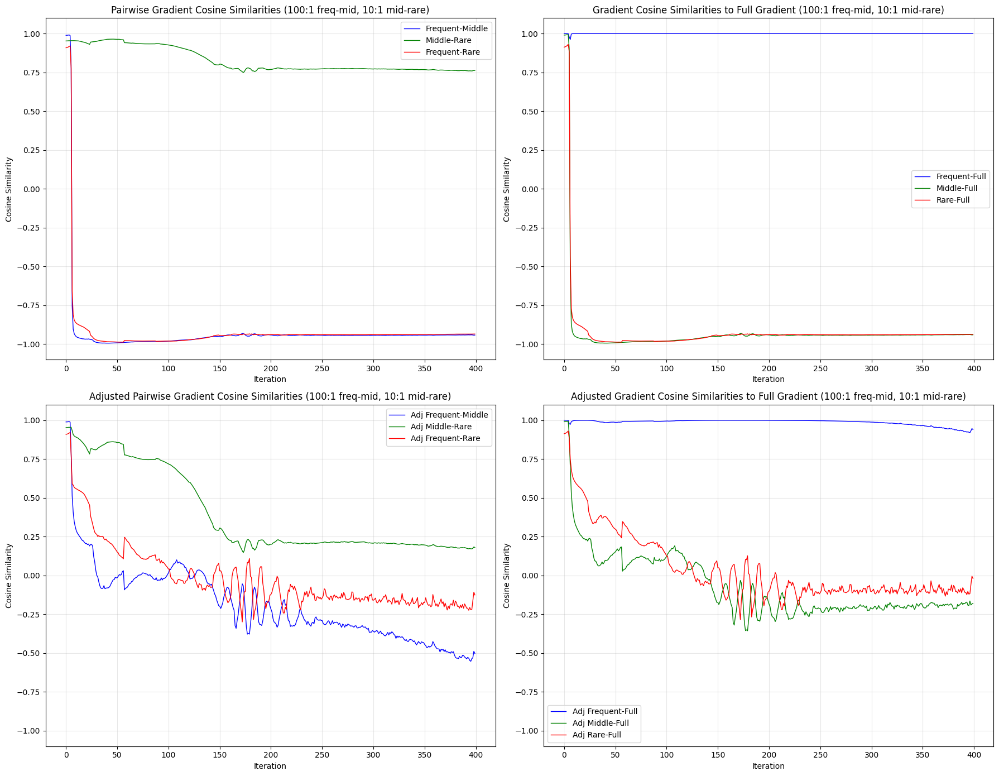

469/469 [==============================] - 0s 935us/step
=== Performance Evaluation ===

Test Set MAE:
Overall: 0.1395
Frequent bin: 0.0683
Middle bin: 0.1214
Rare bin: 0.2287


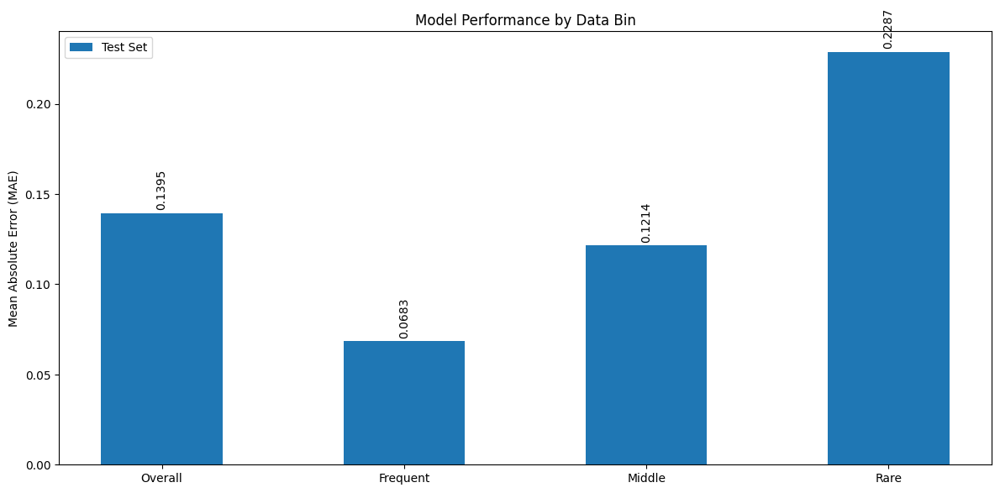

In [38]:
# Run a test with imbalance ratios and plot the results including cosine similarity
# NOTE: 1000:1 IMBALANCED - NO IMPORTANCE WEIGHTING - ADJUSTED GRADIENTS - NO CHECKING FOR CONFLICTS
imb_ratio_freq_midd = 10  # Ratio between frequent and middle samples
imb_ratio_midd_rare = 100   # Ratio between middle and rare samples
# resulting in Ratio between frequent and rare of 1000:1

# Test with specific imbalance ratios
X_train, y_train, sample_weights_train = dataset.get_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)
X_val, y_val, sample_weights_val = dataset.get_val_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)

# Plot dataset
plot_dataset(
    dataset=dataset,
    X=X_train, 
    y=y_train, 
    X_val=X_val, 
    y_val=y_val,
    title=f"Dataset with {imb_ratio_freq_midd}:1 (freq:midd) and {imb_ratio_midd_rare}:1 (midd:rare) Imbalance Ratios",
    draw_circles=True,
    debug=False
)

# Plot balanced test dataset
plot_dataset(
    dataset=test_dataset,
    X=X_test, 
    y=y_test, 
    title="Balanced Test Dataset (1:1:1 ratio)",
    draw_circles=True,
    debug=False
)

# Train model
print(f"Training model with {len(X_train)} training samples and {len(X_val)} validation samples")
model = create_simple_model(weight_decay=weight_decay)

# Use updated beta parameter for gradient adjustment
beta_strategy = 'interpolate'  # Try different strategies: 'idea1', 'idea2', 'idea12', 'interpolate'
check_conflicts = True
adjust_gradients = True

# Train with dataset object so gradient cosine similarity can be calculated
history = train_model(
    model=model, 
    dataset=dataset,
    X_train=X_train, 
    y_train=y_train, 
    X_val=X_val, 
    y_val=y_val, 
    sample_weights_train=None,
    sample_weights_val=None,
    epochs=epochs, 
    batch_size=11010,
    lr=lr,
    adjust_gradients=adjust_gradients,
    grad_adjust_beta=beta_strategy,  # Using the beta strategy
    check_conflicts=check_conflicts,
    debug=False
)  

# Plot training results
plot_training_curves(history)

# Plot all gradient cosine similarities in one figure
plot_all_grad_cos_sims(
    history=history, 
    imb_ratio_freq_midd=imb_ratio_freq_midd,
    imb_ratio_midd_rare=imb_ratio_midd_rare,
    trend=False,
    y_limit=1.1
)

# Evaluate on balanced test set
test_results = report_performance(
    model, 
    test_dataset,  # Balanced test dataset
    X_test, y_test
)

# Save the model performance metrics for later comparison
performance_summary = {
    'beta_strategy': beta_strategy,
    'check_conflicts': check_conflicts,
    'imb_ratio_freq_midd': imb_ratio_freq_midd,
    'imb_ratio_midd_rare': imb_ratio_midd_rare,
    'test_mae': test_results,
}


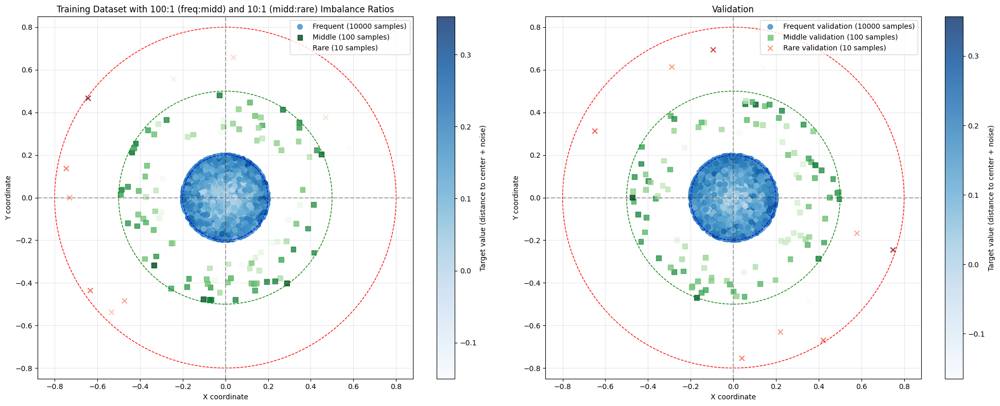

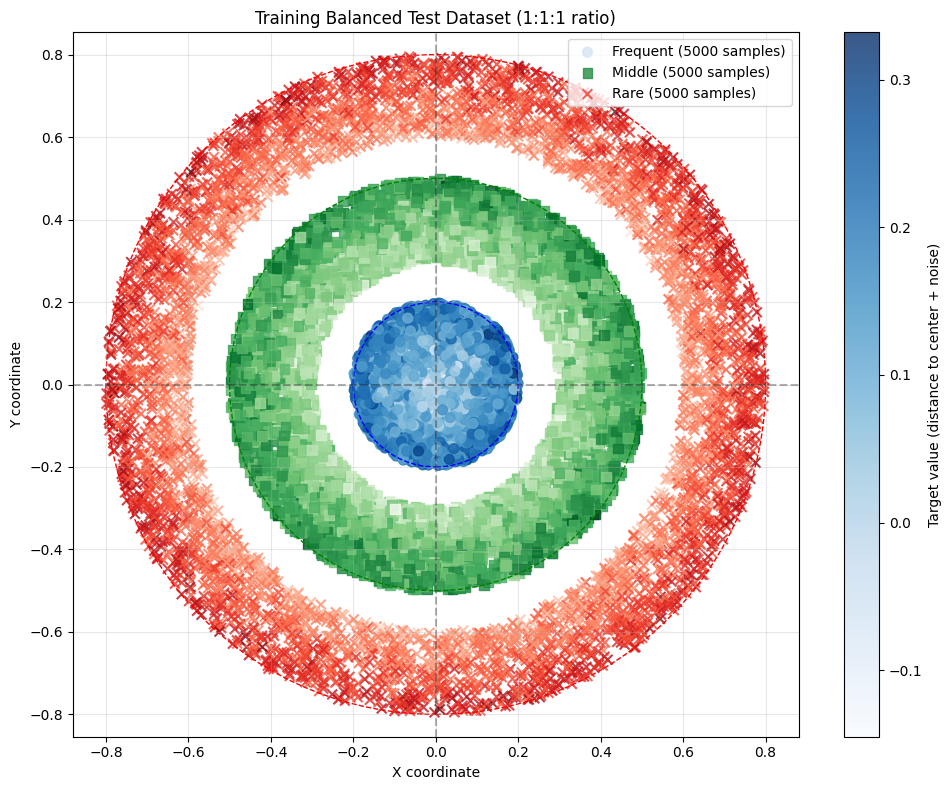

Training model with 10110 training samples and 10110 validation samples
Epoch 1/400 -               train_loss: 0.020584 - val_loss: 0.020489 -               num_params: 9 - param_norm: 1.4754
Epoch 2/400 -               train_loss: 0.018407 - val_loss: 0.018301 -               num_params: 9 - param_norm: 1.4871
Epoch 3/400 -               train_loss: 0.016449 - val_loss: 0.016334 -               num_params: 9 - param_norm: 1.4993
Epoch 4/400 -               train_loss: 0.014719 - val_loss: 0.014600 -               num_params: 9 - param_norm: 1.5118
Epoch 5/400 -               train_loss: 0.013232 - val_loss: 0.013108 -               num_params: 9 - param_norm: 1.5239
Epoch 6/400 -               train_loss: 0.012010 - val_loss: 0.011881 -               num_params: 9 - param_norm: 1.5355
Epoch 7/400 -               train_loss: 0.011057 - val_loss: 0.010922 -               num_params: 9 - param_norm: 1.5467
Epoch 8/400 -               train_loss: 0.010358 - val_loss: 0.010218 -          

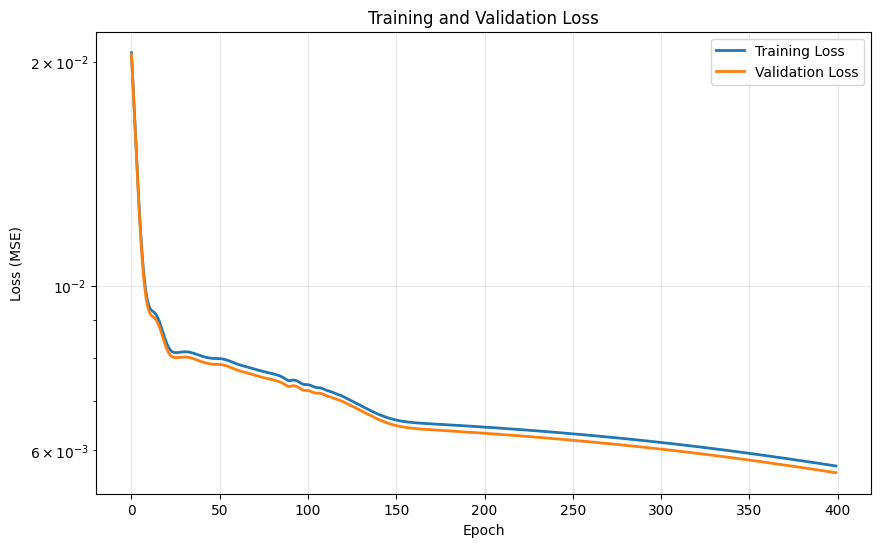

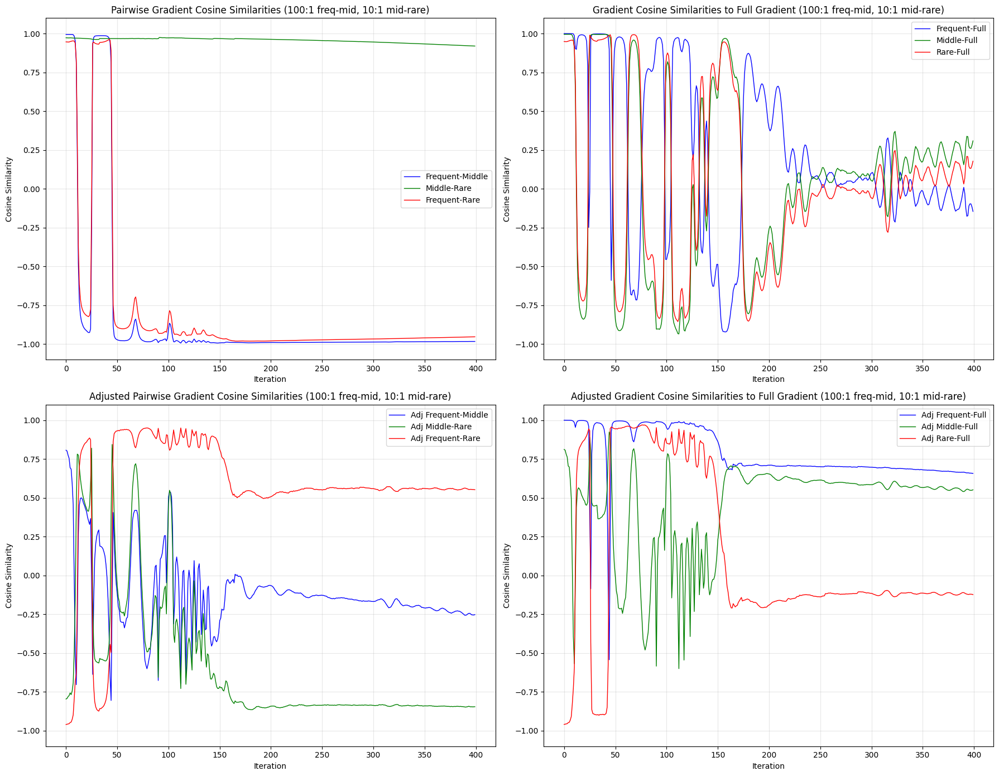

469/469 [==============================] - 1s 974us/step
=== Performance Evaluation ===

Test Set MAE:
Overall: 0.2684
Frequent bin: 0.0556
Middle bin: 0.2283
Rare bin: 0.5212


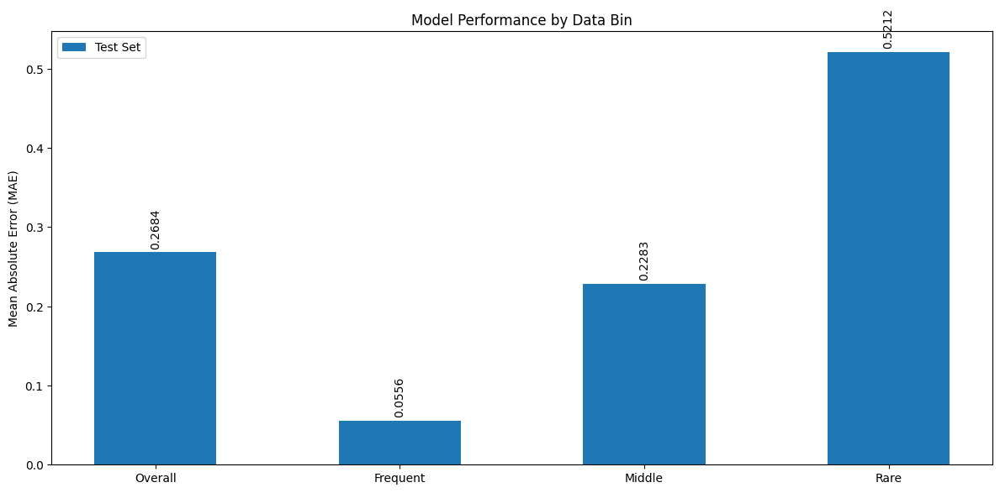

In [39]:
# Run a test with imbalance ratios and plot the results including cosine similarity
# NOTE: 1000:1 IMBALANCED - NO IMPORTANCE WEIGHTING - ADJUSTED GRADIENTS - NO CHECKING FOR CONFLICTS
imb_ratio_freq_midd = 10  # Ratio between frequent and middle samples
imb_ratio_midd_rare = 100   # Ratio between middle and rare samples

# Test with specific imbalance ratios
X_train, y_train, sample_weights_train = dataset.get_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)
X_val, y_val, sample_weights_val = dataset.get_val_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)

# Plot dataset
plot_dataset(
    dataset=dataset,
    X=X_train, 
    y=y_train, 
    X_val=X_val, 
    y_val=y_val,
    title=f"Dataset with {imb_ratio_freq_midd}:1 (freq:midd) and {imb_ratio_midd_rare}:1 (midd:rare) Imbalance Ratios",
    draw_circles=True,
    debug=False
)

# Plot balanced test dataset
plot_dataset(
    dataset=test_dataset,
    X=X_test, 
    y=y_test, 
    title="Balanced Test Dataset (1:1:1 ratio)",
    draw_circles=True,
    debug=False
)

# Train model
print(f"Training model with {len(X_train)} training samples and {len(X_val)} validation samples")
model = create_simple_model(weight_decay=weight_decay)

# Use updated beta parameter for gradient adjustment
beta_strategy = 'idea2'  # Try different strategies: 'idea1', 'idea2', 'idea12', 'interpolate'
check_conflicts = False

# Train with dataset object so gradient cosine similarity can be calculated
history = train_model(
    model=model, 
    dataset=dataset,
    X_train=X_train, 
    y_train=y_train, 
    X_val=X_val, 
    y_val=y_val, 
    sample_weights_train=None,
    sample_weights_val=None,
    epochs=epochs, 
    batch_size=11010,
    lr=lr,
    adjust_gradients=True,
    grad_adjust_beta=beta_strategy,  # Using the beta strategy
    check_conflicts=check_conflicts,
    debug=False
)  

# Plot training results
plot_training_curves(history)

# Plot all gradient cosine similarities in one figure
plot_all_grad_cos_sims(
    history=history, 
    imb_ratio_freq_midd=imb_ratio_freq_midd,
    imb_ratio_midd_rare=imb_ratio_midd_rare,
    trend=False,
    y_limit=1.1
)

# Evaluate on balanced test set
test_results = report_performance(
    model, 
    test_dataset,  # Balanced test dataset
    X_test, y_test
)

# Save the model performance metrics for later comparison
performance_summary = {
    'beta_strategy': beta_strategy,
    'check_conflicts': check_conflicts,
    'imb_ratio_freq_midd': imb_ratio_freq_midd,
    'imb_ratio_midd_rare': imb_ratio_midd_rare,
    'test_mae': test_results,
}


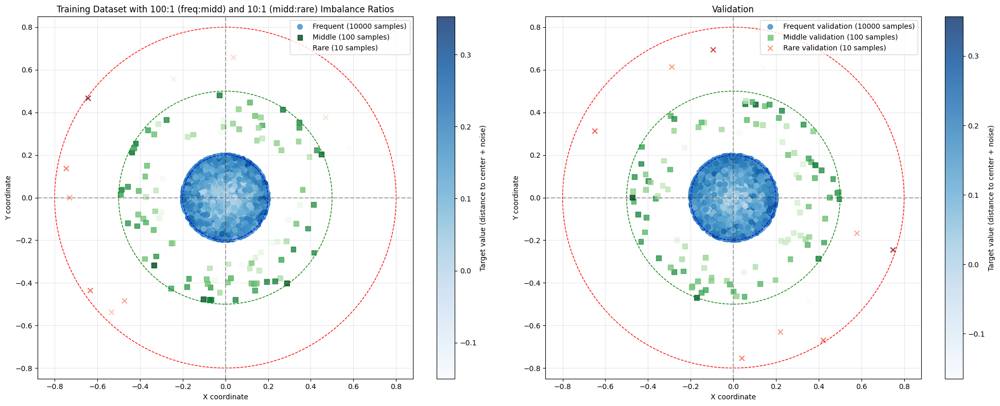

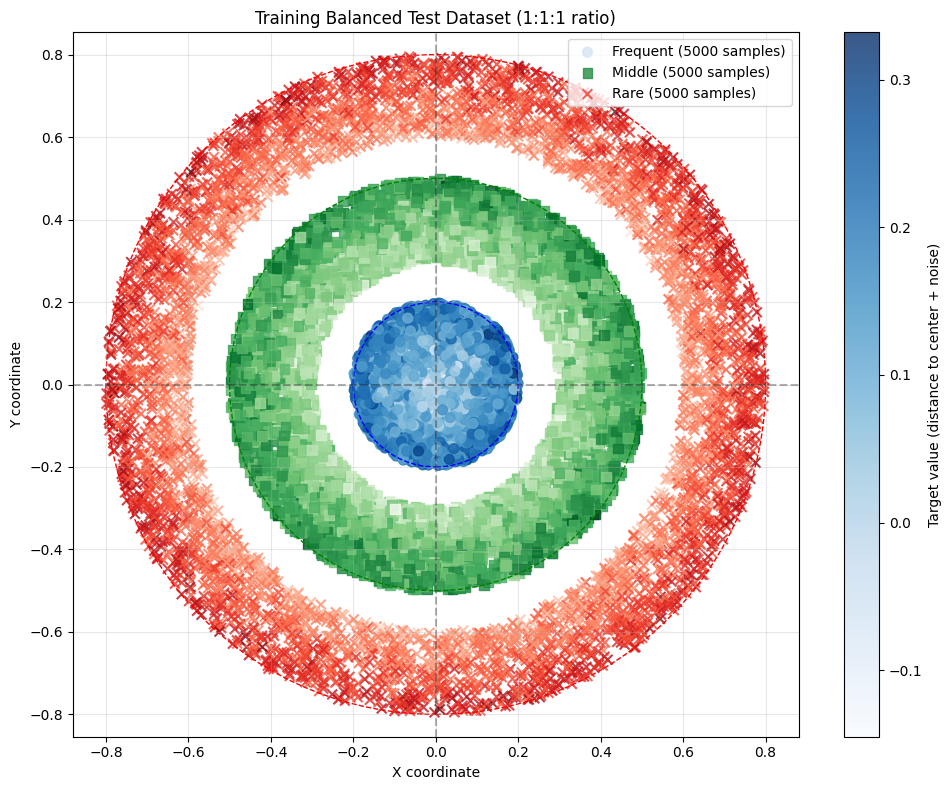

Training model with 10110 training samples and 10110 validation samples
Epoch 1/400 -               train_loss: 0.254297 - val_loss: 0.257022 -               num_params: 9 - param_norm: 1.5977
Epoch 2/400 -               train_loss: 0.241843 - val_loss: 0.244897 -               num_params: 9 - param_norm: 1.5774
Epoch 3/400 -               train_loss: 0.230094 - val_loss: 0.233443 -               num_params: 9 - param_norm: 1.5577
Epoch 4/400 -               train_loss: 0.219021 - val_loss: 0.222635 -               num_params: 9 - param_norm: 1.5387
Epoch 5/400 -               train_loss: 0.208602 - val_loss: 0.212448 -               num_params: 9 - param_norm: 1.5205
Epoch 6/400 -               train_loss: 0.198798 - val_loss: 0.202850 -               num_params: 9 - param_norm: 1.5032
Epoch 7/400 -               train_loss: 0.189577 - val_loss: 0.193810 -               num_params: 9 - param_norm: 1.4870
Epoch 8/400 -               train_loss: 0.180896 - val_loss: 0.185299 -          

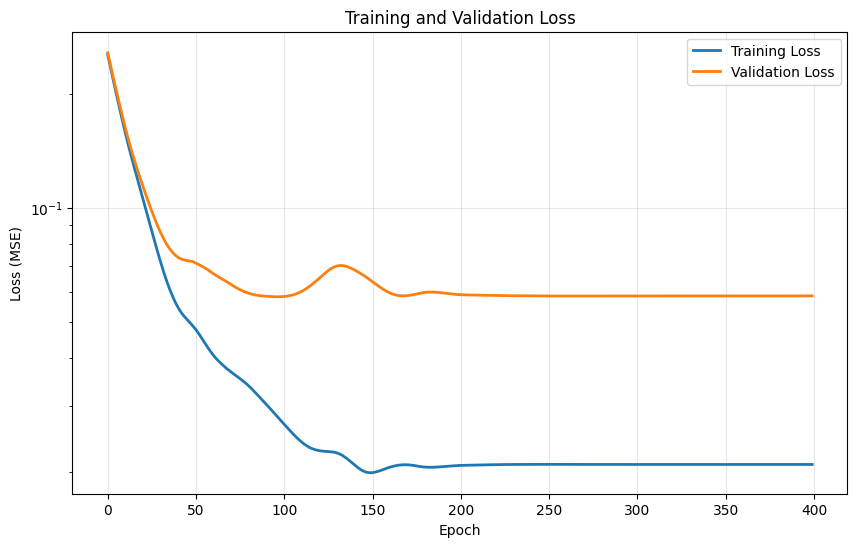

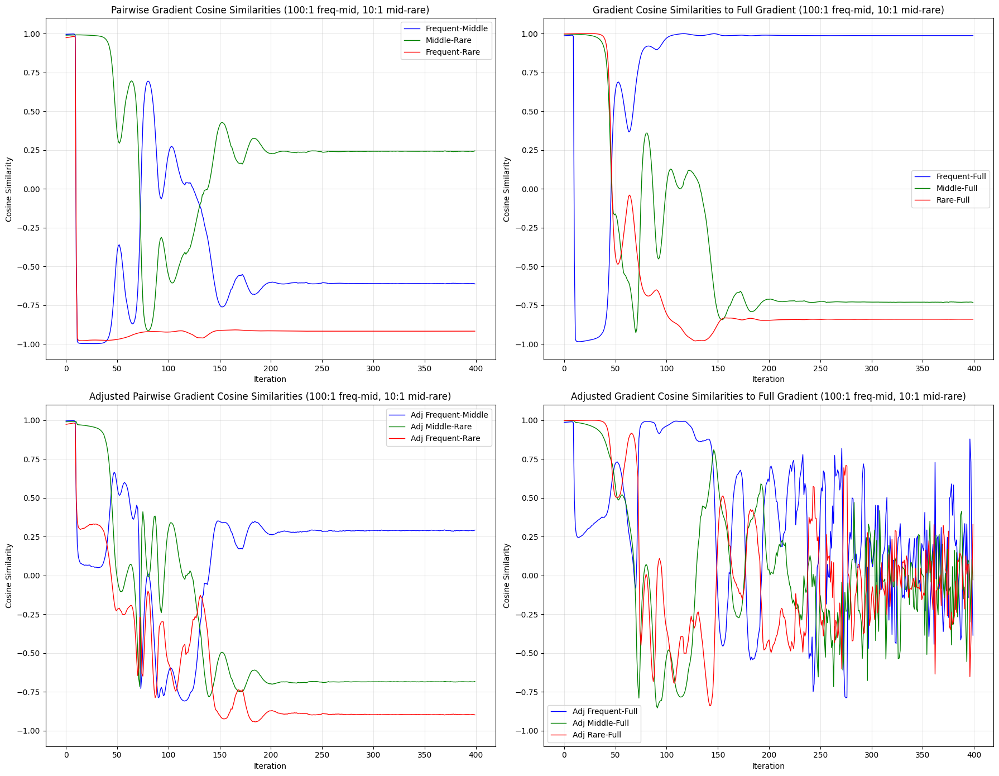

469/469 [==============================] - 0s 953us/step
=== Performance Evaluation ===

Test Set MAE:
Overall: 0.1526
Frequent bin: 0.1732
Middle bin: 0.0931
Rare bin: 0.1914


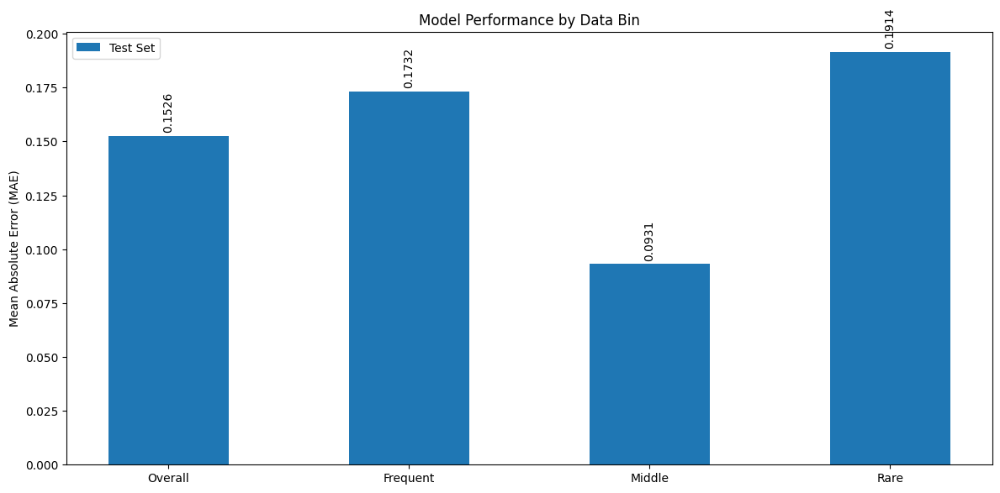

In [40]:
# Run a test with imbalance ratios and plot the results including cosine similarity
# NOTE: 1000:1 IMBALANCED - NO IMPORTANCE WEIGHTING - ADJUSTED GRADIENTS - NO CHECKING FOR CONFLICTS
imb_ratio_freq_midd = 10  # Ratio between frequent and middle samples
imb_ratio_midd_rare = 100   # Ratio between middle and rare samples

# Test with specific imbalance ratios
X_train, y_train, sample_weights_train = dataset.get_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)
X_val, y_val, sample_weights_val = dataset.get_val_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)

# Plot dataset
plot_dataset(
    dataset=dataset,
    X=X_train, 
    y=y_train, 
    X_val=X_val, 
    y_val=y_val,
    title=f"Dataset with {imb_ratio_freq_midd}:1 (freq:midd) and {imb_ratio_midd_rare}:1 (midd:rare) Imbalance Ratios",
    draw_circles=True,
    debug=False
)

# Plot balanced test dataset
plot_dataset(
    dataset=test_dataset,
    X=X_test, 
    y=y_test, 
    title="Balanced Test Dataset (1:1:1 ratio)",
    draw_circles=True,
    debug=False
)

# Train model
print(f"Training model with {len(X_train)} training samples and {len(X_val)} validation samples")
model = create_simple_model(weight_decay=weight_decay)

# Use updated beta parameter for gradient adjustment
beta_strategy = 'interpolate'  # Try different strategies: 'idea1', 'idea2', 'idea12', 'interpolate'
check_conflicts = True

# Train with dataset object so gradient cosine similarity can be calculated
history = train_model(
    model=model, 
    dataset=dataset,
    X_train=X_train, 
    y_train=y_train, 
    X_val=X_val, 
    y_val=y_val, 
    sample_weights_train=sample_weights_train,
    sample_weights_val=sample_weights_val,
    epochs=epochs, 
    batch_size=11010,
    lr=lr,
    adjust_gradients=True,
    grad_adjust_beta=beta_strategy,  # Using the beta strategy
    check_conflicts=check_conflicts,
    debug=False
)  

# Plot training results
plot_training_curves(history)

# Plot all gradient cosine similarities in one figure
plot_all_grad_cos_sims(
    history=history, 
    imb_ratio_freq_midd=imb_ratio_freq_midd,
    imb_ratio_midd_rare=imb_ratio_midd_rare,
    trend=False,
    y_limit=1.1
)

# Evaluate on balanced test set
test_results = report_performance(
    model, 
    test_dataset,  # Balanced test dataset
    X_test, y_test
)

# Save the model performance metrics for later comparison
performance_summary = {
    'beta_strategy': beta_strategy,
    'check_conflicts': check_conflicts,
    'imb_ratio_freq_midd': imb_ratio_freq_midd,
    'imb_ratio_midd_rare': imb_ratio_midd_rare,
    'test_mae': test_results,
}


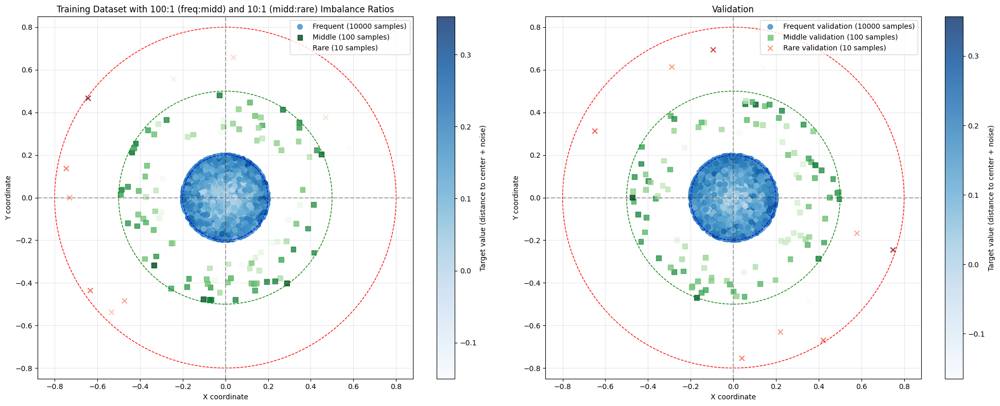

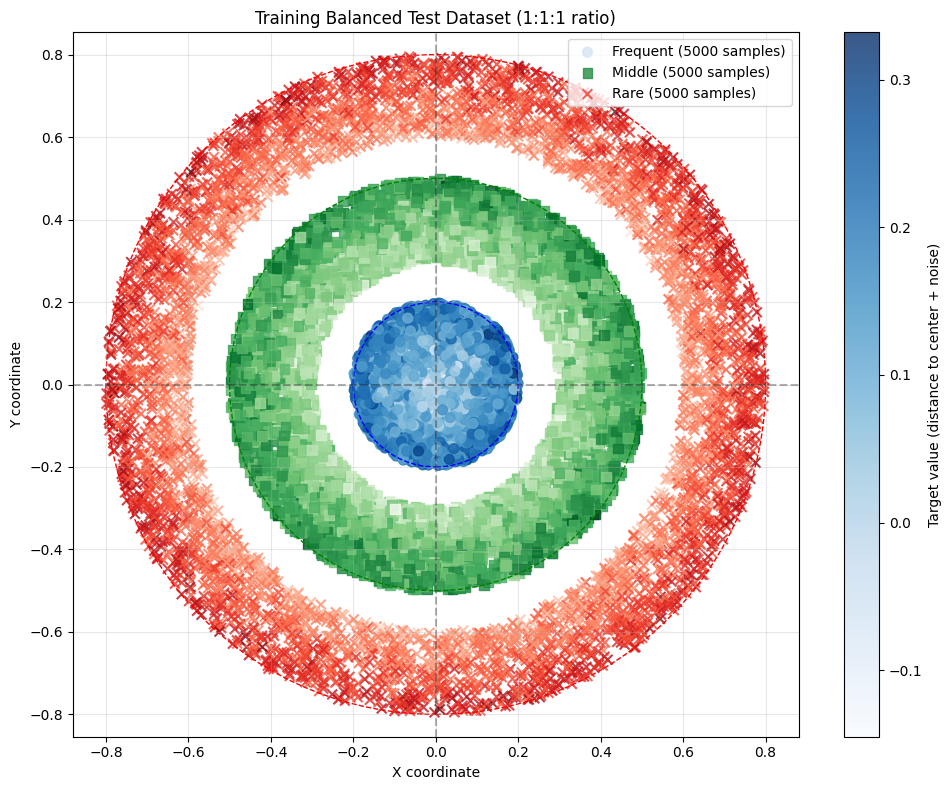

Training model with 10110 training samples and 10110 validation samples
Epoch 1/400 -               train_loss: 0.378152 - val_loss: 0.265929 -               num_params: 9 - param_norm: 1.7646
Epoch 2/400 -               train_loss: 0.352245 - val_loss: 0.248103 -               num_params: 9 - param_norm: 1.7572
Epoch 3/400 -               train_loss: 0.327180 - val_loss: 0.231259 -               num_params: 9 - param_norm: 1.7503
Epoch 4/400 -               train_loss: 0.303237 - val_loss: 0.215487 -               num_params: 9 - param_norm: 1.7439
Epoch 5/400 -               train_loss: 0.280681 - val_loss: 0.200815 -               num_params: 9 - param_norm: 1.7381
Epoch 6/400 -               train_loss: 0.259589 - val_loss: 0.187287 -               num_params: 9 - param_norm: 1.7328
Epoch 7/400 -               train_loss: 0.240057 - val_loss: 0.174845 -               num_params: 9 - param_norm: 1.7282
Epoch 8/400 -               train_loss: 0.222066 - val_loss: 0.163542 -          

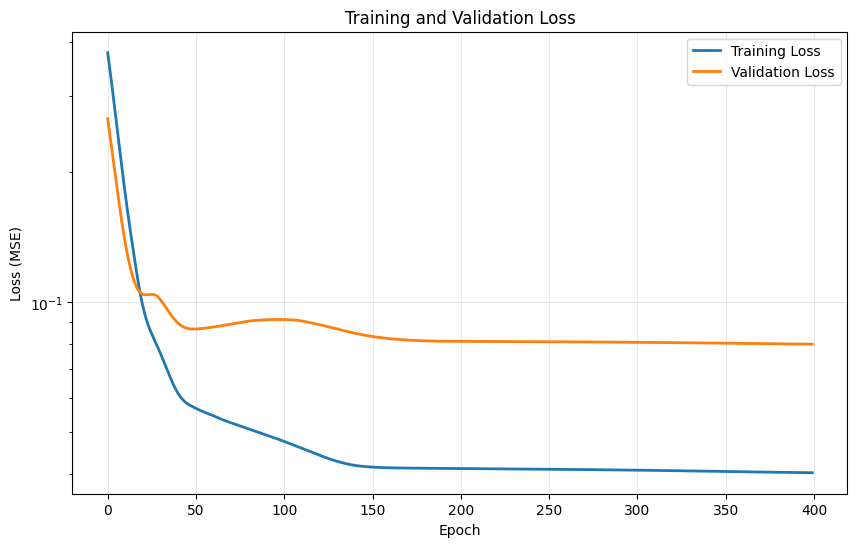

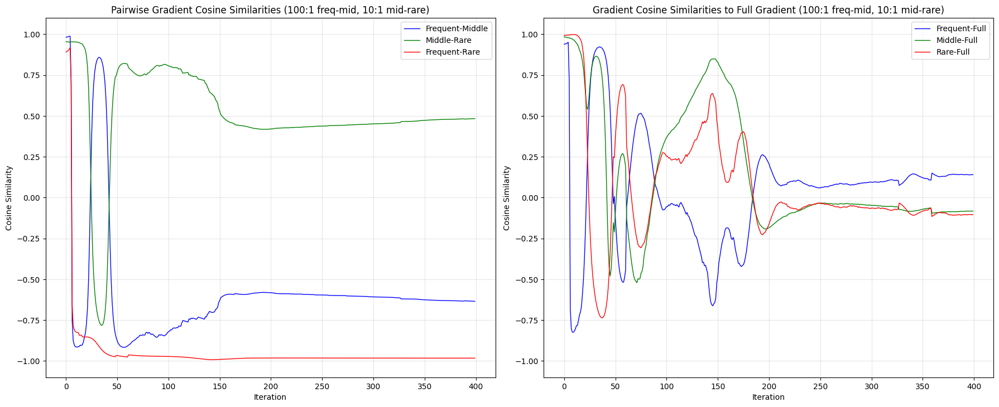

469/469 [==============================] - 0s 959us/step
=== Performance Evaluation ===

Test Set MAE:
Overall: 0.2145
Frequent bin: 0.2183
Middle bin: 0.1185
Rare bin: 0.3068


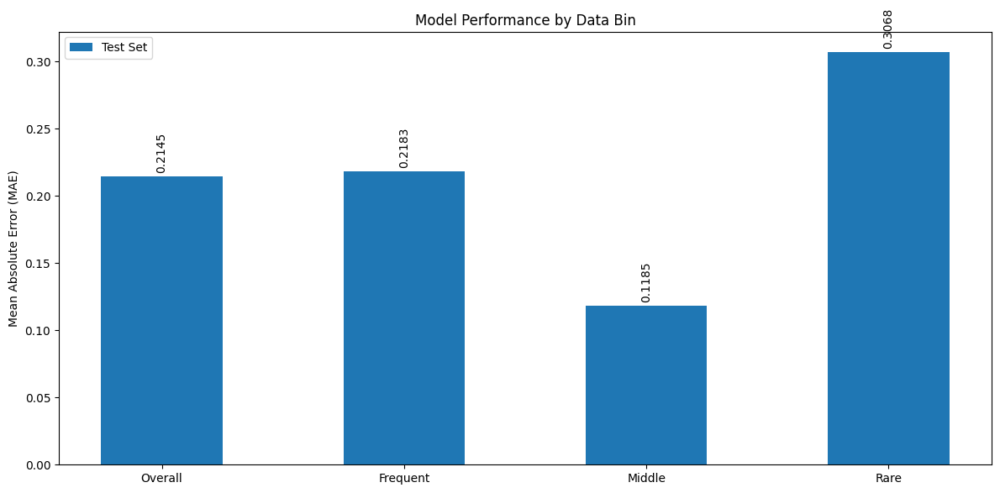

In [41]:
# Run a test with imbalance ratios and plot the results including cosine similarity
# NOTE: 1000:1 IMBALANCED - NO IMPORTANCE WEIGHTING - ADJUSTED GRADIENTS - NO CHECKING FOR CONFLICTS
imb_ratio_freq_midd = 10  # Ratio between frequent and middle samples
imb_ratio_midd_rare = 100   # Ratio between middle and rare samples

# Test with specific imbalance ratios
X_train, y_train, sample_weights_train = dataset.get_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)
X_val, y_val, sample_weights_val = dataset.get_val_dataset(
    imbalance_ratio_freq_midd=imb_ratio_freq_midd,
    imbalance_ratio_midd_rare=imb_ratio_midd_rare
)

# Plot dataset
plot_dataset(
    dataset=dataset,
    X=X_train, 
    y=y_train, 
    X_val=X_val, 
    y_val=y_val,
    title=f"Dataset with {imb_ratio_freq_midd}:1 (freq:midd) and {imb_ratio_midd_rare}:1 (midd:rare) Imbalance Ratios",
    draw_circles=True,
    debug=False
)

# Plot balanced test dataset
plot_dataset(
    dataset=test_dataset,
    X=X_test, 
    y=y_test, 
    title="Balanced Test Dataset (1:1:1 ratio)",
    draw_circles=True,
    debug=False
)

# Train model
print(f"Training model with {len(X_train)} training samples and {len(X_val)} validation samples")
model = create_simple_model(weight_decay=weight_decay)

# Use updated beta parameter for gradient adjustment
beta_strategy = 'interpolate'  # Try different strategies: 'idea1', 'idea2', 'idea12', 'interpolate'
check_conflicts = True

# Train with dataset object so gradient cosine similarity can be calculated
history = train_model(
    model=model, 
    dataset=dataset,
    X_train=X_train, 
    y_train=y_train, 
    X_val=X_val, 
    y_val=y_val, 
    sample_weights_train=sample_weights_train,
    sample_weights_val=sample_weights_val,
    epochs=epochs, 
    batch_size=11010,
    lr=lr,
    adjust_gradients=False,
    grad_adjust_beta=beta_strategy,  # Using the beta strategy
    check_conflicts=check_conflicts,
    debug=False
)  

# Plot training results
plot_training_curves(history)

# Plot all gradient cosine similarities in one figure
plot_all_grad_cos_sims(
    history=history, 
    imb_ratio_freq_midd=imb_ratio_freq_midd,
    imb_ratio_midd_rare=imb_ratio_midd_rare,
    trend=False,
    y_limit=1.1
)

# Evaluate on balanced test set
test_results = report_performance(
    model, 
    test_dataset,  # Balanced test dataset
    X_test, y_test
)

# Save the model performance metrics for later comparison
performance_summary = {
    'beta_strategy': beta_strategy,
    'check_conflicts': check_conflicts,
    'imb_ratio_freq_midd': imb_ratio_freq_midd,
    'imb_ratio_midd_rare': imb_ratio_midd_rare,
    'test_mae': test_results,
}
